# NOTEBOOK CLASIFICACIÓN IMÁGENES ASTRONÓMICAS

## 0. -> LIBRERÍAS, SEMILLA Y DATOS INICIALES

In [1]:
import tensorflow as tf
import numpy as np

print("TensorFlow version:", tf.__version__)
print("NumPy version:", np.__version__)

# Verifica si TensorFlow detecta las GPU disponibles
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

2024-10-25 10:35:32.713802: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-25 10:35:32.731214: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-25 10:35:32.736580: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-25 10:35:32.749273: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-25 10:35:34.000756: W tensorflow/compiler/tf2

TensorFlow version: 2.17.0
NumPy version: 1.26.4
Num GPUs Available:  1


In [2]:

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import os
import h5py
import requests
from tqdm import tqdm
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, measure
from skimage.io import imread
import random



In [3]:
np.random.seed(42)
tf.random.set_seed(42)

## 1. DATOS

In [7]:
# Cargar las etiquetas de ButaTableA
columnas = ["ID", "cig", "PGC Number", 
            "Phase 1 classification", "Phase 2 clasiffication", 
            "Phase1Family", "Phase2Family"]


ButaTableA = pd.read_csv('001.DATOS/Buta_TABLEa.csv',names=columnas)

ButaTableA

,ID,cig,PGC Number,Phase 1 classification,Phase 2 clasiffication,Phase1Family,Phase2Family
0,1,1,205,SA(r_s)bc ...,SA(rs)bc ...,SA,SA
1,2,2,223,SB(rs)cd ...,SB(rs)cd ...,SB,SB
2,3,4,279,SA(rs)c sp ...,SA(rs)c ...,SA,SA
3,4,5,602,SA(s)b: ...,SA(rs)b: ...,SA,SA
4,5,6,652,SAB(s)m / RG? pec ...,SB(s)m pec or Pec (merger) ...,SAB,SB
...,...,...,...,...,...,...,...
717,718,1046,72888,SA_B(rs)c ...,SB(r_s)c ...,SAB,SB
718,719,1047,72983,Sd: sp ...,Sc spw pec ...,S,S
719,720,1048,73023,SB(s)c ...,SB(s)c ...,SB,SB
720,721,1050,73100,SAB(s)cd ...,SAB(s)c ...,SAB,SAB


In [8]:
import pandas as pd

columnas = [
    "ID", "cig", "PGCNumber", "T", "AC", 
    "OuterVariety", "Family", "InnerVariety", "Stage", "Spindle", 
    "Peculiar", "Other"
]

ButaTableB = pd.read_csv('001.DATOS/Buta_TABLEb.csv', names=columnas)

ButaTableB

,ID,cig,PGCNumber,T,AC,OuterVariety,Family,InnerVariety,Stage,Spindle,Peculiar,Other
0,1,1,205,4.0,9,NaN,SA,(rs),bc,NaN,NaN,NaN
1,2,2,223,6.0,5,NaN,SB,(rs),cd,NaN,NaN,NaN
2,3,4,279,5.0,3,NaN,SA,(rs),c,sp,NaN,NaN
3,4,5,602,3.0,99,NaN,SA,(r_s),b:,NaN,NaN,NaN
4,5,6,652,9.0,4,NaN,SA_B,(s),m,NaN,pec,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
717,718,1046,72888,5.0,12:,NaN,SB,(rs),c,NaN,NaN,NaN
718,719,1047,72983,6.0,2,NaN,S,NaN,cd:,spw,pec,NaN
719,720,1048,73023,5.0,9,NaN,SB,(s),c,NaN,NaN,NaN
720,721,1050,73100,5.5,4,NaN,SAB,(s),_cd,NaN,NaN,NaN


In [9]:

CoordenadasCIG = pd.read_csv('001.DATOS/COORDINATES.csv')

# Filtrar solo las columnas 'ASC_D_J2000' y 'DEC_D_J2000'
CoordenadasCIG = CoordenadasCIG[["cig",'ASC_D_J2000', 'DEC_D_J2000']]

# Mostrar las primeras filas del DataFrame filtrado
CoordenadasCIG



,cig,ASC_D_J2000,DEC_D_J2000
0,1,0.77345,-1.9143
1,2,0.83487,29.7972
2,3,0.84108,30.7821
3,4,0.99487,20.7524
4,5,1.97625,20.4123
...,...,...,...
1046,1047,359.19825,1.3550
1047,1048,359.34995,30.9920
1048,1049,359.38987,37.0290
1049,1050,359.63387,26.2148


FALTA HCG. EL CODIGO DE ABAJO

In [10]:
df_imagenes_validacion = pd.read_csv("/home/users/dae/rauldiez/simbad/resultados.csv")

df_imagenes_validacion

,galaxy_name,morphology
0,HCG06d,Sbc C
1,HCG06b,Sab D
2,HCG06c,E... D
3,HCG07b,S C
4,HCG01d,S0 D
...,...,...
188,HCG99a,Sab D
189,HCG99b,E... D
190,HCG99d,S0a D
191,HCG99e,S0 D


In [11]:
import pandas as pd

# Cargar el archivo de texto en un DataFrame, asumiendo que está separado por espacios o tabulaciones
df_txt = pd.read_csv('001.DATOS/R50_SM_HCG.txt', delim_whitespace=True)

# Seleccionar solo las columnas que necesitamos ('HCG', 'ra', 'dec')
df_txt = df_txt[['HCG', 'ra', 'dec',"R50(arcsec)"]]

df_HCG = pd.merge(df_imagenes_validacion, df_txt, left_on='galaxy_name', right_on='HCG', how='inner')

df_HCG


/tmp/ipykernel_297820/2833288129.py:4: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df_txt = pd.read_csv('001.DATOS/R50_SM_HCG.txt', delim_whitespace=True)


,galaxy_name,morphology,HCG,ra,dec,R50(arcsec)
0,HCG06d,Sbc C,HCG06d,9.7815,-8.4010,3.436
1,HCG06b,Sab D,HCG06b,9.7926,-8.3971,5.620
2,HCG06c,E... D,HCG06c,9.7961,-8.3998,3.870
3,HCG07b,S C,HCG07b,9.8243,0.9128,8.415
4,HCG01d,S0 D,HCG01d,6.4950,25.7252,2.848
...,...,...,...,...,...,...
188,HCG99a,Sab D,HCG99a,0.1581,28.3846,8.639
189,HCG99b,E... D,HCG99b,0.1957,28.4020,8.537
190,HCG99d,S0a D,HCG99d,0.1879,28.3717,3.648
191,HCG99e,S0 D,HCG99e,0.1767,28.3690,1.825


In [12]:
# Leer el archivo CSV simplificado
df_CIG_Geometria = pd.read_csv('001.DATOS/GEOMETRY.csv', header=None)

# Renombrar las columnas (suponiendo que tienes solo 3 columnas)
df_CIG_Geometria.columns = ['ID_Galaxia', 'cig', 'ANG_SIZE_MAJ_log']


df_CIG_Geometria


,ID_Galaxia,cig,ANG_SIZE_MAJ_log
0,1,1,1.39
1,2,2,0.72
2,3,3,0.40
3,4,4,3.29
4,5,5,0.73
...,...,...,...
1046,1047,1047,2.04
1047,1048,1048,1.58
1048,1049,1049,0.68
1049,1050,1050,0.83


### 1.2.Union de columnas

In [13]:
# Realizar la combinación para obtener solo las filas coincidentes en la columna CIG
df_CIG= pd.merge(CoordenadasCIG, ButaTableA, on="cig")

df_CIG

,cig,ASC_D_J2000,DEC_D_J2000,ID,PGC Number,Phase 1 classification,Phase 2 clasiffication,Phase1Family,Phase2Family
0,1,0.77345,-1.9143,1,205,SA(r_s)bc ...,SA(rs)bc ...,SA,SA
1,2,0.83487,29.7972,2,223,SB(rs)cd ...,SB(rs)cd ...,SB,SB
2,4,0.99487,20.7524,3,279,SA(rs)c sp ...,SA(rs)c ...,SA,SA
3,5,1.97625,20.4123,4,602,SA(s)b: ...,SA(rs)b: ...,SA,SA
4,6,2.22791,23.8174,5,652,SAB(s)m / RG? pec ...,SB(s)m pec or Pec (merger) ...,SAB,SB
...,...,...,...,...,...,...,...,...,...
717,1046,358.91433,19.5157,718,72888,SA_B(rs)c ...,SB(r_s)c ...,SAB,SB
718,1047,359.19825,1.3550,719,72983,Sd: sp ...,Sc spw pec ...,S,S
719,1048,359.34995,30.9920,720,73023,SB(s)c ...,SB(s)c ...,SB,SB
720,1050,359.63387,26.2148,721,73100,SAB(s)cd ...,SAB(s)c ...,SAB,SAB


In [14]:
df_CIG= pd.merge(df_CIG,df_CIG_Geometria,on="cig")

df_CIG

,cig,ASC_D_J2000,DEC_D_J2000,ID,PGC Number,Phase 1 classification,Phase 2 clasiffication,Phase1Family,Phase2Family,ID_Galaxia,ANG_SIZE_MAJ_log
0,1,0.77345,-1.9143,1,205,SA(r_s)bc ...,SA(rs)bc ...,SA,SA,1,1.39
1,2,0.83487,29.7972,2,223,SB(rs)cd ...,SB(rs)cd ...,SB,SB,2,0.72
2,4,0.99487,20.7524,3,279,SA(rs)c sp ...,SA(rs)c ...,SA,SA,4,3.29
3,5,1.97625,20.4123,4,602,SA(s)b: ...,SA(rs)b: ...,SA,SA,5,0.73
4,6,2.22791,23.8174,5,652,SAB(s)m / RG? pec ...,SB(s)m pec or Pec (merger) ...,SAB,SB,6,0.70
...,...,...,...,...,...,...,...,...,...,...,...
717,1046,358.91433,19.5157,718,72888,SA_B(rs)c ...,SB(r_s)c ...,SAB,SB,1046,0.97
718,1047,359.19825,1.3550,719,72983,Sd: sp ...,Sc spw pec ...,S,S,1047,2.04
719,1048,359.34995,30.9920,720,73023,SB(s)c ...,SB(s)c ...,SB,SB,1048,1.58
720,1050,359.63387,26.2148,721,73100,SAB(s)cd ...,SAB(s)c ...,SAB,SAB,1050,0.83


FALTA HCG. 


## 2. OBTENCIÓN DE IMÁGENES ASTRONÓMICAS. 


MANUAL

In [15]:
# Función para generar la URL de la imagen SDSS
def get_sdss_image_url(ra, dec, scale, width=1024, height=1024):
    base_url = "http://skyserver.sdss.org/dr16/SkyServerWS/ImgCutout/getjpeg"
    return f"{base_url}?ra={ra}&dec={dec}&scale={scale}&width={width}&height={height}&opt=&TaskName=Skyserver.Chart.Image"

# Función para descargar una imagen
def download_image(url, filepath):
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()  # Verifica si hubo un error en la descarga
        with open(filepath, 'wb') as file:
            for chunk in response.iter_content(1024):
                file.write(chunk)
    except requests.HTTPError as e:
        print(f"Error downloading {filepath}: {e}")

# Función para convertir una imagen en un array NumPy
def image_to_array(filepath):
    try:
        with Image.open(filepath) as img:
            return np.array(img)
    except Exception as e:
        print(f"Error converting {filepath} to array: {e}")
        return None

# Función para procesar las imágenes, utilizando la escala para el nombre del directorio
# Función para procesar las imágenes, utilizando la escala para el nombre del directorio
def process_images(dataframe, scale):
    # Crear directorio basado en la escala
    output_dir = f'002.IMAGENES DESCARGADAS/sdss_images_{scale}scale'
    os.makedirs(output_dir, exist_ok=True)

    # Listas para almacenar arrays de imágenes, sus índices y los CIGs
    arrays_imagenes = []
    indices_imagenes = []
    cig_values = []

    # Verificar si ya existen imágenes en la carpeta
    existing_files = os.listdir(output_dir)
    existing_files = [file for file in existing_files if file.endswith('.jpg')]

    # Si ya existen imágenes en la carpeta, cargar esas imágenes en lugar de descargarlas
    if existing_files:
        print(f"Found {len(existing_files)} images in the folder. Loading them into arrays...")
        for filename in tqdm(existing_files):
            filepath = os.path.join(output_dir, filename)
            img_array = image_to_array(filepath)
            if img_array is not None:
                arrays_imagenes.append(img_array)
                # Extraemos el índice de la imagen desde el nombre del archivo
                index = int(filename.split('_')[1].split('.')[0]) - 1
                indices_imagenes.append(index)
                cig_values.append(dataframe.loc[index, 'cig'])
    else:
        # Descargar las imágenes y convertirlas a arrays
        for index, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
            ra, dec = row['ASC_D_J2000'], row['DEC_D_J2000']
            filename = f"image_{index+1}.jpg"
            filepath = os.path.join(output_dir, filename)
            
            # Descargar solo si la imagen no existe
            if not os.path.exists(filepath):
                url = get_sdss_image_url(ra, dec, scale=scale)
                download_image(url, filepath)
            
            # Convertir la imagen descargada a un array
            img_array = image_to_array(filepath)
            if img_array is not None:
                arrays_imagenes.append(img_array)
                indices_imagenes.append(index)
                cig_values.append(row['CIG'])  # Agregar el valor de CIG correspondiente

    # Convertir las listas de imágenes, sus índices y los CIGs a arrays NumPy
    return np.array(arrays_imagenes), np.array(indices_imagenes), np.array(cig_values)

In [13]:
datos_imagenes, indices_imagenes, cig_imagenes = process_images(df_CIG, scale=0.15)

# Crear DataFrame con los índices y las imágenes
df_imagenes = pd.DataFrame({
    'Indice': indices_imagenes,
    'Imagen': list(datos_imagenes),  # Convertimos los arrays en listas para almacenarlos
    'cig': cig_imagenes
})

# Mostrar información final
print(f'Datos de imágenes tienen forma: {datos_imagenes.shape}')
print(f'Índices de imágenes tienen forma: {indices_imagenes.shape}')


Found 722 images in the folder. Loading them into arrays...


100%|██████████| 722/722 [00:16<00:00, 44.14it/s]


Datos de imágenes tienen forma: (722, 1024, 1024, 3)
Índices de imágenes tienen forma: (722,)


In [16]:
def get_sdss_image_url(ra, dec, scale, width=1024, height=1024):
    base_url = "http://skyserver.sdss.org/dr16/SkyServerWS/ImgCutout/getjpeg"
    return f"{base_url}?ra={ra}&dec={dec}&scale={scale}&width={width}&height={height}&opt=&TaskName=Skyserver.Chart.Image"

# Función para descargar una imagen
def download_image(url, filepath):
    try:
        response = requests.get(url, stream=True)
        response.raise_for_status()  # Verifica si hubo un error en la descarga
        with open(filepath, 'wb') as file:
            for chunk in response.iter_content(1024):
                file.write(chunk)
    except requests.HTTPError as e:
        print(f"Error downloading {filepath}: {e}")

# Función para convertir una imagen en un array NumPy
def image_to_array(filepath):
    try:
        with Image.open(filepath) as img:
            return np.array(img)
    except Exception as e:
        print(f"Error converting {filepath} to array: {e}")
        return None

# Función para procesar las imágenes, utilizando la escala para el nombre del directorio
# Función para procesar las imágenes, utilizando la escala para el nombre del directorio
def process_images(dataframe, scale):
    # Crear directorio basado en la escala
    output_dir = f'002.IMAGENES DESCARGADAS/sdss_images_{scale}scale_HCG'
    os.makedirs(output_dir, exist_ok=True)

    # Listas para almacenar arrays de imágenes, sus índices y los CIGs
    arrays_imagenes = []
    indices_imagenes = []
    hcg_values = []

    # Verificar si ya existen imágenes en la carpeta
    existing_files = os.listdir(output_dir)
    existing_files = [file for file in existing_files if file.endswith('.jpg')]

    # Si ya existen imágenes en la carpeta, cargar esas imágenes en lugar de descargarlas
    if existing_files:
        print(f"Found {len(existing_files)} images in the folder. Loading them into arrays...")
        for filename in tqdm(existing_files):
            filepath = os.path.join(output_dir, filename)
            img_array = image_to_array(filepath)
            if img_array is not None:
                arrays_imagenes.append(img_array)
                # Extraemos el índice de la imagen desde el nombre del archivo
                index = int(filename.split('_')[1].split('.')[0]) - 1
                indices_imagenes.append(index)
                hcg_values.append(dataframe.loc[index, 'HCG'])
    else:
        # Descargar las imágenes y convertirlas a arrays
        for index, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
            ra, dec = row['ra'], row['dec']
            filename = f"image_{index+1}.jpg"
            filepath = os.path.join(output_dir, filename)
            
            # Descargar solo si la imagen no existe
            if not os.path.exists(filepath):
                url = get_sdss_image_url(ra, dec, scale=scale)
                download_image(url, filepath)
            
            # Convertir la imagen descargada a un array
            img_array = image_to_array(filepath)
            if img_array is not None:
                arrays_imagenes.append(img_array)
                indices_imagenes.append(index)
                hcg_values.append(row['HCG'])  # Agregar el valor de CIG correspondiente

    # Convertir las listas de imágenes, sus índices y los CIGs a arrays NumPy
    return np.array(arrays_imagenes), np.array(indices_imagenes), np.array(hcg_values)

In [17]:
datos_imagenes_hcg, indices_imagenes_hcg, hcg_imagenes = process_images(df_HCG, scale=0.15)

# Crear DataFrame con los índices y las imágenes
df_imagenes_HCG = pd.DataFrame({
    'Indice': indices_imagenes_hcg,
    'Imagen': list(datos_imagenes_hcg),  # Convertimos los arrays en listas para almacenarlos
    'HCG': hcg_imagenes
})

# Mostrar información final
print(f'Datos de imágenes tienen forma: {datos_imagenes_hcg.shape}')
print(f'Índices de imágenes tienen forma: {indices_imagenes_hcg.shape}')

Found 193 images in the folder. Loading them into arrays...


100%|██████████| 193/193 [00:01<00:00, 187.49it/s]


Datos de imágenes tienen forma: (193, 1024, 1024, 3)
Índices de imágenes tienen forma: (193,)


In [16]:
def mostrar_imagen_por_fila(fila):
    try:
        # Obtener la imagen del DataFrame a partir del número de fila
        img_array = df_imagenes.iloc[fila]["Imagen"]
        
        # Mostrar la imagen usando Matplotlib
        plt.figure(figsize=(5, 5))
        plt.imshow(img_array, cmap='gray')  # Mostrar en escala de grises
        plt.title(f'Fila: {fila}')  # Título con el número de fila
        plt.axis('off')  # Ocultar los ejes
        plt.show()
    except IndexError:
        print(f"La fila {fila} no existe en el DataFrame.")

def mostrar_imagen_por_fila_hcg(fila):
    try:
        # Obtener la imagen del DataFrame a partir del número de fila
        img_array = df_imagenes_HCG.iloc[fila]["Imagen"]
        
        # Mostrar la imagen usando Matplotlib
        plt.figure(figsize=(5, 5))
        plt.imshow(img_array, cmap='gray')  # Mostrar en escala de grises
        plt.title(f'Fila: {fila}')  # Título con el número de fila
        plt.axis('off')  # Ocultar los ejes
        plt.show()
    except IndexError:
        print(f"La fila {fila} no existe en el DataFrame.")

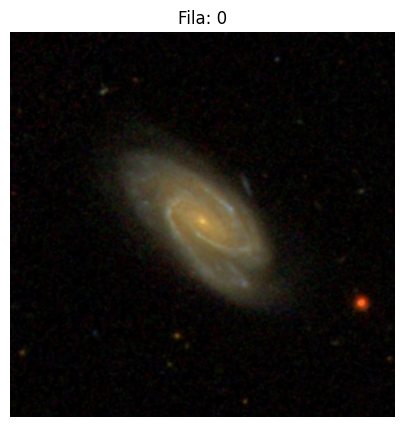

In [17]:
mostrar_imagen_por_fila(0)


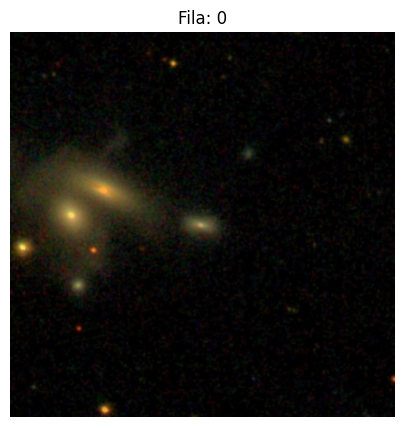

In [18]:
mostrar_imagen_por_fila_hcg(0)


AUTOMÁTICO

In [19]:
# Parámetros de la imagen
width = 1024  # Ancho de la imagen en píxeles
min_desired_pixels = 0.007 * width  # Mínimo que queremos que la galaxia ocupe (60%)
max_desired_pixels = 0.025 * width  # Máximo que queremos que la galaxia ocupe (90%)

# Función para calcular la escala automática con límites dinámicos
def calculate_dynamic_scale(ang_size_maj):
    # Calcular la escala para que el eje mayor ocupe entre 60% y 90% del ancho de la imagen
    scale_min = ang_size_maj / max_desired_pixels  # Escala para 90%
    scale_max = ang_size_maj / min_desired_pixels  # Escala para 60%
    
    # Promediar las escalas para un valor intermedio
    recommended_scale = (scale_min + scale_max) / 2
    return recommended_scale

# Aplicar la función a cada galaxia en el DataFrame df_CIG
df_CIG['Auto_Scale'] = df_CIG['ANG_SIZE_MAJ_log'].apply(calculate_dynamic_scale)

df_CIG['Auto_Scale']

0      0.124107
1      0.064286
2      0.293750
3      0.065179
4      0.062500
         ...   
717    0.086607
718    0.182143
719    0.141071
720    0.074107
721    0.052679
Name: Auto_Scale, Length: 722, dtype: float64

In [18]:
import numpy as np

# Parámetros de la imagen
width = 1024  # Ancho de la imagen en píxeles
min_desired_pixels = 0.022 * width  # Mínimo que queremos que la galaxia ocupe (60%)
max_desired_pixels = 0.036 * width  # Máximo que queremos que la galaxia ocupe (90%)

# Función para calcular la escala automática con logaritmo aplicado a R50(arcsec)
def calculate_dynamic_scale_with_log(r50_arcsec):
    # Aplicar logaritmo al valor de R50
    log_r50 = np.log(r50_arcsec)
    
    # Calcular la escala para que el eje mayor ocupe entre 60% y 90% del ancho de la imagen
    scale_min = log_r50 / max_desired_pixels  # Escala para 90%
    scale_max = log_r50 / min_desired_pixels  # Escala para 60%
    
    # Promediar las escalas para un valor intermedio
    recommended_scale = (scale_min + scale_max) / 2
    return recommended_scale

# Aplicar la función a cada galaxia en el DataFrame df_HCG
df_HCG['Auto_Scale'] = df_HCG['R50(arcsec)'].apply(calculate_dynamic_scale_with_log)

# Visualizar las escalas automáticas
df_HCG['Auto_Scale']

0      0.044136
1      0.061730
2      0.048390
3      0.076165
4      0.037425
         ...   
188    0.077104
189    0.076680
190    0.046277
191    0.021511
192    0.083407
Name: Auto_Scale, Length: 193, dtype: float64

In [21]:
# Función para procesar las imágenes, utilizando la escala calculada automáticamente
def process_images_auto(dataframe):
    output_dir = '002.IMAGENES DESCARGADAS/sdss_images_autoscale_CIG'
    os.makedirs(output_dir, exist_ok=True)
    
    arrays_imagenes = []
    indices_imagenes = []
    
    for index, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
        ra, dec = row['ASC_D_J2000'], row['DEC_D_J2000']
        auto_scale = row['Auto_Scale']  # Usamos la escala automática calculada
        filename = f"image_{index+1}.jpg"
        filepath = os.path.join(output_dir, filename)
        
        # Descargar solo si la imagen no existe
        if not os.path.exists(filepath):
            url = get_sdss_image_url(ra, dec, scale=auto_scale)
            download_image(url, filepath)
        
        # Convertir la imagen descargada a un array
        img_array = image_to_array(filepath)
        if img_array is not None:
            arrays_imagenes.append(img_array)
            indices_imagenes.append(index)

    return np.array(arrays_imagenes), np.array(indices_imagenes)

In [22]:
# Ejecutar el proceso con escalas automáticas
datos_imagenes, indices_imagenes = process_images_auto(df_CIG)

# Añadir una nueva columna 'Imagen_auto_scale' al DataFrame df_imagenes
df_imagenes['Imagen_auto_scale'] = list(datos_imagenes)  # Añadir los arrays de imágenes



  0%|          | 0/722 [00:00<?, ?it/s]

100%|██████████| 722/722 [00:14<00:00, 48.41it/s]


In [19]:
# Función para procesar las imágenes, utilizando la escala calculada automáticamente
def process_images_auto(dataframe):
    output_dir = '002.IMAGENES DESCARGADAS/sdss_images_autoscale_HCG'
    os.makedirs(output_dir, exist_ok=True)
    
    arrays_imagenes = []
    indices_imagenes = []
    
    for index, row in tqdm(dataframe.iterrows(), total=dataframe.shape[0]):
        ra, dec = row['ra'], row['dec']
        auto_scale = row['Auto_Scale']  # Usamos la escala automática calculada
        filename = f"image_{index+1}.jpg"
        filepath = os.path.join(output_dir, filename)
        
        # Descargar solo si la imagen no existe
        if not os.path.exists(filepath):
            url = get_sdss_image_url(ra, dec, scale=auto_scale)
            download_image(url, filepath)
        
        # Convertir la imagen descargada a un array
        img_array = image_to_array(filepath)
        if img_array is not None:
            arrays_imagenes.append(img_array)
            indices_imagenes.append(index)

    return np.array(arrays_imagenes), np.array(indices_imagenes)

In [20]:
# Ejecutar el proceso con escalas automáticas
datos_imagenes, indices_imagenes = process_images_auto(df_HCG)

# Añadir una nueva columna 'Imagen_auto_scale' al DataFrame df_imagenes
df_imagenes_HCG['Imagen_auto_scale'] = list(datos_imagenes)  # Añadir los arrays de imágenes


100%|██████████| 193/193 [00:00<00:00, 195.69it/s]


PRUEBAS BRILLO

In [25]:
# Función para conservar solo la galaxia, eliminando estrellas
def conservar_galaxia(imagen, umbral_brillo, tamano_min_galaxia):
    # Aplicar un umbral para detectar puntos brillantes (estrellas y galaxias)
    umbral = filters.threshold_otsu(imagen) * umbral_brillo
    regiones_binarias = imagen > umbral

    # Etiquetar las regiones conectadas (objetos en la imagen)
    etiquetas = measure.label(regiones_binarias)
    props = measure.regionprops(etiquetas)

    # Crear una máscara para las regiones grandes (galaxias)
    galaxias_mask = np.zeros_like(imagen)

    # Filtrar por tamaño: mantener solo las galaxias que superen el tamaño mínimo
    for prop in props:
        if prop.area >= tamano_min_galaxia:
            galaxias_mask[etiquetas == prop.label] = imagen[etiquetas == prop.label]

    return galaxias_mask

# Función para probar diferentes hiperparámetros
def probar_hiperparametros(imagen, umbrales_brillo, tamanos_min_galaxia):
    for umbral in umbrales_brillo:
        for tamano in tamanos_min_galaxia:
            # Aplicar el filtrado de galaxias con los parámetros actuales
            galaxia_filtrada = conservar_galaxia(imagen, umbral_brillo=umbral, tamano_min_galaxia=tamano)
            
            # Mostrar la imagen original y la filtrada
            mostrar_imagenes(imagen, galaxia_filtrada, 
                             f"Original (Umbral: {umbral}, Tamaño: {tamano})", 
                             f"Galaxia filtrada (Umbral: {umbral}, Tamaño: {tamano})")

# Función para mostrar las imágenes original y filtrada
def mostrar_imagenes(original, filtrada, titulo_original="Original", titulo_filtrada="Galaxia filtrada"):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title(titulo_original)
    axes[0].axis('off')
    axes[1].imshow(filtrada, cmap='gray')
    axes[1].set_title(titulo_filtrada)
    axes[1].axis('off')
    plt.show()

def guardar_imagen(imagen, filepath):
    try:
        # Convertir el array NumPy a una imagen PIL y guardar en el archivo
        img = Image.fromarray(imagen)
        img.save(filepath)
    except Exception as e:
        print(f"Error al guardar la imagen: {e}")

def procesar_y_guardar_imagenes(df_imagenes, umbral_brillo=0.4, tamano_min_galaxia=500):
    # Crear directorio para guardar las imágenes filtradas
    output_dir = '002.IMAGENES DESCARGADAS/galaxy_filtered'
    os.makedirs(output_dir, exist_ok=True)
    
    # Asegurarnos de que la columna 'Imagen_filtrada' exista en el DataFrame y esté lista para almacenar listas de arrays
    if 'Imagen_filtrada' not in df_imagenes.columns:
        df_imagenes['Imagen_filtrada'] = None
    
    # Añadir columna 'Imagen_filtrada' con las imágenes procesadas
    for index, row in df_imagenes.iterrows():
        filepath = os.path.join(output_dir, f"image_{index+1}.jpg")
        
        # Si la imagen ya existe, leerla y convertirla a array de numpy
        if os.path.exists(filepath):
            print(f"Imagen {filepath} ya existe. Cargando la imagen filtrada...")
            imagen_filtrada = imread(filepath)
        else:
            # Procesar la imagen si no ha sido filtrada antes
            imagen = row['Imagen_auto_scale']  # Acceder a la imagen escalada
            imagen_filtrada = conservar_galaxia(imagen, umbral_brillo=umbral_brillo, tamano_min_galaxia=tamano_min_galaxia)
            
            # Guardar la imagen filtrada en el directorio
            guardar_imagen(imagen_filtrada, filepath)
        
        # Añadir la imagen filtrada en formato de lista al DataFrame (convierto a lista para evitar el error de broadcast)
        df_imagenes.at[index, 'Imagen_filtrada'] = imagen_filtrada.tolist()

    return df_imagenes


Procesando imagen 1


/tmp/ipykernel_140807/62654336.py:4: UserWarning: threshold_otsu is expected to work correctly only for grayscale images; image shape (1024, 1024, 3) looks like that of an RGB image.
  umbral = filters.threshold_otsu(imagen) * umbral_brillo


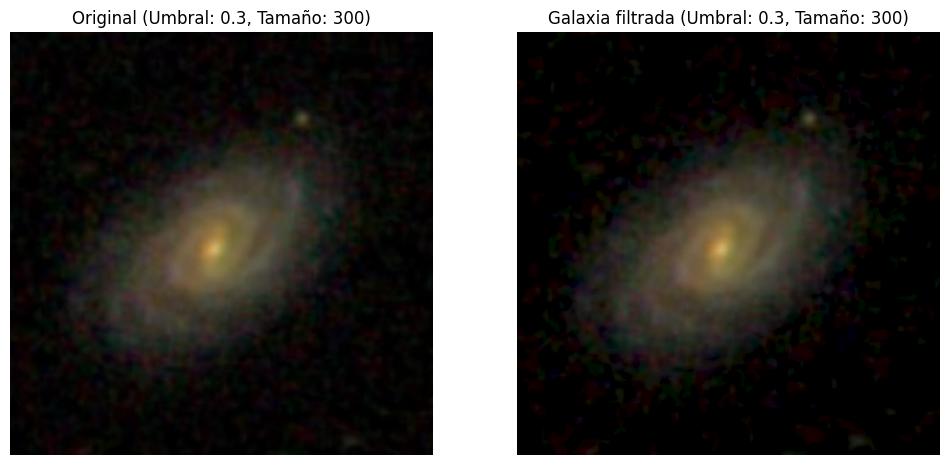

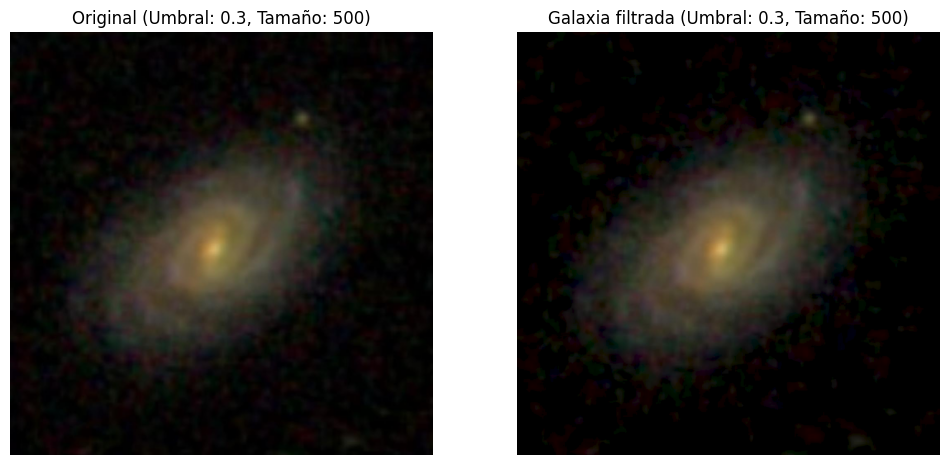

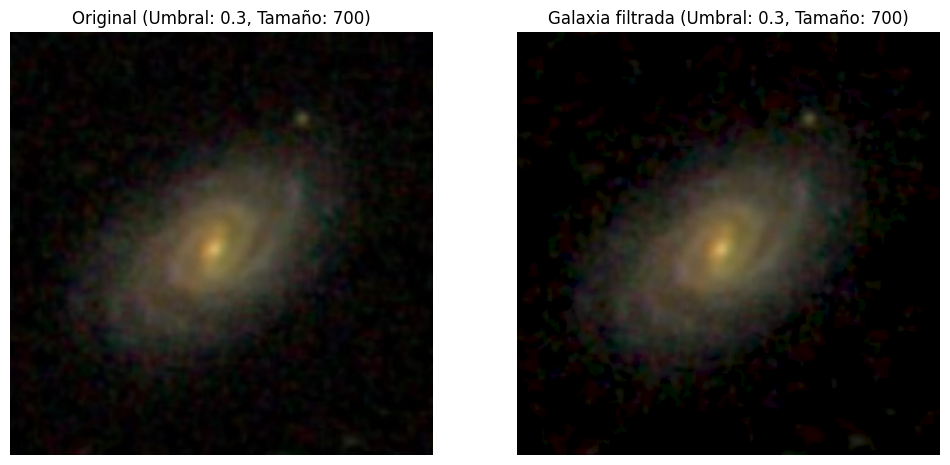

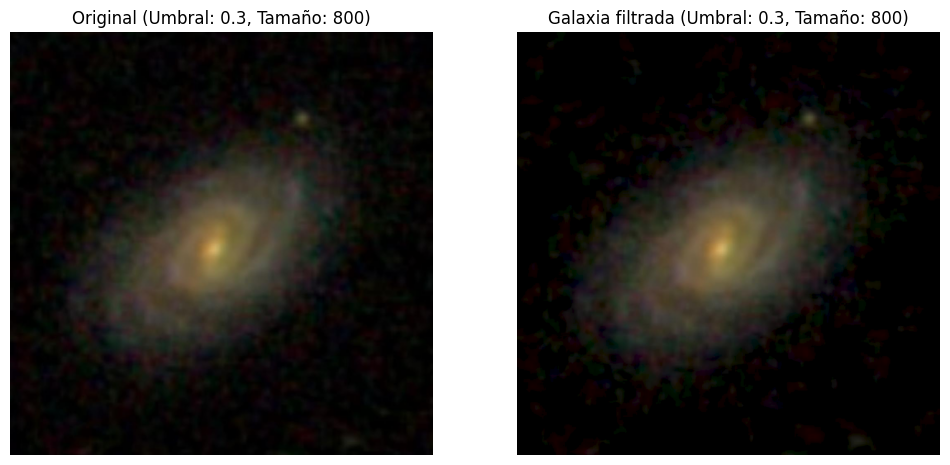

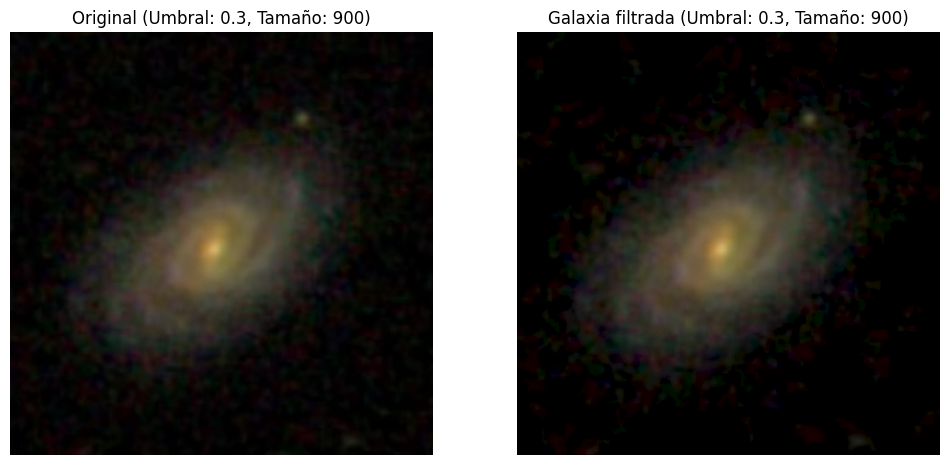

...

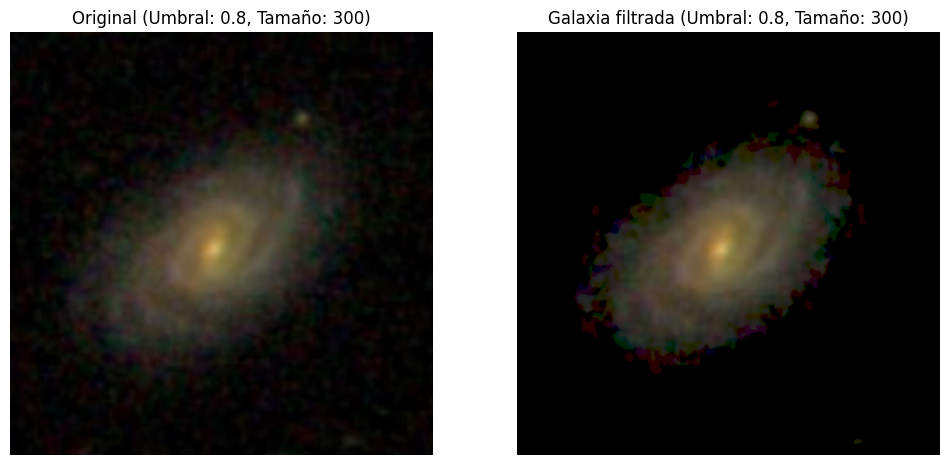

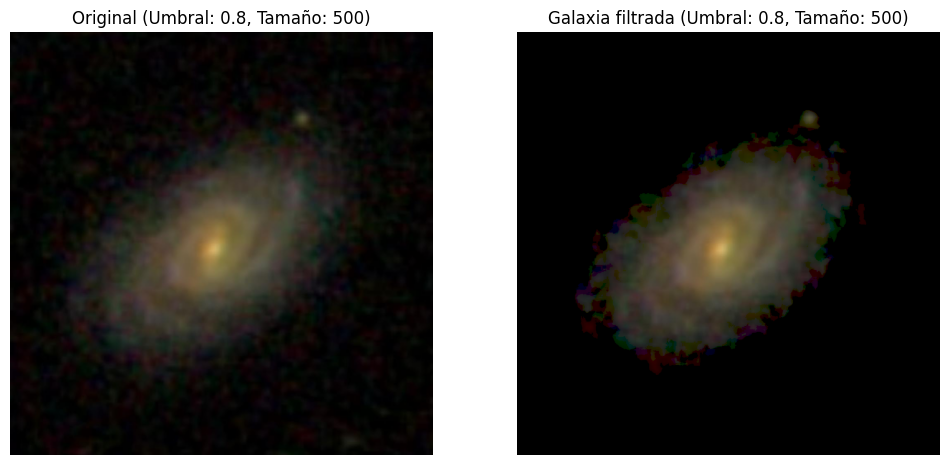

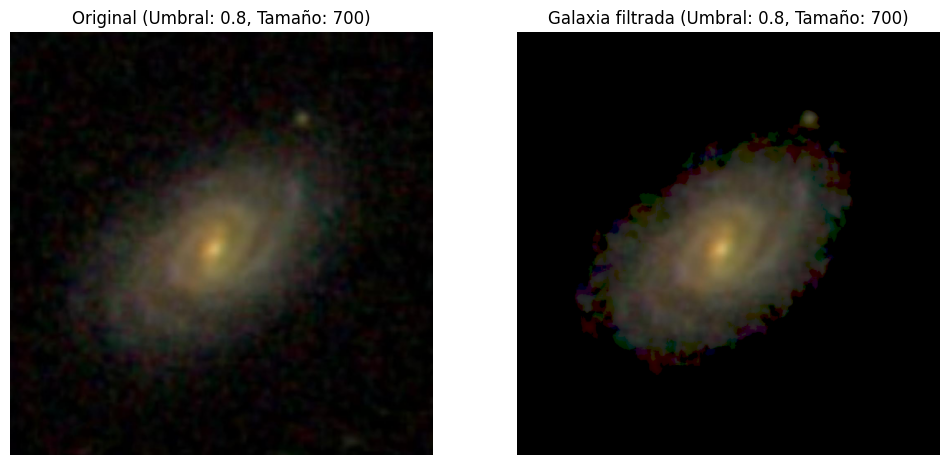

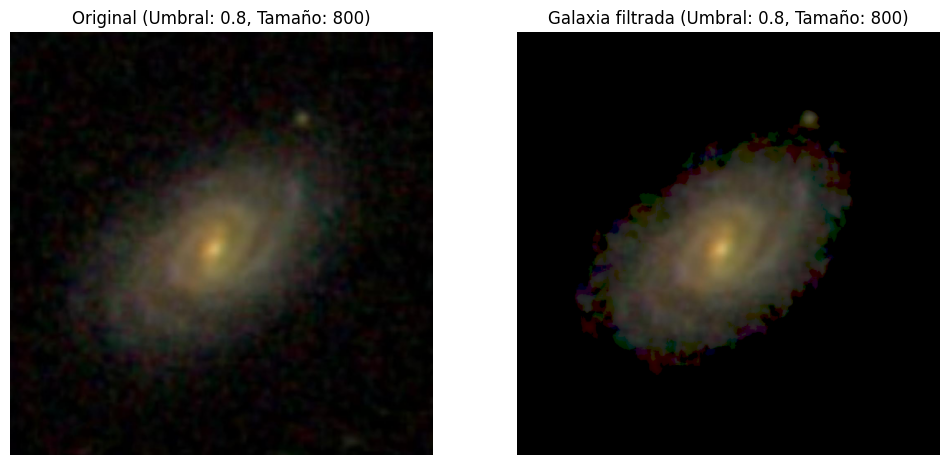

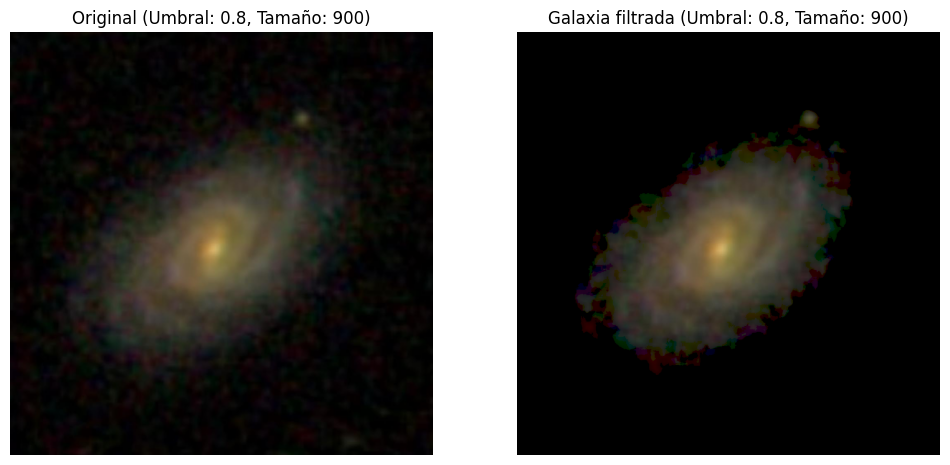


Procesando imagen 2


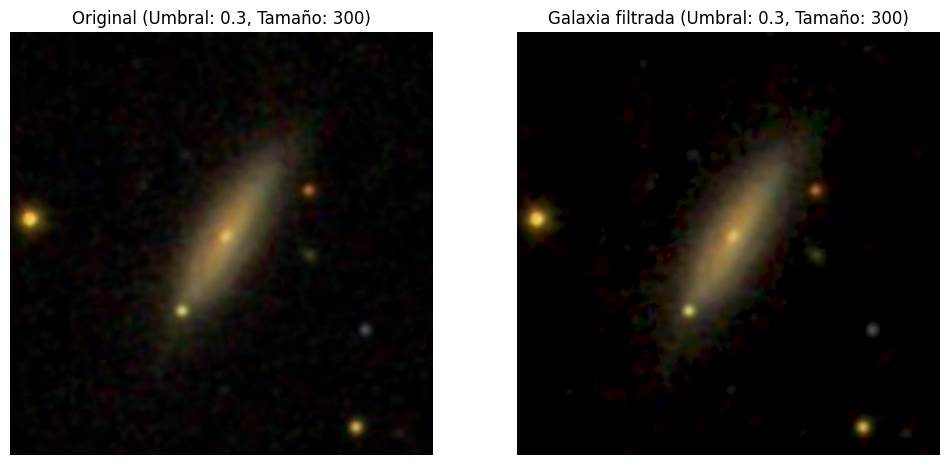

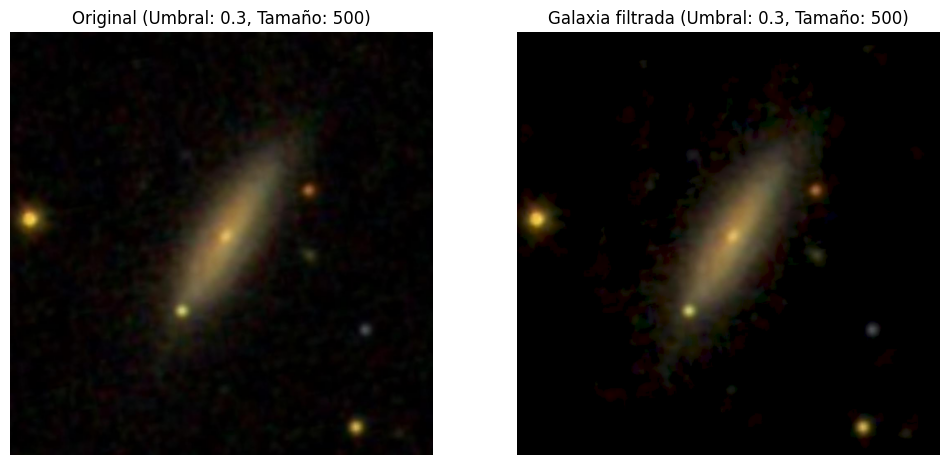

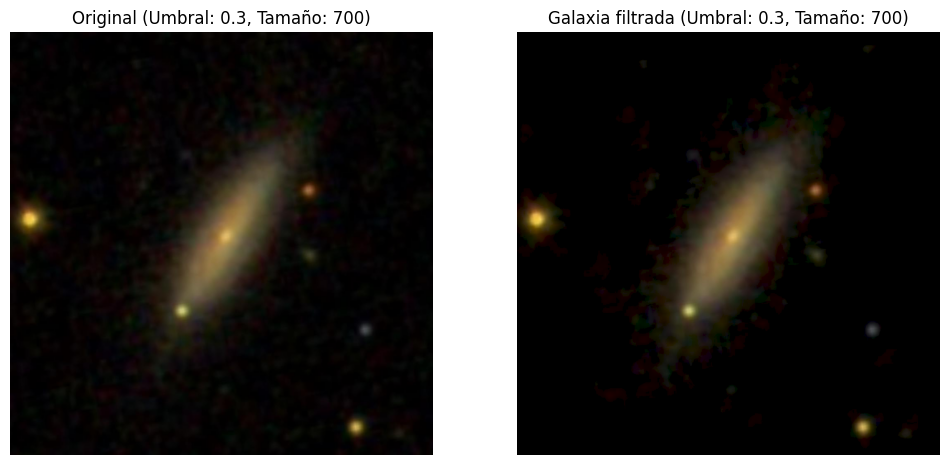

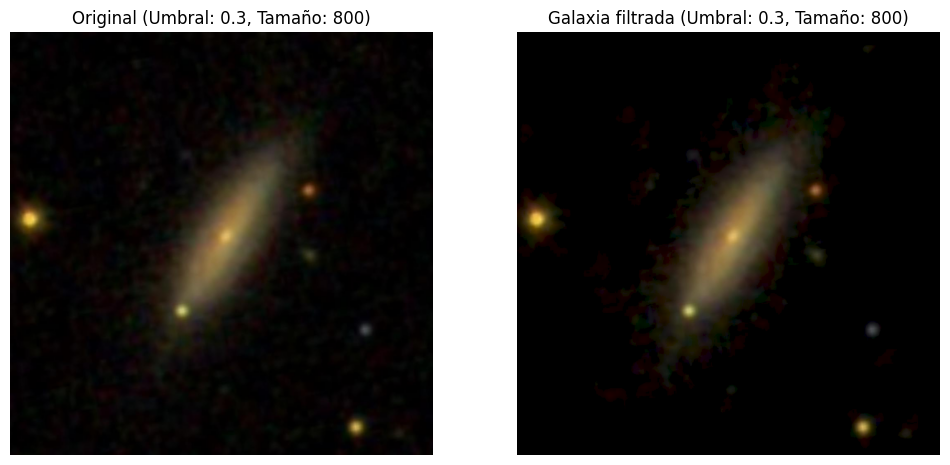

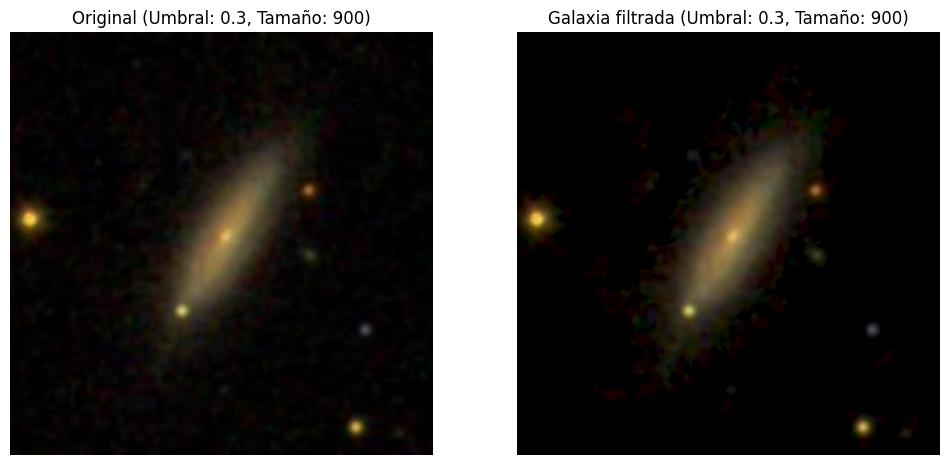

...

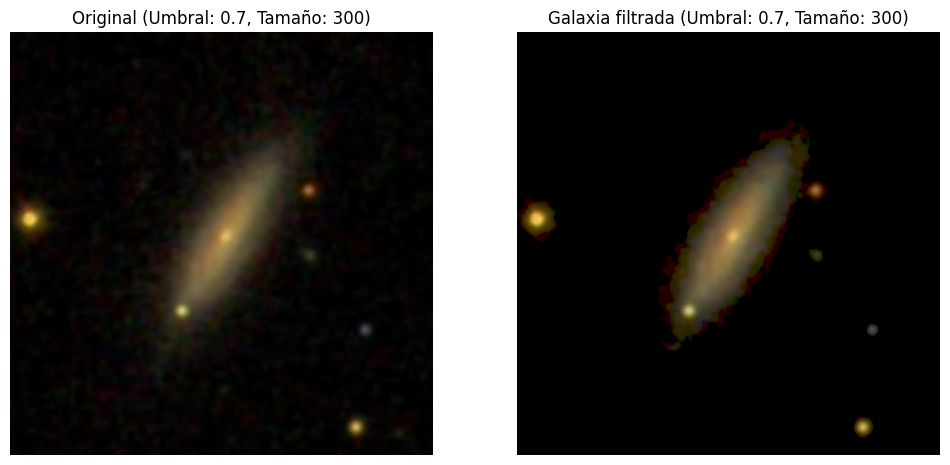

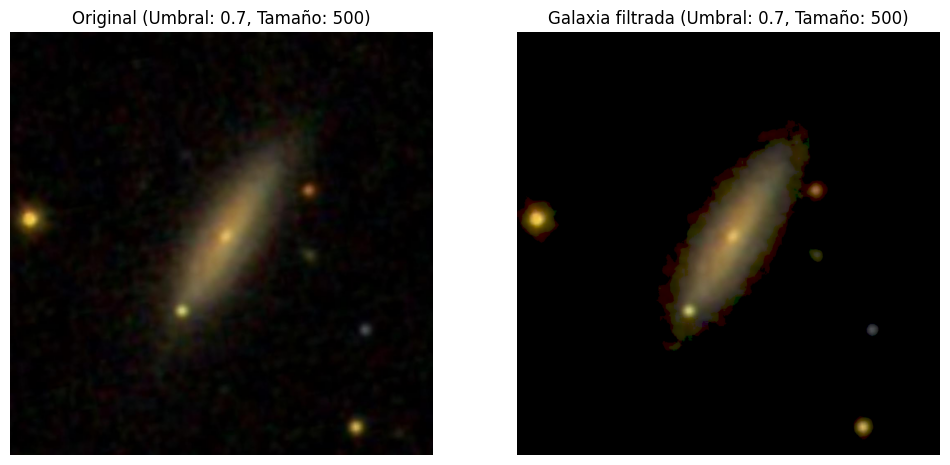

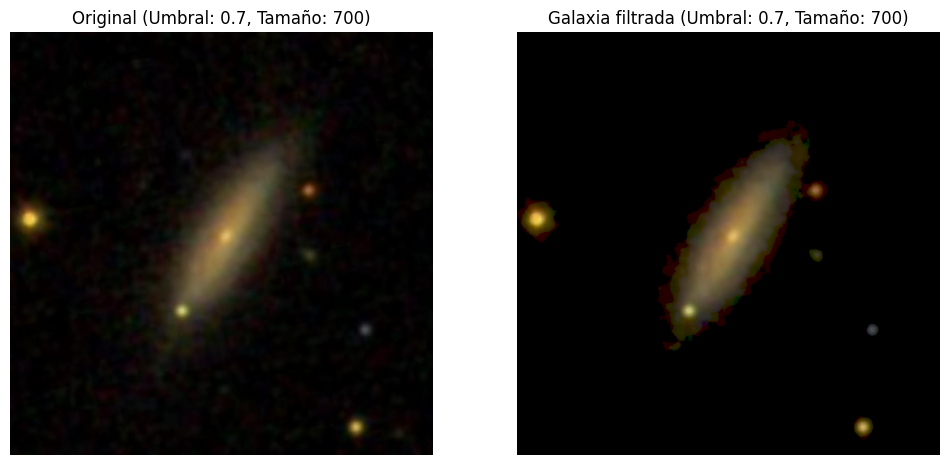

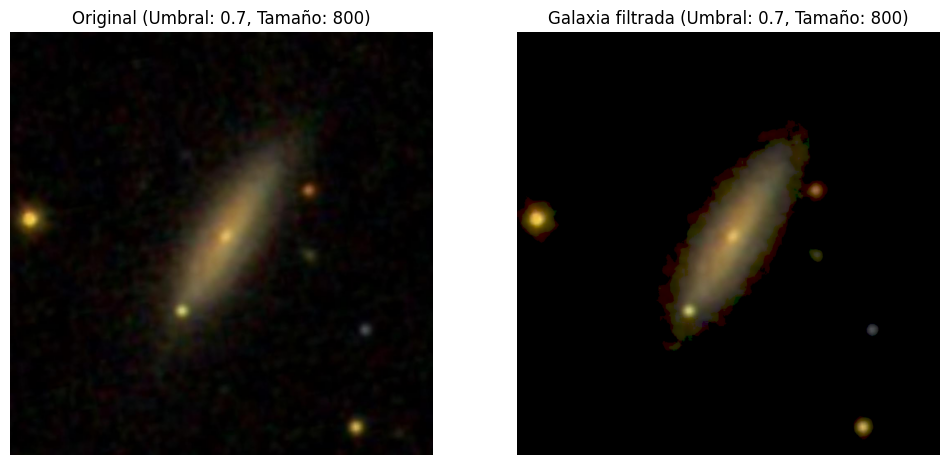

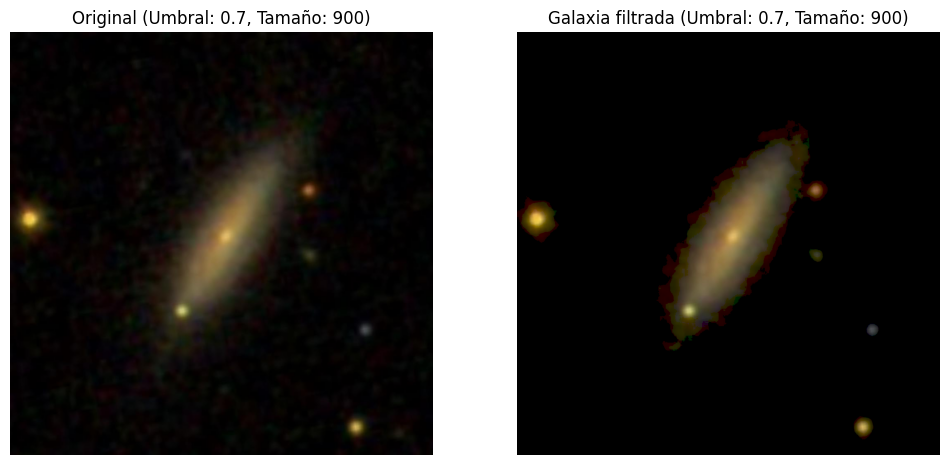

KeyboardInterrupt: 

In [26]:
# Parámetros a probar
umbrales_brillo = [0.3, 0.4, 0.5,0.6,0.7,0.8]
tamanos_min_galaxia = [300, 500, 700,800,900]

# Seleccionar algunas imágenes del DataFrame df_imagenes para probar
lista_imagenes = df_imagenes["Imagen_auto_scale"].sample(10).tolist()  # Imágenes escaladas

# Probar los hiperparámetros en cada imagen
for i, imagen in enumerate(lista_imagenes):
    print(f"\nProcesando imagen {i + 1}")
    probar_hiperparametros(imagen, umbrales_brillo, tamanos_min_galaxia)

In [26]:
# Parámetros óptimos (puedes ajustarlos si lo deseas)
umbral_brillo_optimo = 0.6
tamano_min_galaxia_optimo = 850

# Procesar las imágenes, aplicar el filtrado y guardar los resultados
df_imagenes = procesar_y_guardar_imagenes(df_imagenes, umbral_brillo=umbral_brillo_optimo, tamano_min_galaxia=tamano_min_galaxia_optimo)


Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_1.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_2.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_3.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_4.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_5.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_6.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_7.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_8.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_9.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered/image_10.jpg ya existe. Cargando l

In [21]:
# Función para conservar solo la galaxia, eliminando estrellas
def conservar_galaxia(imagen, umbral_brillo, tamano_min_galaxia):
    # Aplicar un umbral para detectar puntos brillantes (estrellas y galaxias)
    umbral = filters.threshold_otsu(imagen) * umbral_brillo
    regiones_binarias = imagen > umbral

    # Etiquetar las regiones conectadas (objetos en la imagen)
    etiquetas = measure.label(regiones_binarias)
    props = measure.regionprops(etiquetas)

    # Crear una máscara para las regiones grandes (galaxias)
    galaxias_mask = np.zeros_like(imagen)

    # Filtrar por tamaño: mantener solo las galaxias que superen el tamaño mínimo
    for prop in props:
        if prop.area >= tamano_min_galaxia:
            galaxias_mask[etiquetas == prop.label] = imagen[etiquetas == prop.label]

    return galaxias_mask

# Función para probar diferentes hiperparámetros
def probar_hiperparametros(imagen, umbrales_brillo, tamanos_min_galaxia):
    for umbral in umbrales_brillo:
        for tamano in tamanos_min_galaxia:
            # Aplicar el filtrado de galaxias con los parámetros actuales
            galaxia_filtrada = conservar_galaxia(imagen, umbral_brillo=umbral, tamano_min_galaxia=tamano)
            
            # Mostrar la imagen original y la filtrada
            mostrar_imagenes(imagen, galaxia_filtrada, 
                             f"Original (Umbral: {umbral}, Tamaño: {tamano})", 
                             f"Galaxia filtrada (Umbral: {umbral}, Tamaño: {tamano})")

# Función para mostrar las imágenes original y filtrada
def mostrar_imagenes(original, filtrada, titulo_original="Original", titulo_filtrada="Galaxia filtrada"):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(original, cmap='gray')
    axes[0].set_title(titulo_original)
    axes[0].axis('off')
    axes[1].imshow(filtrada, cmap='gray')
    axes[1].set_title(titulo_filtrada)
    axes[1].axis('off')
    plt.show()

def guardar_imagen(imagen, filepath):
    try:
        # Convertir el array NumPy a una imagen PIL y guardar en el archivo
        img = Image.fromarray(imagen)
        img.save(filepath)
    except Exception as e:
        print(f"Error al guardar la imagen: {e}")

def procesar_y_guardar_imagenes(df_imagenes, umbral_brillo=0.4, tamano_min_galaxia=500):
    # Crear directorio para guardar las imágenes filtradas
    output_dir = '002.IMAGENES DESCARGADAS/galaxy_filtered_HCG'
    os.makedirs(output_dir, exist_ok=True)
    
    # Asegurarnos de que la columna 'Imagen_filtrada' exista en el DataFrame y esté lista para almacenar listas de arrays
    if 'Imagen_filtrada' not in df_imagenes.columns:
        df_imagenes['Imagen_filtrada'] = None
    
    # Añadir columna 'Imagen_filtrada' con las imágenes procesadas
    for index, row in df_imagenes.iterrows():
        filepath = os.path.join(output_dir, f"image_{index+1}.jpg")
        
        # Si la imagen ya existe, leerla y convertirla a array de numpy
        if os.path.exists(filepath):
            print(f"Imagen {filepath} ya existe. Cargando la imagen filtrada...")
            imagen_filtrada = imread(filepath)
        else:
            # Procesar la imagen si no ha sido filtrada antes
            imagen = row['Imagen_auto_scale']  # Acceder a la imagen escalada
            imagen_filtrada = conservar_galaxia(imagen, umbral_brillo=umbral_brillo, tamano_min_galaxia=tamano_min_galaxia)
            
            # Guardar la imagen filtrada en el directorio
            guardar_imagen(imagen_filtrada, filepath)
        
        # Añadir la imagen filtrada en formato de lista al DataFrame (convierto a lista para evitar el error de broadcast)
        df_imagenes.at[index, 'Imagen_filtrada'] = imagen_filtrada.tolist()

    return df_imagenes

In [22]:
# Parámetros óptimos (puedes ajustarlos si lo deseas)
umbral_brillo_optimo = 0.6
tamano_min_galaxia_optimo = 850

# Procesar las imágenes, aplicar el filtrado y guardar los resultados
df_imagenes_HCG = procesar_y_guardar_imagenes(df_imagenes_HCG, umbral_brillo=umbral_brillo_optimo, tamano_min_galaxia=tamano_min_galaxia_optimo)

Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_1.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_2.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_3.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_4.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_5.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_6.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_7.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_8.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtered_HCG/image_9.jpg ya existe. Cargando la imagen filtrada...
Imagen 002.IMAGENES DESCARGADAS/galaxy_filtere

## 3. ETIQUETADO 

In [29]:
df_imagenes.columns

Index(['Indice', 'Imagen', 'cig', 'Imagen_auto_scale', 'Imagen_filtrada'], dtype='object')

In [23]:
df_imagenes_HCG.columns

Index(['Indice', 'Imagen', 'HCG', 'Imagen_auto_scale', 'Imagen_filtrada'], dtype='object')

In [31]:
# Crear DataFrame con la columna 'Imagen' y las demás columnas necesarias
df_imagen = df_imagenes[['Imagen', 'cig','Indice']]

# Crear DataFrame con la columna 'Imagen_auto_scale' y las demás columnas necesarias
df_imagen_auto_scale = df_imagenes[['Indice', 'Imagen_auto_scale', 'cig']]

# Crear DataFrame con la columna 'Imagen_filtrada' y las demás columnas necesarias
df_imagen_filtrada = df_imagenes[['Indice', 'Imagen_filtrada','cig']]


In [24]:
# Crear DataFrame con la columna 'Imagen' y las demás columnas necesarias
df_imagen_HCG = df_imagenes_HCG[['Indice', 'Imagen', 'HCG']]

# Crear DataFrame con la columna 'Imagen_auto_scale' y las demás columnas necesarias
df_imagen_auto_scale_HCG = df_imagenes_HCG[['Indice', 'Imagen_auto_scale', 'HCG']]

# Crear DataFrame con la columna 'Imagen_filtrada' y las demás columnas necesarias
df_imagen_filtrada_HCG = df_imagenes_HCG[['Indice', 'Imagen_filtrada','HCG']]

In [25]:
def clasificar_galaxia(clasificacion):
    if 'S' in clasificacion:
        index_s = clasificacion.index('S')
        if len(clasificacion) > index_s + 1 and clasificacion[index_s + 1] == '0':
            return 'lenticular'
        else:
            return 'espiral'
    elif 'E' in clasificacion:
        return 'elíptica'
    elif 'I' in clasificacion:
        return 'irregular'
    elif 'P' in clasificacion:
        return 'peculiar'
    return 'desconocida'

In [35]:
# Primero nos aseguramos que ambos DataFrames tengan la columna "CIG" y "cig" de tipo string para evitar errores de coincidencia.
ButaTableA['cig'] = ButaTableA['cig'].astype(str)
df_imagen['cig'] = df_imagen['cig'].astype(str)

df_imagen_auto_scale['cig'] = df_imagen_auto_scale['cig'].astype(str)
df_imagen_filtrada['cig'] = df_imagen_filtrada['cig'].astype(str)

# Para df_imagen
df_imagen = df_imagen.merge(ButaTableA[['cig', 'Phase 2 clasiffication']], left_on='cig', right_on='cig', how='left')

# Aplicar la función de clasificación a 'Phase 2 clasiffication'
df_imagen.loc[:, 'explicación clasificación1'] = df_imagen['Phase 2 clasiffication'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen.loc[:, 'clasificación1'] = df_imagen['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Para df_imagen_auto_scale
df_imagen_auto_scale = df_imagen_auto_scale.merge(ButaTableA[['cig', 'Phase 2 clasiffication']], left_on='cig', right_on='cig', how='left')

# Aplicar la función de clasificación a 'Phase 2 clasiffication'
df_imagen_auto_scale.loc[:, 'explicación clasificación1'] = df_imagen_auto_scale['Phase 2 clasiffication'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen_auto_scale.loc[:, 'clasificación1'] = df_imagen_auto_scale['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Para df_imagen_filtrada
df_imagen_filtrada = df_imagen_filtrada.merge(ButaTableA[['cig', 'Phase 2 clasiffication']], left_on='cig', right_on='cig', how='left')

# Aplicar la función de clasificación a 'Phase 2 clasiffication'
df_imagen_filtrada.loc[:, 'explicación clasificación1'] = df_imagen_filtrada['Phase 2 clasiffication'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen_filtrada.loc[:, 'clasificación1'] = df_imagen_filtrada['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Verificar los resultados
print(df_imagen.head())
print(df_imagen_auto_scale.head())
print(df_imagen_filtrada.head())


/tmp/ipykernel_253630/2855666828.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imagen['cig'] = df_imagen['cig'].astype(str)
/tmp/ipykernel_253630/2855666828.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imagen_auto_scale['cig'] = df_imagen_auto_scale['cig'].astype(str)
/tmp/ipykernel_253630/2855666828.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation

                                              Imagen  cig  \
0  [[[1, 0, 0], [1, 0, 0], [1, 0, 0], [1, 0, 0], ...    1   
1  [[[4, 2, 3], [4, 2, 3], [3, 1, 2], [2, 0, 1], ...   12   
2  [[[3, 0, 0], [3, 0, 0], [1, 0, 0], [1, 0, 0], ...  145   
3  [[[3, 0, 0], [5, 1, 2], [7, 3, 4], [9, 5, 6], ...  146   
4  [[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], ...  156   

                              Phase 2 clasiffication  \
0   SA(rs)bc                                     ...   
1   Sb: spw pec                                  ...   
2   Sa sp / E6 pec                               ...   
3   SB(s)cd                                      ...   
4   SA_B(rs)c                                    ...   

  explicación clasificación1  clasificación1  
0                    espiral               0  
1                    espiral               0  
2                    espiral               0  
3                    espiral               0  
4                    espiral               0  
   Indice     

In [40]:
print(df_imagen.columns)
print(df_imagen_auto_scale.columns)
print(df_imagen_filtrada.columns)


Index(['Imagen', 'cig', 'Phase 2 clasiffication', 'explicación clasificación1',
       'clasificación1'],
      dtype='object')
Index(['Indice', 'Imagen_auto_scale', 'cig', 'Phase 2 clasiffication',
       'explicación clasificación1', 'clasificación1'],
      dtype='object')
Index(['Indice', 'Imagen_filtrada', 'cig', 'Phase 2 clasiffication',
       'explicación clasificación1', 'clasificación1'],
      dtype='object')
Index(['Indice', 'Imagen', 'HCG'], dtype='object')


In [26]:
# Agregar la clasificación real desde df_HCG a los DataFrames correspondientes

# Para df_imagen_HCG
df_imagen_HCG.loc[:, 'Clasificación_Real'] = df_HCG['morphology']

# Aplicar la función de clasificación
df_imagen_HCG.loc[:, 'explicación clasificación1'] = df_imagen_HCG['Clasificación_Real'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen_HCG.loc[:, 'clasificación1'] = df_imagen_HCG['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Para df_imagen_auto_scale_HCG
df_imagen_auto_scale_HCG.loc[:, 'Clasificación_Real'] = df_HCG['morphology']

# Aplicar la función de clasificación
df_imagen_auto_scale_HCG.loc[:, 'explicación clasificación1'] = df_imagen_auto_scale_HCG['Clasificación_Real'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen_auto_scale_HCG.loc[:, 'clasificación1'] = df_imagen_auto_scale_HCG['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Para df_imagen_filtrada_HCG
df_imagen_filtrada_HCG.loc[:, 'Clasificación_Real'] = df_HCG['morphology']

# Aplicar la función de clasificación
df_imagen_filtrada_HCG.loc[:, 'explicación clasificación1'] = df_imagen_filtrada_HCG['Clasificación_Real'].apply(clasificar_galaxia)

# Asignar un código numérico basado en la explicación
df_imagen_filtrada_HCG.loc[:, 'clasificación1'] = df_imagen_filtrada_HCG['explicación clasificación1'].map({
    'espiral': 0,
    'lenticular': 3,
    'elíptica': 1,
    'irregular': 2,
    'peculiar': 4,
    'desconocida': 5
})

# Visualizar los primeros resultados para verificar
print(df_imagen_HCG.head())
print(df_imagen_auto_scale_HCG.head())
print(df_imagen_filtrada_HCG.head())

/tmp/ipykernel_297820/2651957171.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imagen_HCG.loc[:, 'Clasificación_Real'] = df_HCG['morphology']
/tmp/ipykernel_297820/2651957171.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_imagen_auto_scale_HCG.loc[:, 'Clasificación_Real'] = df_HCG['morphology']
/tmp/ipykernel_297820/2651957171.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the c

   Indice                                             Imagen     HCG  \
0       0  [[[0, 1, 0], [0, 2, 1], [2, 4, 3], [2, 4, 3], ...  HCG06d   
1       1  [[[11, 5, 5], [11, 5, 5], [12, 6, 6], [13, 7, ...  HCG06b   
2       2  [[[7, 5, 6], [9, 7, 8], [12, 10, 11], [14, 12,...  HCG06c   
3       3  [[[7, 9, 4], [6, 8, 3], [6, 7, 2], [5, 6, 1], ...  HCG07b   
4       4  [[[32, 17, 14], [31, 16, 13], [31, 16, 11], [2...  HCG01d   

  Clasificación_Real explicación clasificación1  clasificación1  
0              Sbc C                    espiral               0  
1              Sab D                    espiral               0  
2             E... D                   elíptica               1  
3                S C                    espiral               0  
4               S0 D                 lenticular               3  
   Indice                                  Imagen_auto_scale     HCG  \
0       0  [[[11, 4, 12], [11, 4, 12], [10, 3, 11], [10, ...  HCG06d   
1       1  [[[19, 14, 11], 

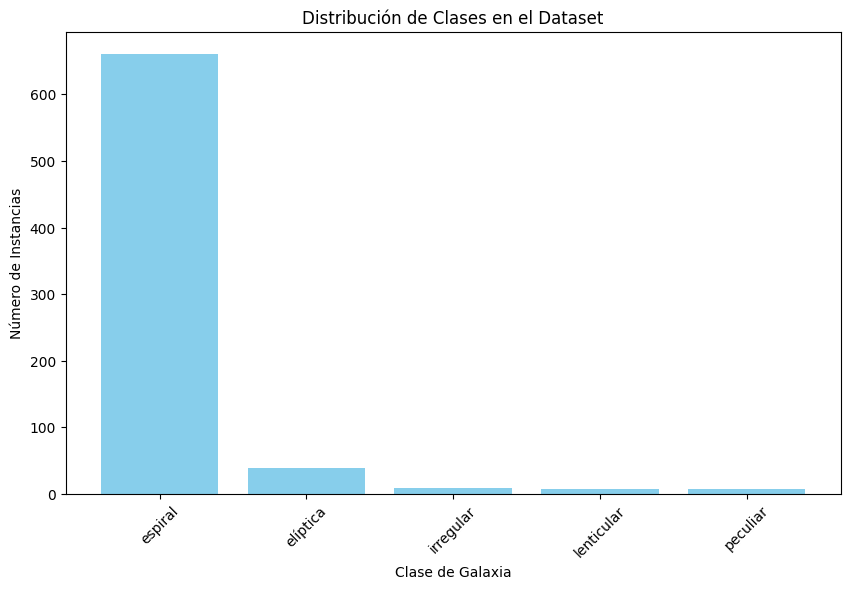

In [42]:
# Contar el número de ocurrencias de cada clase
class_counts = df_imagen['clasificación1'].value_counts()

# Crear una lista de nombres de clases correspondientes a los códigos
class_names = {
    0: 'espiral',
    1: 'elíptica',
    2: 'irregular',
    3: 'lenticular',
    4: 'peculiar',
    5: 'desconocida'
}

# Mapear los códigos a nombres de clases para la visualización
class_labels = [class_names.get(code, 'Desconocida') for code in class_counts.index]

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
plt.bar(class_labels, class_counts, color='skyblue')
plt.xlabel('Clase de Galaxia')
plt.ylabel('Número de Instancias')
plt.title('Distribución de Clases en el Dataset')
plt.xticks(rotation=45)
plt.show()

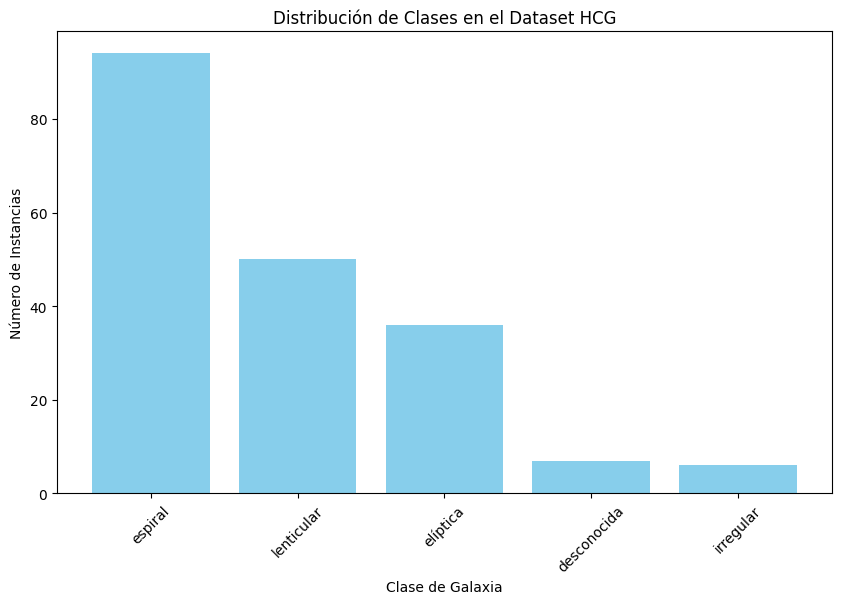

In [27]:
# Contar el número de ocurrencias de cada clase en df_imagen_HCG
class_counts_HCG = df_imagen_HCG['clasificación1'].value_counts()

# Crear una lista de nombres de clases correspondientes a los códigos
class_names = {
    0: 'espiral',
    1: 'elíptica',
    2: 'irregular',
    3: 'lenticular',
    4: 'peculiar',
    5: 'desconocida'
}

# Mapear los códigos a nombres de clases para la visualización
class_labels_HCG = [class_names.get(code, 'Desconocida') for code in class_counts_HCG.index]

# Crear el gráfico de barras para df_imagen_HCG
plt.figure(figsize=(10, 6))
plt.bar(class_labels_HCG, class_counts_HCG, color='skyblue')
plt.xlabel('Clase de Galaxia')
plt.ylabel('Número de Instancias')
plt.title('Distribución de Clases en el Dataset HCG')
plt.xticks(rotation=45)
plt.show()

In [46]:
# Función para rotar la imagen
def rotate_image(image, angle):
    return image.rotate(angle, expand=False)

# Función para convertir un array a imagen
def array_to_image(img_array):
    if img_array.dtype != np.uint8:
        img_array = img_array.astype(np.uint8)
    return Image.fromarray(img_array)

# Función para convertir imagen a array
def image_to_array(image):
    return np.array(image)

## Función para procesar imágenes rotadas y actualizar el DataFrame
def process_rotated_images(df, directory, image_column):
    new_rows = []
    if os.path.exists(directory) and len(os.listdir(directory)) > 0:
        for filename in os.listdir(directory):
            if filename.endswith('.jpg'):
                filepath = os.path.join(directory, filename)
                
                try:
                    # Cambiar el enfoque de extracción del índice y ángulo
                    parts = filename.split('_')
                    idx_str = parts[1].replace('image', '')  # Obtener la parte numérica de la imagen
                    idx = int(idx_str) - 1  # Ajustar el índice a base 0
                    angle_str = parts[3].replace('.jpg', '')  # Obtener el ángulo sin la extensión
                    angle = int(angle_str)  # Convertir el ángulo a entero
                except (IndexError, ValueError) as e:
                    print(f"Error parsing filename {filename}: {e}")
                    continue
                
                try:
                    img = Image.open(filepath)
                    img_array = image_to_array(img)
                except Exception as e:
                    print(f"Error loading image {filepath}: {e}")
                    continue
                
                # Añadir nueva fila con los datos de la imagen rotada
                new_row = {
                    'Indice': len(df) + 1,
                    image_column: img_array,
                    'imagen_rotada': f'sí ({angle} grados)',
                    'clasificación1': df.loc[idx, 'clasificación1'],
                    'cig': df.loc[idx, 'cig'],
                    'Phase 2 clasiffication': df.loc[idx, 'Phase 2 clasiffication'],
                    'explicación clasificación1': df.loc[idx, 'explicación clasificación1']
                }
                new_rows.append(new_row)
        return pd.DataFrame(new_rows)
    return None


# Función para rotar nuevas imágenes si no existen previamente
def rotate_and_save_new_images(df, angles, image_column):
    new_rows = []
    for idx in df[df['clasificación1'] != 0].index:
        img_array = df.loc[idx, image_column]
        img = array_to_image(img_array)
        selected_angles = random.sample(angles, 8)
        for angle in selected_angles:
            rotated_img = rotate_image(img, angle)
            rotated_img_array = image_to_array(rotated_img)
            rotated_filepath = os.path.join(output_rotated_dir, f"image_{idx+1}_rotated_{angle}.jpg")
            rotated_img.save(rotated_filepath)
            
            new_row = {
                    'Indice': len(df) + 1,
                    image_column: img_array,
                    'imagen_rotada': f'sí ({angle} grados)',
                    'clasificación1': df.loc[idx, 'clasificación1'],
                    'cig': df.loc[idx, 'cig'],
                    'Phase 2 clasiffication': df.loc[idx, 'Phase 2 clasiffication'],
                    'explicación clasificación1': df.loc[idx, 'explicación clasificación1']
                }
            new_rows.append(new_row)
    return pd.DataFrame(new_rows)

# Función principal para aplicar a todos los DataFrames
def apply_image_rotation(df, image_column):
    angles = [i * 15 for i in range(24)]
    
    existing_images_df = process_rotated_images(df, output_rotated_dir, image_column)
    if existing_images_df is not None:
        df = pd.concat([df, existing_images_df], ignore_index=True)
    else:
        new_rotated_df = rotate_and_save_new_images(df, angles, image_column)
        df = pd.concat([df, new_rotated_df], ignore_index=True)
    
    return df

In [47]:
# Aplicar la función a los tres DataFrames
output_rotated_dir = '002.IMAGENES DESCARGADAS/sdss_images_0.15scale_rotated'
os.makedirs(output_rotated_dir, exist_ok=True)
df_imagen_with_rotated = apply_image_rotation(df_imagen, 'Imagen')
print("Proceso completado")



Proceso completado


In [52]:
output_rotated_dir = '002.IMAGENES DESCARGADAS/sdss_images_autoscale_CIG_rotated'
os.makedirs(output_rotated_dir, exist_ok=True)
df_imagen_auto_scale_with_rotated = apply_image_rotation(df_imagen_auto_scale, 'Imagen_auto_scale')

print("Proceso completado")



Proceso completado


In [54]:
# Verificar el tipo de datos en la columna 'Imagen_filtrada'
print(df_imagen_filtrada['Imagen_filtrada'].apply(type).unique())

df_imagen_filtrada['Imagen_filtrada'] = df_imagen_filtrada['Imagen_filtrada'].apply(lambda x: np.array(x) if isinstance(x, list) else x)


[<class 'list'>]


In [29]:
df_imagen_filtrada_HCG['Imagen_filtrada'] = df_imagen_filtrada_HCG['Imagen_filtrada'].apply(lambda x: np.array(x) if isinstance(x, list) else x)

In [55]:
output_rotated_dir = '002.IMAGENES DESCARGADAS/galaxy_filtered_rotated'
os.makedirs(output_rotated_dir, exist_ok=True)
df_imagen_filtrada_with_rotated = apply_image_rotation(df_imagen_filtrada, 'Imagen_filtrada')


print("Proceso completado")

Proceso completado


In [60]:

# Función mejorada para clasificar la galaxia
def clasificar_galaxia_2(clasificacion):
    # Clasificaciones específicas para espirales (incluyendo caso de lenticulares)
    if 'S' in clasificacion:
        # Caso especial de lenticulares
        if 'S0' in clasificacion:
            return 'lenticular'
        
        # Clasificaciones relacionadas con barras (y resolver prioridad)
        if 'SB_ax' in clasificacion or 'SB_xa' in clasificacion or 'SAB_ax' in clasificacion or 'SAB_xa' in clasificacion:
            return 'espiral barrada peculiar'
        elif 'SB_a' in clasificacion or 'SAB_a' in clasificacion:
            return 'espiral barrada peculiar'
        elif 'SAB_x' in clasificacion or 'SB_x' in clasificacion:
            return 'espiral barrada peculiar'
        elif 'SB' in clasificacion:
            return 'espiral barrada'
        elif 'SAB' in clasificacion or 'S_AB' in clasificacion or 'SA_B' in clasificacion:
            return 'espiral barrada intermedia'
        elif 'SA' in clasificacion:
            return 'espiral no barrada'
        else:
            # Si solo tiene 'S', es barra indeterminada
            return 'espiral barra indeterminada'
    
    # Clasificaciones para otros tipos de galaxias
    elif 'I' in clasificacion:
        return 'irregular'
    elif 'E' in clasificacion:
        return 'elíptica'
    elif 'P' in clasificacion:
        return 'peculiar'
    
    # Si no coincide con ninguna, retornamos desconocida
    return 'desconocida'
# Crear DataFrame con la columna 'Imagen' y las demás columnas necesarias

df_imagen_with_rotated['explicación clasificación2'] = df_imagen_with_rotated['Phase 2 clasiffication'].apply(clasificar_galaxia_2)
df_imagen_auto_scale_with_rotated['explicación clasificación2'] = df_imagen_auto_scale_with_rotated['Phase 2 clasiffication'].apply(clasificar_galaxia_2)
df_imagen_filtrada_with_rotated['explicación clasificación2'] = df_imagen_filtrada_with_rotated['Phase 2 clasiffication'].apply(clasificar_galaxia_2)


# Asignar código numérico basado en la nueva clasificación detallada en df_imagen
df_imagen_with_rotated['clasificación_2'] = df_imagen_with_rotated['explicación clasificación2'].map({
    'espiral no barrada': 0,
    'espiral barrada': 1,
    'espiral barrada intermedia': 2,
    'espiral barrada peculiar': 3,
    'espiral barra indeterminada': 4,
    'lenticular': 5,
    'elíptica': 6,
    'irregular': 7,
    'peculiar': 8,
    'desconocida': 9
})

# Asignar código numérico basado en la nueva clasificación detallada en df_imagen_filtrada
df_imagen_auto_scale_with_rotated['clasificación_2'] = df_imagen_auto_scale_with_rotated['explicación clasificación2'].map({
    'espiral no barrada': 0,
    'espiral barrada': 1,
    'espiral barrada intermedia': 2,
    'espiral barrada peculiar': 3,
    'espiral barra indeterminada': 4,
    'lenticular': 5,
    'elíptica': 6,
    'irregular': 7,
    'peculiar': 8,
    'desconocida': 9
})

# Asignar código numérico basado en la nueva clasificación detallada en df_imagen_auto_scale
df_imagen_filtrada_with_rotated['clasificación_2'] = df_imagen_filtrada_with_rotated['explicación clasificación2'].map({
    'espiral no barrada': 0,
    'espiral barrada': 1,
    'espiral barrada intermedia': 2,
    'espiral barrada peculiar': 3,
    'espiral barra indeterminada': 4,
    'lenticular': 5,
    'elíptica': 6,
    'irregular': 7,
    'peculiar': 8,
    'desconocida': 9
})





In [65]:
# Guardar los DataFrames en formato Pickle
df_imagen_with_rotated.to_pickle('000_GUARDADO/df_imagen.pkl')
df_imagen_auto_scale_with_rotated.to_pickle('000_GUARDADO/df_imagen_auto_scale.pkl')
df_imagen_filtrada_with_rotated.to_pickle('000_GUARDADO/df_imagen_filtrada.pkl')

print("Los DataFrames han sido guardados exitosamente en formato Pickle.")


Los DataFrames han sido guardados exitosamente en formato Pickle.


In [5]:
# Función para redimensionar imágenes
def resize_image(image_array, size=(512, 512)):
    # Asegurarse de que el array sea de tipo uint8
    if image_array.dtype != np.uint8:
        image_array = image_array.astype(np.uint8)
    
    # Convertir el array a imagen PIL
    image = Image.fromarray(image_array)
    
    # Redimensionar la imagen
    resized_image = image.resize(size)
    
    # Convertir la imagen redimensionada de vuelta a array
    return np.array(resized_image)

# Función para convertir una imagen a escala de grises
def convert_to_grayscale(image_array):
    if image_array.ndim == 3:  # Si la imagen es RGB o similar
        return np.mean(image_array, axis=2)
    return image_array  # Si ya está en escala de grises



In [42]:
# Procesar las imágenes en cada DataFrame
for df in [df_imagen_with_rotated, df_imagen_auto_scale_with_rotated, df_imagen_filtrada_with_rotated]:
    
    # Buscar columnas que comiencen por 'Imagen'
    imagen_col = [col for col in df.columns if col.startswith('Imagen')]
    
    if len(imagen_col) > 0:  # Si existe al menos una columna que comience por 'Imagen'
        for col in imagen_col:
            # Convertir las imágenes a escala de grises
            df[f'{col}_escala_grises'] = df[col].apply(lambda img: convert_to_grayscale(img))
        
            # Redimensionar las imágenes en color a 512x512
            df[f'{col}_resized'] = df[col].apply(lambda x: resize_image(x, size=(512, 512)))
        
            # Redimensionar las imágenes en escala de grises a 512x512
            df[f'{col}_escala_grises_resized'] = df[f'{col}_escala_grises'].apply(lambda x: resize_image(x, size=(512, 512)))
    
            # Verificar la forma de las imágenes transformadas
            print(f"La forma de las imágenes redimensionadas a color es: {np.stack(df[f'{col}_resized'].values).shape}")
            print(f"La forma de las imágenes en escala de grises redimensionadas es: {np.stack(df[f'{col}_escala_grises_resized'].values).shape}")
    else:
        print("No se encontró ninguna columna que comience por 'Imagen' en el DataFrame.")


La forma de las imágenes redimensionadas a color es: (1210, 512, 512, 3)
La forma de las imágenes en escala de grises redimensionadas es: (1210, 512, 512)
La forma de las imágenes redimensionadas a color es: (1210, 512, 512, 3)
La forma de las imágenes en escala de grises redimensionadas es: (1210, 512, 512)
La forma de las imágenes redimensionadas a color es: (1210, 512, 512, 3)
La forma de las imágenes en escala de grises redimensionadas es: (1210, 512, 512)


In [30]:
# Procesar las imágenes en cada DataFrame
for df in [df_imagen_HCG, df_imagen_auto_scale_HCG, df_imagen_filtrada_HCG]:
    
    # Buscar columnas que comiencen por 'Imagen'
    imagen_col = [col for col in df.columns if col.startswith('Imagen')]
    
    if len(imagen_col) > 0:  # Si existe al menos una columna que comience por 'Imagen'
        for col in imagen_col:
            # Convertir las imágenes a escala de grises
            df[f'{col}_escala_grises'] = df[col].apply(lambda img: convert_to_grayscale(img))
        
            # Redimensionar las imágenes en color a 512x512
            df[f'{col}_resized'] = df[col].apply(lambda x: resize_image(x, size=(512, 512)))
        
            # Redimensionar las imágenes en escala de grises a 512x512
            df[f'{col}_escala_grises_resized'] = df[f'{col}_escala_grises'].apply(lambda x: resize_image(x, size=(512, 512)))
    
            # Verificar la forma de las imágenes transformadas
            print(f"La forma de las imágenes redimensionadas a color para la columna '{col}' es: {np.stack(df[f'{col}_resized'].values).shape}")
            print(f"La forma de las imágenes en escala de grises redimensionadas para la columna '{col}' es: {np.stack(df[f'{col}_escala_grises_resized'].values).shape}")
    else:
        print("No se encontró ninguna columna que comience por 'Imagen' en el DataFrame.")


La forma de las imágenes redimensionadas a color para la columna 'Imagen_filtrada' es: (193, 512, 512, 3)
La forma de las imágenes en escala de grises redimensionadas para la columna 'Imagen_filtrada' es: (193, 512, 512)


In [43]:
# Guardar los DataFrames en formato Pickle
df_imagen_with_rotated.to_pickle('000_GUARDADO/df_imagen.pkl')
df_imagen_auto_scale_with_rotated.to_pickle('000_GUARDADO/df_imagen_auto_scale.pkl')
df_imagen_filtrada_with_rotated.to_pickle('000_GUARDADO/df_imagen_filtrada.pkl')

print("Los DataFrames han sido guardados exitosamente en formato Pickle.")

Los DataFrames han sido guardados exitosamente en formato Pickle.


In [39]:
# Guardar los DataFrames en formato Pickle
df_imagen_HCG.to_pickle('000_GUARDADO/df_imagen_HCG.pkl')
df_imagen_auto_scale_HCG.to_pickle('000_GUARDADO/df_imagen_auto_scale_HCG.pkl')
df_imagen_filtrada_HCG.to_pickle('000_GUARDADO/df_imagen_filtrada_HCG.pkl')

print("Los DataFrames han sido guardados exitosamente en formato Pickle.")

In [4]:
# Cargar los DataFrames desde archivos Pickle
df_imagen_with_rotated = pd.read_pickle('000_GUARDADO/df_imagen.pkl')
df_imagen_auto_scale_with_rotated = pd.read_pickle('000_GUARDADO/df_imagen_auto_scale.pkl')
df_imagen_filtrada_with_rotated = pd.read_pickle('000_GUARDADO/df_imagen_filtrada.pkl')

print("Los DataFrames han sido cargados exitosamente desde Pickle.")


Los DataFrames han sido cargados exitosamente desde Pickle.


## 4. MODELOS A.


SOLO DEL NUEVO. 

In [4]:
# Convertir las imágenes a arrays de NumPy y normalizarlas dividiendo por 255
images_array_resized_grey = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_escala_grises_resized'].values) / 255.0

In [5]:
# Convertir las imágenes a arrays de NumPy y normalizarlas dividiendo por 255
images_array_normal_size_grey = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_escala_grises'].values) / 255.0

In [6]:
labels_array = np.array(df_imagen_filtrada_with_rotated['clasificación1'].values)

In [7]:

train_images_mpl_normal_size, test_images_mpl_normal_size, train_labels_mpl_normal_size, test_labels_mpl_normal_sizes = train_test_split(
    images_array_normal_size_grey, 
    labels_array, 
    test_size=0.20, 
    random_state=42, 
    stratify=labels_array  # Asegurar que las clases se repartan equitativamente
)

In [8]:
train_images_mpl_resized_grey, test_images_mpl_resized_grey, train_labels_mpl_resized_grey, test_labels_mpl_resized_grey = train_test_split(
    images_array_resized_grey, 
    labels_array, 
    test_size=0.20, 
    random_state=42, 
    stratify=labels_array  # Asegurar que las clases se repartan equitativamente
)

In [9]:

loss_function = tf.keras.losses.sparse_categorical_crossentropy
optim = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Configuración del EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',         # Monitorizamos 'val_loss' para detener el entrenamiento si no mejora
    patience=20,                 # Número de épocas sin mejora antes de detener el entrenamiento
    restore_best_weights=True,  # Restauramos los mejores pesos obtenidos
    verbose=1                   # Mostrar información en la consola
)

2024-10-24 23:10:27.915347: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38485 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:25:00.0, compute capability: 8.0


In [10]:
# Definición de capas del modelo
capa_entrada_red_modelo_1 = tf.keras.layers.Flatten(input_shape=[1024, 1024], name='capa_entrada_modelo_1') 
capa_oculta_1_modelo_1 = tf.keras.layers.Dense(300, activation='relu', name='capa_oculta1_modelo_1')
capa_oculta_2_modelo_1 = tf.keras.layers.Dense(100, activation='relu', name='capa_oculta2_modelo_1')

num_classes = 5
output_layer_modelo_1 = tf.keras.layers.Dense(num_classes, activation='softmax', name='capa_salida_modelo_1')

# Creación del modelo
modelo_1 = tf.keras.models.Sequential()

modelo_1.add(capa_entrada_red_modelo_1)
modelo_1.add(capa_oculta_1_modelo_1)
modelo_1.add(capa_oculta_2_modelo_1)
modelo_1.add(output_layer_modelo_1)

modelo_1.summary()

# Compilación del modelo
modelo_1.compile(loss=loss_function,
                 optimizer=optim,
                 metrics=['accuracy'])

print("\nModelo 1 preparado")

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ capa_entrada_modelo_1 (Flatten) │ (None, 1048576)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_oculta1_modelo_1 (Dense)   │ (None, 300)            │   314,573,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_oculta2_modelo_1 (Dense)   │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_salida_modelo_1 (Dense)    │ (None, 5)              │           505 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 314,603,705 (1.17 GB)

 Trainable params: 314,603,705 (1.17 GB)

 Non-trainable params: 0 (0.00 B)


Modelo 1 preparado


In [11]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint

# Configurar ModelCheckpoint para guardar los pesos del mejor modelo en base al val_loss
checkpoint_modelo1 = ModelCheckpoint('002_MODELOS/checkpoint_modelo1_filtered.keras', 
                             monitor='val_loss',  # Guardar en base a la mejor val_loss
                             save_best_only=True,  # Solo guardar el mejor modelo
                             mode='min',           # Mínima val_loss es mejor
                             verbose=1)


history_modelo1 = modelo_1.fit(
        train_images_mpl_normal_size, 
        train_labels_mpl_normal_size, 
        epochs=50,
        validation_data=(test_images_mpl_normal_size, test_labels_mpl_normal_sizes),
        callbacks=[early_stopping,checkpoint_modelo1]
)

Epoch 1/50


I0000 00:00:1729804233.004957  329513 service.cc:146] XLA service 0x7f6308009d80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729804233.004990  329513 service.cc:154]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2024-10-24 23:10:33.037124: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-10-24 23:10:33.128894: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-10-24 23:10:33.857812: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_310', 44 bytes spill stores, 44 bytes spill loads

2024-10-24 23:10:33.895180: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 

 7/31 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6390 - loss: 2.0999

I0000 00:00:1729804235.114098  329513 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.7876 - loss: 1.8480
Epoch 1: val_loss improved from inf to 1.29602, saving model to 002_MODELOS/checkpoint_modelo1_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 21s 570ms/step - accuracy: 0.7896 - loss: 1.8366 - val_accuracy: 0.9050 - val_loss: 1.2960
Epoch 2/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8790 - loss: 1.1523
Epoch 2: val_loss improved from 1.29602 to 0.83052, saving model to 002_MODELOS/checkpoint_modelo1_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.8793 - loss: 1.1300 - val_accuracy: 0.9091 - val_loss: 0.8305
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8844 - loss: 0.7254
Epoch 3: val_loss did not improve from 0.83052
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - accuracy: 0.8847 - loss: 0.7222 - val_accuracy: 0.9091 - val_loss: 0.9481
Epoch 4/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9146 - loss: 0.5592
Epoch 4: val_loss did not improve from 0.83052
31/3

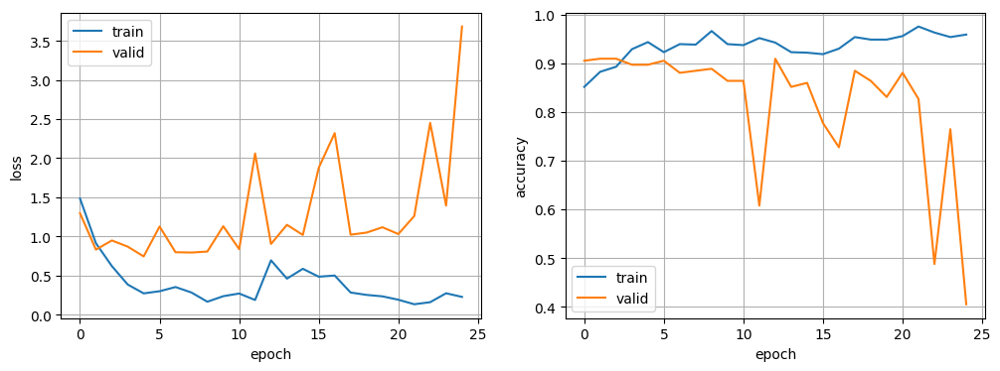

In [12]:
df_1_modelo1 = pd.DataFrame({'loss_train': history_modelo1.history['loss'],
                     'loss_valid': history_modelo1.history['val_loss']
                    })

df_2_modelo1 = pd.DataFrame({'accuracy': history_modelo1.history['accuracy'],
                   'accuracy_valid': history_modelo1.history['val_accuracy']
                   })

data_modelo1 = [df_1_modelo1, df_2_modelo1]
y_labels_modelo1= ['loss', 'accuracy']

f, axs = plt.subplots(1, 2, sharex=True, figsize=(12,4))
for ax, y_label, df in zip(axs, y_labels_modelo1, data_modelo1):
    ax.plot(df, label=['train','valid'])
    ax.grid(True)
    ax.set_xlabel('epoch')
    ax.set_ylabel(y_label)
    ax.legend();

36/38 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

2024-10-24 23:13:35.066911: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 20 bytes spill stores, 20 bytes spill loads



38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 48ms/step
Informe de Clasificación Completo:
               precision    recall  f1-score   support

     Espiral       0.93      0.99      0.96      1101
    Elíptica       1.00      0.10      0.18        62
   Irregular       1.00      0.16      0.28        25
  Lenticular       0.55      0.80      0.65        15
    Peculiar       0.33      0.71      0.45         7

    accuracy                           0.92      1210
   macro avg       0.76      0.55      0.50      1210
weighted avg       0.93      0.92      0.90      1210



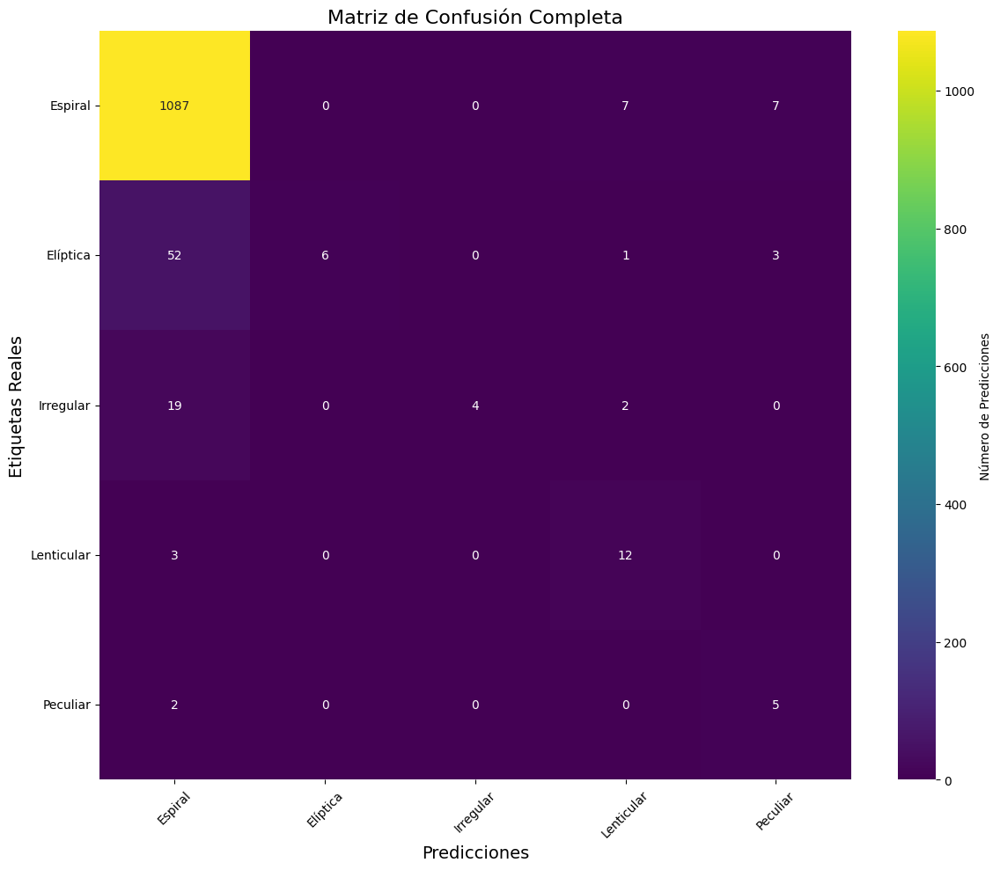

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento:
               precision    recall  f1-score   support

     Espiral       0.94      0.99      0.96       881
    Elíptica       1.00      0.12      0.21        50
   Irregular       1.00      0.20      0.33        20
  Lenticular       0.58      0.92      0.71        12
    Peculiar       0.38      1.00      0.56         5

    accuracy                           0.93       968
   macro avg       0.78      0.65      0.56       968
weighted avg       0.94      0.93      0.91       968



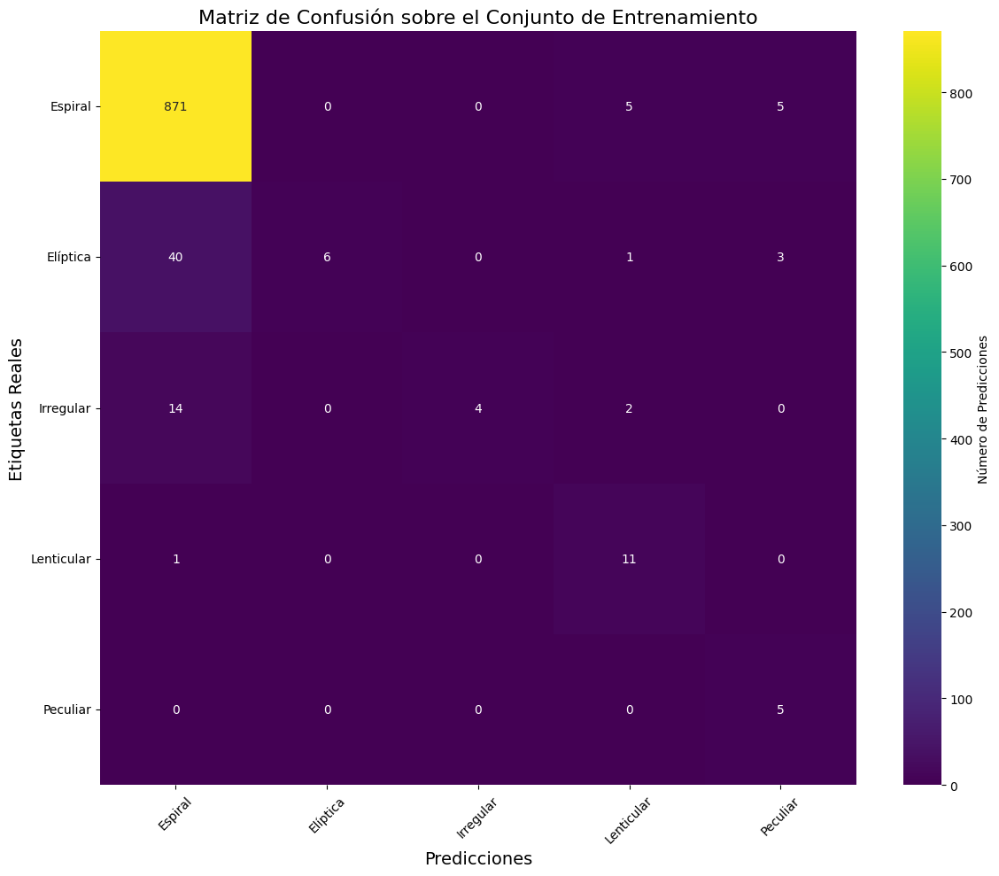

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step

Informe de Clasificación sobre el Conjunto de Test:
               precision    recall  f1-score   support

     Espiral       0.91      0.98      0.95       220
    Elíptica       0.00      0.00      0.00        12
   Irregular       0.00      0.00      0.00         5
  Lenticular       0.33      0.33      0.33         3
    Peculiar       0.00      0.00      0.00         2

    accuracy                           0.90       242
   macro avg       0.25      0.26      0.26       242
weighted avg       0.83      0.90      0.86       242



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

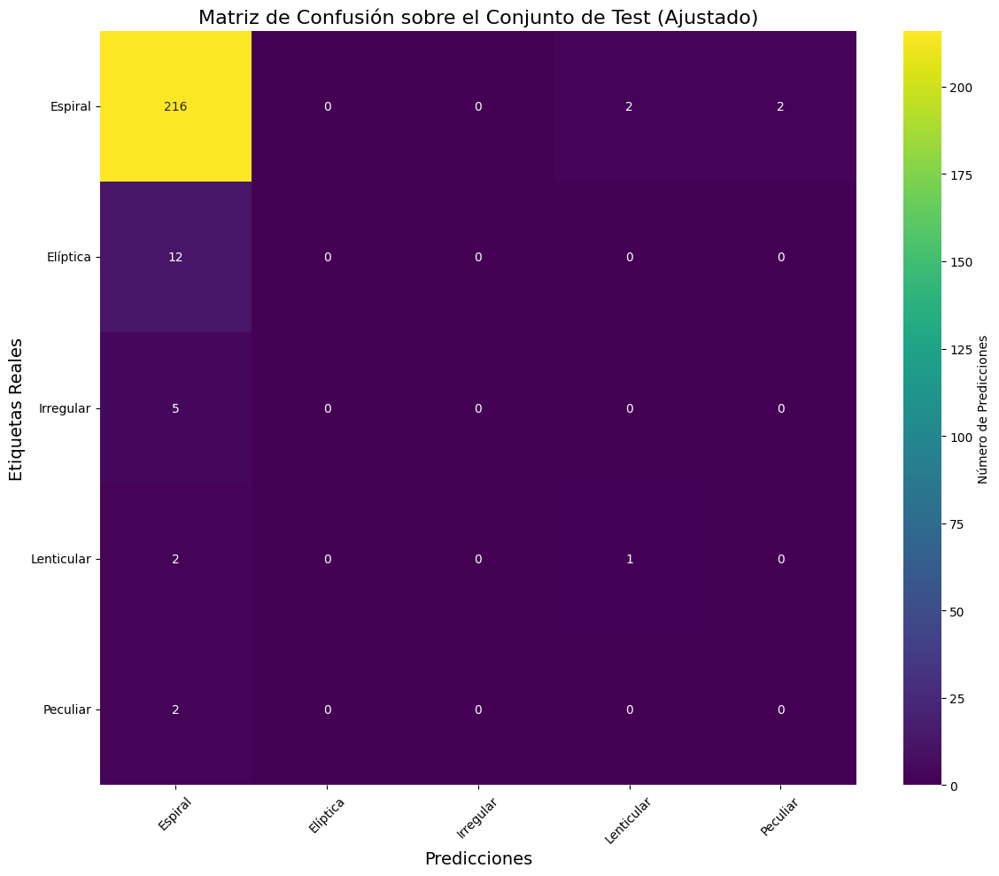

In [13]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']

# Extraer imágenes y etiquetas del DataFrame
imagenes_array_completo = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_escala_grises'].values) / 255.0
etiquetas_array_completo = df_imagen_filtrada_with_rotated['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_1_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_modelo1_filtered.keras')

### Clasificación sobre el conjunto completo ###

# Realizar predicciones sobre el conjunto completo
predicciones_completas = modelo_1_cargado.predict(imagenes_array_completo)
predicciones_clase_completas = np.argmax(predicciones_completas, axis=1)

# Comparar con las etiquetas reales
etiquetas_reales_completas = etiquetas_array_completo

# Generar un informe de clasificación para el conjunto completo
informe_clasificacion_completo = classification_report(etiquetas_reales_completas, predicciones_clase_completas, target_names=nombres_clases)
print("Informe de Clasificación Completo:\n", informe_clasificacion_completo)

# Generar una matriz de confusión para el conjunto completo
matriz_confusion_completa = confusion_matrix(etiquetas_reales_completas, predicciones_clase_completas)

# Visualizar la matriz de confusión para el conjunto completo
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_completa, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión Completa', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de entrenamiento ###

# Realizar predicciones sobre el conjunto de entrenamiento
predicciones_train = modelo_1_cargado.predict(train_images_mpl_normal_size)
predicciones_clase_train = np.argmax(predicciones_train, axis=1)

# Comparar con las etiquetas reales del conjunto de entrenamiento
etiquetas_reales_train = train_labels_mpl_normal_size

# Generar un informe de clasificación para el conjunto de entrenamiento
informe_clasificacion_train = classification_report(etiquetas_reales_train, predicciones_clase_train, target_names=nombres_clases)
print("\nInforme de Clasificación sobre el Conjunto de Entrenamiento:\n", informe_clasificacion_train)

# Generar una matriz de confusión para el conjunto de entrenamiento
matriz_confusion_train = confusion_matrix(etiquetas_reales_train, predicciones_clase_train)

# Visualizar la matriz de confusión para el conjunto de entrenamiento
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Entrenamiento', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de test ###

# Realizar predicciones sobre el conjunto de test
predicciones_test = modelo_1_cargado.predict(test_images_mpl_normal_size)
predicciones_clase_test = np.argmax(predicciones_test, axis=1)

# Comparar con las etiquetas reales del conjunto de test
etiquetas_reales_test = test_labels_mpl_normal_sizes

## Obtener las clases presentes en las etiquetas del conjunto de test
clases_presentes = np.unique(etiquetas_reales_test)

# Ajustar los nombres de las clases en base a las presentes
nombres_clases_test = [nombres_clases[i] for i in clases_presentes]

# Generar un informe de clasificación ajustado para las clases presentes
informe_clasificacion_test = classification_report(etiquetas_reales_test, predicciones_clase_test, target_names=nombres_clases_test)
print("\nInforme de Clasificación sobre el Conjunto de Test:\n", informe_clasificacion_test)

# Generar una matriz de confusión para las clases presentes
matriz_confusion_test = confusion_matrix(etiquetas_reales_test, predicciones_clase_test)

# Visualizar la matriz de confusión ajustada
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases_test, 
            yticklabels=nombres_clases_test,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Test (Ajustado)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [15]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from PIL import Image

# Función para mostrar la imagen
def mostrar_imagen(image_array, etiqueta_real, etiqueta_predicha):
    plt.imshow(image_array, cmap='gray')
    plt.title(f"Real: {etiqueta_real}, Predicha: {etiqueta_predicha}")
    plt.axis('off')
    plt.show()

# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']  # Ajusta esto según tus clases

# Extraer imágenes y etiquetas del DataFrame de validación (df_imagen_filtrada_HCG)
imagenes_array_validacion = np.stack(df_imagen_filtrada_HCG['escala_grises'].values) / 255.0
etiquetas_array_validacion = df_imagen_filtrada_HCG['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_1_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_modelo1_filtered.keras')

# Evaluar el modelo
print("Evaluando el modelo en el conjunto de validación (df_imagen_filtrada_HCG)...")
predicciones_validacion = modelo_1_cargado.predict(imagenes_array_validacion)
predicciones_clase_validacion = np.argmax(predicciones_validacion, axis=1)

# Generar el informe de clasificación
etiquetas_reales_validacion = etiquetas_array_validacion
informe_clasificacion_validacion = classification_report(etiquetas_reales_validacion, predicciones_clase_validacion, target_names=nombres_clases)
print("Informe de Clasificación en Validación (df_imagen_filtrada_HCG):\n", informe_clasificacion_validacion)

# Generar una matriz de confusión
matriz_confusion_validacion = confusion_matrix(etiquetas_reales_validacion, predicciones_clase_validacion)

# Visualizar la matriz de confusión con ajustes
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_validacion, annot=True, fmt='d', cmap='viridis', 
            xticklabels=nombres_clases, 
            yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión en Validación (df_imagen_filtrada_HCG)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Mostrar las imágenes donde el modelo se ha equivocado
print("\nImágenes donde el modelo se ha equivocado:")
for i, (prediccion, real) in enumerate(zip(predicciones_clase_validacion, etiquetas_reales_validacion)):
    if prediccion != real:
        nombre_galaxia = df_imagen_filtrada_HCG.iloc[i]['HCG']  # Ajustado para usar 'HCG' como nombre de referencia
        print(f"Error en galaxia: {nombre_galaxia} - Real: {nombres_clases[real]}, Predicha: {nombres_clases[prediccion]}")
        mostrar_imagen(df_imagen_filtrada_HCG.iloc[i]['Imagen_resized'], nombres_clases[real], nombres_clases[prediccion])


NameError: name 'df_imagen_filtrada_HCG' is not defined

MODELO 2

In [16]:
# Crear el modelo con imágenes de 512x512 píxeles
capa_entrada_red_modelo_2 = tf.keras.layers.Flatten(input_shape=[512,512], name='capa_entrada_modelo_2')
capa_oculta_1_modelo_2 = tf.keras.layers.Dense(300, activation='relu', name='capa_oculta1_modelo_2')
capa_oculta_2_modelo_2 = tf.keras.layers.Dense(100, activation='relu', name='capa_oculta2_modelo_2')

num_classes = 5
output_layer_modelo_2 = tf.keras.layers.Dense(num_classes, activation='softmax', name='capa_salida_modelo_2')

modelo_2 = tf.keras.models.Sequential()

modelo_2.add(capa_entrada_red_modelo_2)
modelo_2.add(capa_oculta_1_modelo_2)
modelo_2.add(capa_oculta_2_modelo_2)
modelo_2.add(output_layer_modelo_2)

modelo_2.summary()

loss_function = tf.keras.losses.sparse_categorical_crossentropy
optim2 = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Compilar el modelo
modelo_2.compile(loss=loss_function,
                 optimizer=optim2,
                 metrics=['accuracy'])


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ capa_entrada_modelo_2 (Flatten) │ (None, 262144)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_oculta1_modelo_2 (Dense)   │ (None, 300)            │    78,643,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_oculta2_modelo_2 (Dense)   │ (None, 100)            │        30,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ capa_salida_modelo_2 (Dense)    │ (None, 5)              │           505 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 78,674,105 (300.12 MB)

 Trainable params: 78,674,105 (300.12 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint



# Configurar ModelCheckpoint para guardar los pesos del mejor modelo en la carpeta especificada
checkpoint_modelo_2 = ModelCheckpoint('002_MODELOS/checkpoint_modelo_2_filtered.keras', 
                             monitor='val_loss',  # Guardar en base a la mejor val_loss
                             save_best_only=True,  # Solo guardar el mejor modelo
                             mode='min',           # Mínima val_loss es mejor
                             verbose=1)


# Entrenar el modelo con las configuraciones establecidas
history_modelo_2 = modelo_2.fit(
        train_images_mpl_resized_grey, 
        train_labels_mpl_resized_grey, 
        epochs=50,
        validation_data=(test_images_mpl_resized_grey, test_labels_mpl_resized_grey),
        callbacks=[early_stopping, checkpoint_modelo_2]
)


Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.8020 - loss: 0.7963
Epoch 1: val_loss improved from inf to 0.52031, saving model to 002_MODELOS/checkpoint_modelo_2_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.8046 - loss: 0.7920 - val_accuracy: 0.9091 - val_loss: 0.5203
Epoch 2/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9031 - loss: 0.4637
Epoch 2: val_loss improved from 0.52031 to 0.42734, saving model to 002_MODELOS/checkpoint_modelo_2_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 64s 2s/step - accuracy: 0.9037 - loss: 0.4596 - val_accuracy: 0.9091 - val_loss: 0.4273
Epoch 3/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9066 - loss: 0.3654
Epoch 3: val_loss did not improve from 0.42734
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9074 - loss: 0.3638 - val_accuracy: 0.9050 - val_loss: 0.4385
Epoch 4/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.9049 - loss: 0.3286
Epoch 4: val_loss did not improve from 0.427

38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Informe de Clasificación Completo:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95      1101
    Elíptica       0.00      0.00      0.00        62
   Irregular       0.00      0.00      0.00        25
  Lenticular       0.00      0.00      0.00        15
    Peculiar       0.00      0.00      0.00         7

    accuracy                           0.91      1210
   macro avg       0.18      0.20      0.19      1210
weighted avg       0.83      0.91      0.87      1210



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

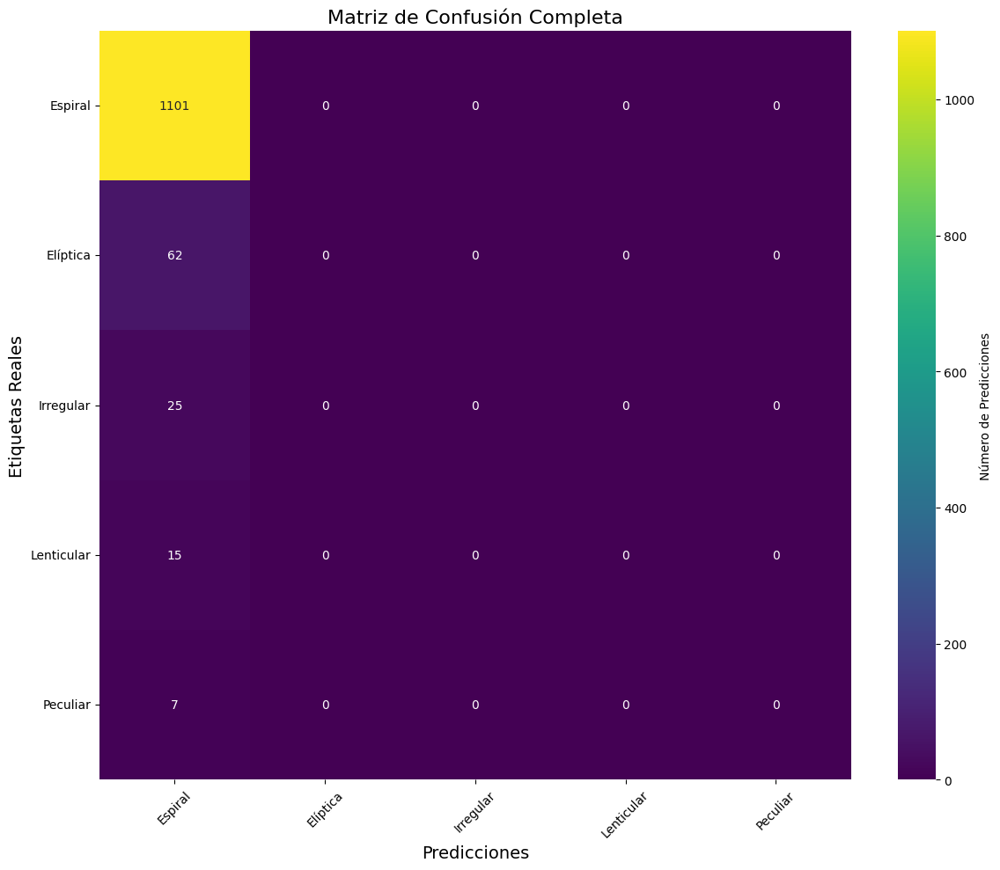

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       881
    Elíptica       0.00      0.00      0.00        50
   Irregular       0.00      0.00      0.00        20
  Lenticular       0.00      0.00      0.00        12
    Peculiar       0.00      0.00      0.00         5

    accuracy                           0.91       968
   macro avg       0.18      0.20      0.19       968
weighted avg       0.83      0.91      0.87       968



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

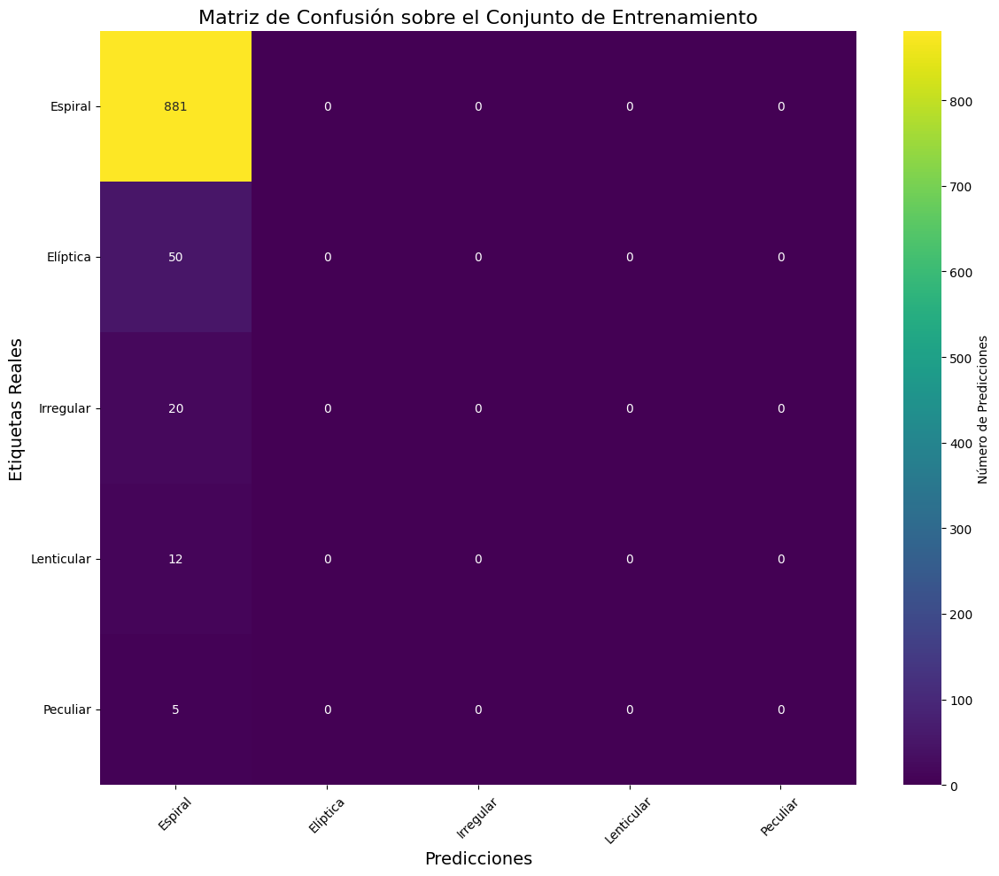

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

Informe de Clasificación sobre el Conjunto de Test:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       220
    Elíptica       0.00      0.00      0.00        12
   Irregular       0.00      0.00      0.00         5
  Lenticular       0.00      0.00      0.00         3
    Peculiar       0.00      0.00      0.00         2

    accuracy                           0.91       242
   macro avg       0.18      0.20      0.19       242
weighted avg       0.83      0.91      0.87       242



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

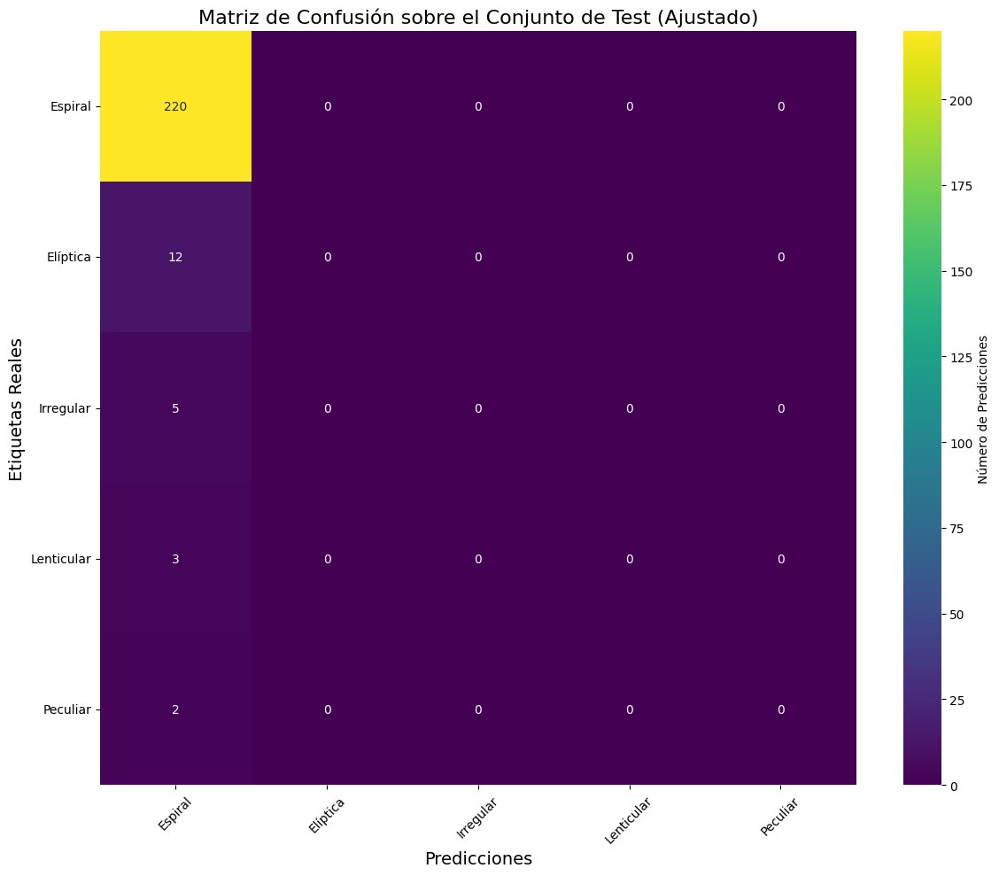

In [18]:
import numpy as np
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']

# Extraer imágenes y etiquetas del DataFrame
imagenes_array_completo = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_escala_grises_resized'].values) / 255.0
etiquetas_array_completo = df_imagen_filtrada_with_rotated['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_2_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_modelo_2_filtered.keras')

### Clasificación sobre el conjunto completo ###

# Realizar predicciones sobre el conjunto completo
predicciones_completas = modelo_2_cargado.predict(imagenes_array_completo)
predicciones_clase_completas = np.argmax(predicciones_completas, axis=1)

# Comparar con las etiquetas reales
etiquetas_reales_completas = etiquetas_array_completo

# Generar un informe de clasificación para el conjunto completo
informe_clasificacion_completo = classification_report(etiquetas_reales_completas, predicciones_clase_completas, target_names=nombres_clases)
print("Informe de Clasificación Completo:\n", informe_clasificacion_completo)

# Generar una matriz de confusión para el conjunto completo
matriz_confusion_completa = confusion_matrix(etiquetas_reales_completas, predicciones_clase_completas)

# Visualizar la matriz de confusión para el conjunto completo
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_completa, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión Completa', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de entrenamiento ###

# Realizar predicciones sobre el conjunto de entrenamiento
predicciones_train = modelo_2_cargado.predict(train_images_mpl_resized_grey)
predicciones_clase_train = np.argmax(predicciones_train, axis=1)

# Comparar con las etiquetas reales del conjunto de entrenamiento
etiquetas_reales_train = train_labels_mpl_normal_size

# Generar un informe de clasificación para el conjunto de entrenamiento
informe_clasificacion_train = classification_report(etiquetas_reales_train, predicciones_clase_train, target_names=nombres_clases)
print("\nInforme de Clasificación sobre el Conjunto de Entrenamiento:\n", informe_clasificacion_train)

# Generar una matriz de confusión para el conjunto de entrenamiento
matriz_confusion_train = confusion_matrix(etiquetas_reales_train, predicciones_clase_train)

# Visualizar la matriz de confusión para el conjunto de entrenamiento
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Entrenamiento', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de test ###

# Realizar predicciones sobre el conjunto de test
predicciones_test = modelo_2_cargado.predict(test_images_mpl_resized_grey)
predicciones_clase_test = np.argmax(predicciones_test, axis=1)

# Comparar con las etiquetas reales del conjunto de test
etiquetas_reales_test = test_labels_mpl_resized_grey

## Obtener las clases presentes en las etiquetas del conjunto de test
clases_presentes = np.unique(etiquetas_reales_test)

# Ajustar los nombres de las clases en base a las presentes
nombres_clases_test = [nombres_clases[i] for i in clases_presentes]

# Generar un informe de clasificación ajustado para las clases presentes
informe_clasificacion_test = classification_report(etiquetas_reales_test, predicciones_clase_test, target_names=nombres_clases_test, labels=clases_presentes)
print("\nInforme de Clasificación sobre el Conjunto de Test:\n", informe_clasificacion_test)

# Generar una matriz de confusión para las clases presentes
matriz_confusion_test = confusion_matrix(etiquetas_reales_test, predicciones_clase_test, labels=clases_presentes)

# Visualizar la matriz de confusión ajustada
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases_test, 
            yticklabels=nombres_clases_test,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Test (Ajustado)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## 5. MODELOS B


In [19]:

images_array_cnn_resized_n = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_resized'].values) / 255.0

images_array_cnn_normalsize_n = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada'].values) / 255.0



In [20]:
labels_array_cnn = df_imagen_filtrada_with_rotated['clasificación1'].values

In [21]:
train_images_cnn, test_images_cnn, train_labels_cnn, test_labels_cnn = train_test_split(
    images_array_cnn_normalsize_n, 
    labels_array_cnn, 
    test_size=0.20, 
    random_state=42, 
    stratify=labels_array_cnn  # Asegurar que las clases se repartan equitativamente
)

In [22]:
train_images_cnn_resized, test_images_cnn_resized, train_labels_cnn_resized, test_labels_cnn_resized = train_test_split(
    images_array_cnn_resized_n, 
    labels_array_cnn, 
    test_size=0.20, 
    random_state=42, 
    stratify=labels_array_cnn  # Asegurar que las clases se repartan equitativamente
)

In [23]:
import numpy as np
import h5py
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping


# Configuración del EarlyStopping
early_stopping = EarlyStopping(
    monitor='val_loss',         # Monitorizamos 'val_loss' para detener el entrenamiento si no mejora
    patience=20,                 # Número de épocas sin mejora antes de detener el entrenamiento
    restore_best_weights=True,  # Restauramos los mejores pesos obtenidos
    verbose=1                   # Mostrar información en la consola
)

In [24]:
import tensorflow as tf

# Capa de convolución 1
conv_1_cnn_modelo1 = tf.keras.layers.Conv2D(filters=12,               # number of filters (number of kernels)
                                            kernel_size=(9, 9),       # kernel shape
                                            strides=(1, 1),           # how shift kernel moving along the image
                                            padding='valid',          # either to include padding or not
                                            activation='relu',        # activation function
                                            name='conv_1_cnn_modelo1',
                                            input_shape=(1024, 1024, 3))

# Capa de max pooling 1
pool_1_cnn_modelo1 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_1_cnn_modelo1')

# Capa de convolución 2
conv_2_cnn_modelo1 = tf.keras.layers.Conv2D(filters=12,               # number of filters (number of kernels)
                                            kernel_size=(9, 9),       # kernel shape
                                            strides=(1, 1),           # how shift kernel moving along the image
                                            padding='valid',          # either to include padding or not
                                            activation='relu',        # activation function
                                            name='conv_2_cnn_modelo1',
                                            input_shape=(338, 338, 24))

# Capa de max pooling 2
pool_2_cnn_modelo1 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_2_cnn_modelo1')

# Capa de flatten
flatten_layer_cnn_modelo1 = tf.keras.layers.Flatten()

# Capa densa 1
dense_1_cnn_modelo1 = tf.keras.layers.Dense(units=500, activation='relu', name='dense_1_cnn_modelo1')

# Capa densa 2
dense_2_cnn_modelo1 = tf.keras.layers.Dense(units=150, activation='relu', name='dense_2_cnn_modelo1')

# Capa de salida
num_classes = 5
output_layer_cnn_modelo1 = tf.keras.layers.Dense(units=num_classes, activation='softmax', name='output_layer_cnn_modelo1')

# Crear el modelo secuencial
model_cnn_modelo1 = tf.keras.Sequential()

model_cnn_modelo1.add(conv_1_cnn_modelo1)
# output shape: (1016,1016,24)

model_cnn_modelo1.add(pool_1_cnn_modelo1)
# output shape: (339, 339, 24)

model_cnn_modelo1.add(conv_2_cnn_modelo1)
# output shape: (331, 331, 24)

model_cnn_modelo1.add(pool_2_cnn_modelo1)
# output shape: (110, 110, 24)

model_cnn_modelo1.add(flatten_layer_cnn_modelo1)
# output shape: (290400,)

model_cnn_modelo1.add(dense_1_cnn_modelo1)
# output shape: (500,)

model_cnn_modelo1.add(dense_2_cnn_modelo1)
# output shape: (150,)

model_cnn_modelo1.add(output_layer_cnn_modelo1)
# output shape: (5,) 

loss_function = tf.keras.losses.sparse_categorical_crossentropy
optim3 = tf.keras.optimizers.Adam(learning_rate=1e-4)

# Compilar el modelo
model_cnn_modelo1.compile(optimizer=optim3,
                          loss=loss_function,
                          metrics=['accuracy'])

# Resumen del modelo
model_cnn_modelo1.summary()


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_1_cnn_modelo1 (Conv2D)     │ (None, 1016, 1016, 12) │         2,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1_cnn_modelo1              │ (None, 338, 338, 12)   │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2_cnn_modelo1 (Conv2D)     │ (None, 330, 330, 12)   │        11,676 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2_cnn_modelo1              │ (None, 110, 110, 12)   │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 145200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_cnn_modelo1 (Dense)     │ (None, 500)            │    72,600,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_cnn_modelo1 (Dense)     │ (None, 150)            │        75,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_cnn_modelo1        │ (None, 5)              │           755 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 72,691,009 (277.29 MB)

 Trainable params: 72,691,009 (277.29 MB)

 Non-trainable params: 0 (0.00 B)

In [25]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Configurar ModelCheckpoint para guardar los pesos del mejor modelo en base al val_loss
checkpoint_cnn_modelo1 = ModelCheckpoint('002_MODELOS/checkpoint_cnn_modelo1_filtered.keras', 
                             monitor='val_loss',  # Guardar en base a la mejor val_loss
                             save_best_only=True,  # Solo guardar el mejor modelo
                             mode='min',           # Mínima val_loss es mejor
                             verbose=1)

# Entrenamos el modelo con EarlyStopping

history_cnn_modelo1 = model_cnn_modelo1.fit(train_images_cnn, train_labels_cnn,
                            epochs=50,
                            validation_data=(test_images_cnn, test_labels_cnn),
                            callbacks=[early_stopping,checkpoint_cnn_modelo1]
                            ) 

best_epoch = early_stopping.stopped_epoch - early_stopping.patience
print(f"\nEl entrenamiento se detuvo en la época {early_stopping.stopped_epoch + 1}, con la mejor pérdida de validación (val_loss) en la época {best_epoch + 1}")
best_val_loss = min(history_cnn_modelo1.history['val_loss'])
best_val_accuracy = history_cnn_modelo1.history['val_accuracy'][history_cnn_modelo1.history['val_loss'].index(best_val_loss)]


print(f"Mejor pérdida de validación (val_loss): {best_val_loss}")
print(f"Mejor precisión en validación (val_accuracy): {best_val_accuracy}")


Epoch 1/50


2024-10-24 23:20:46.872995: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_557', 28 bytes spill stores, 28 bytes spill loads

2024-10-24 23:20:46.900645: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_557', 20 bytes spill stores, 20 bytes spill loads

2024-10-24 23:20:46.906651: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_557', 28 bytes spill stores, 28 bytes spill loads

2024-10-24 23:20:48.640147: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 17.75GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory we

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step - accuracy: 0.8345 - loss: 0.6775

2024-10-24 23:21:19.852091: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 17.75GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
E0000 00:00:1729804880.044853  329514 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1729804880.217625  329514 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1729804884.300234  329515 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1729804884.473535  329515 gpu_timer.cc:183] Delay kernel timed out: measured ti


Epoch 1: val_loss improved from inf to 0.43027, saving model to 002_MODELOS/checkpoint_cnn_modelo1_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.8363 - loss: 0.6735 - val_accuracy: 0.9091 - val_loss: 0.4303
Epoch 2/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.9033 - loss: 0.4144
Epoch 2: val_loss improved from 0.43027 to 0.40112, saving model to 002_MODELOS/checkpoint_cnn_modelo1_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 29s 949ms/step - accuracy: 0.9037 - loss: 0.4129 - val_accuracy: 0.9091 - val_loss: 0.4011
Epoch 3/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.9033 - loss: 0.3546
Epoch 3: val_loss improved from 0.40112 to 0.39106, saving model to 002_MODELOS/checkpoint_cnn_modelo1_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - accuracy: 0.9037 - loss: 0.3537 - val_accuracy: 0.9091 - val_loss: 0.3911
Epoch 4/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.9047 - loss: 0.2956
Epoch 4: val_loss did not improve from 0.39

2024-10-24 23:25:41.161415: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 15225323520 exceeds 10% of free system memory.
2024-10-24 23:25:46.742074: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 15225323520 exceeds 10% of free system memory.


37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

2024-10-24 23:25:54.866409: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_49', 32 bytes spill stores, 32 bytes spill loads

2024-10-24 23:25:56.007969: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 14.42GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
E0000 00:00:1729805156.201732  329512 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1729805156.375401  329512 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


38/38 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

Informe de Clasificación Completo:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95      1101
    Elíptica       0.00      0.00      0.00        62
   Irregular       0.00      0.00      0.00        25
  Lenticular       1.00      0.20      0.33        15
    Peculiar       0.00      0.00      0.00         7

    accuracy                           0.91      1210
   macro avg       0.38      0.24      0.26      1210
weighted avg       0.84      0.91      0.87      1210



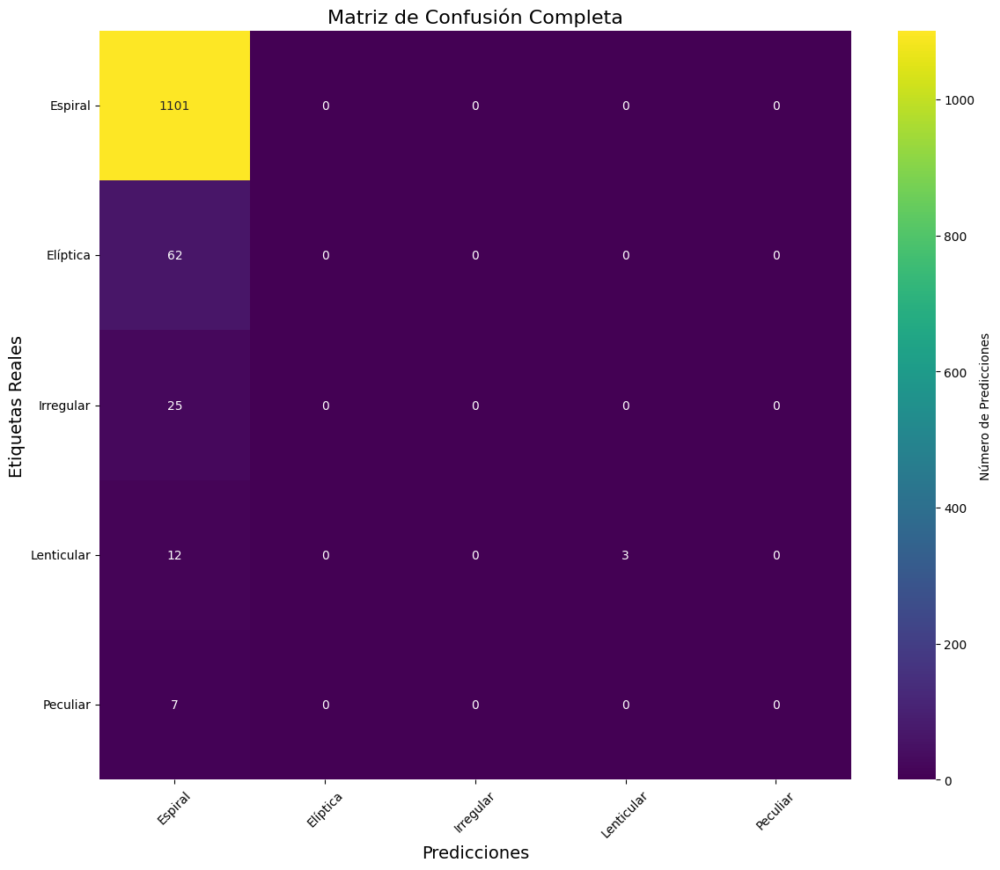

29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

E0000 00:00:1729805178.530403  329512 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1729805178.701435  329512 gpu_timer.cc:183] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu


Informe de Clasificación sobre el Conjunto de Entrenamiento:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       881
    Elíptica       0.00      0.00      0.00        50
   Irregular       0.00      0.00      0.00        20
  Lenticular       1.00      0.25      0.40        12
    Peculiar       0.00      0.00      0.00         5

    accuracy                           0.91       968
   macro avg       0.38      0.25      0.27       968
weighted avg       0.84      0.91      0.87       968



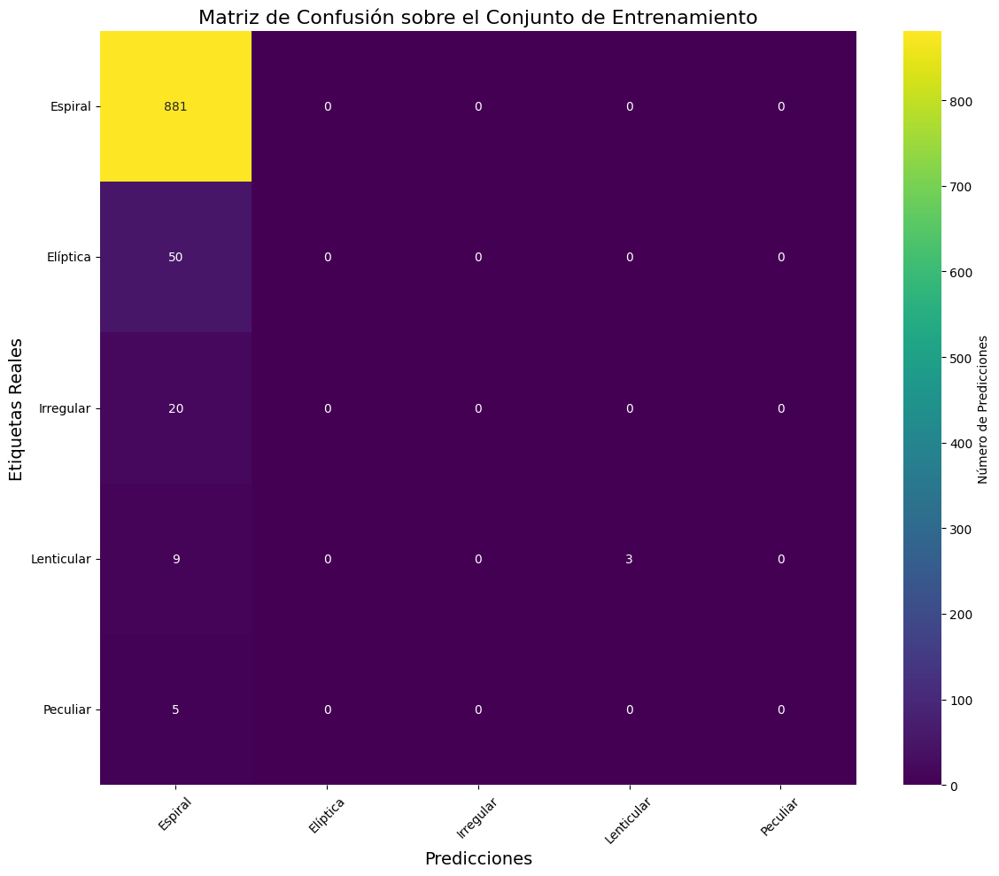

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step

Informe de Clasificación sobre el Conjunto de Test:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       220
    Elíptica       0.00      0.00      0.00        12
   Irregular       0.00      0.00      0.00         5
  Lenticular       0.00      0.00      0.00         3
    Peculiar       0.00      0.00      0.00         2

    accuracy                           0.91       242
   macro avg       0.18      0.20      0.19       242
weighted avg       0.83      0.91      0.87       242



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

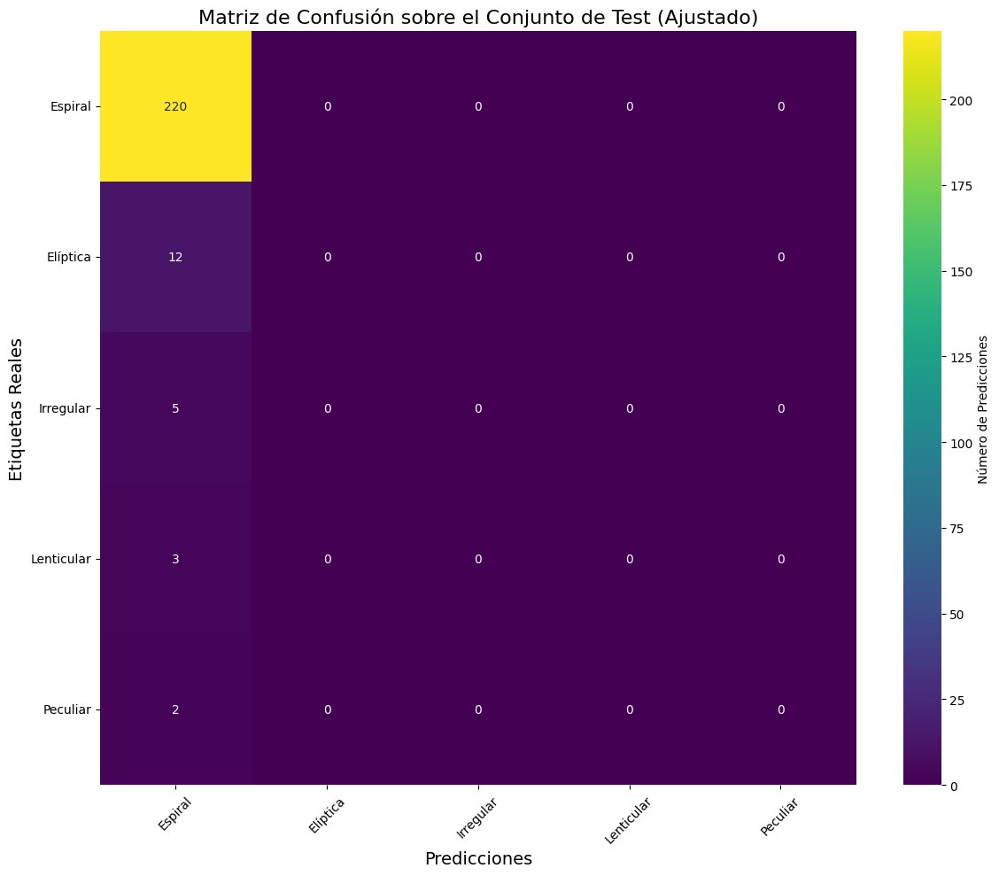

In [26]:
# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']

# Extraer imágenes y etiquetas del DataFrame
imagenes_array_completo = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada'].values) / 255.0
etiquetas_array_completo = df_imagen_filtrada_with_rotated['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_2_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_cnn_modelo1_filtered.keras')

### Clasificación sobre el conjunto completo ###

# Realizar predicciones sobre el conjunto completo
predicciones_completas = modelo_2_cargado.predict(imagenes_array_completo)
predicciones_clase_completas = np.argmax(predicciones_completas, axis=1)

# Comparar con las etiquetas reales
etiquetas_reales_completas = etiquetas_array_completo

# Generar un informe de clasificación para el conjunto completo
informe_clasificacion_completo = classification_report(etiquetas_reales_completas, predicciones_clase_completas, target_names=nombres_clases)
print("Informe de Clasificación Completo:\n", informe_clasificacion_completo)

# Generar una matriz de confusión para el conjunto completo
matriz_confusion_completa = confusion_matrix(etiquetas_reales_completas, predicciones_clase_completas)

# Visualizar la matriz de confusión para el conjunto completo
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_completa, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión Completa', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de entrenamiento ###

# Realizar predicciones sobre el conjunto de entrenamiento
predicciones_train = modelo_2_cargado.predict(train_images_cnn)
predicciones_clase_train = np.argmax(predicciones_train, axis=1)

# Comparar con las etiquetas reales del conjunto de entrenamiento
etiquetas_reales_train = train_labels_cnn

# Generar un informe de clasificación para el conjunto de entrenamiento
informe_clasificacion_train = classification_report(etiquetas_reales_train, predicciones_clase_train, target_names=nombres_clases)
print("\nInforme de Clasificación sobre el Conjunto de Entrenamiento:\n", informe_clasificacion_train)

# Generar una matriz de confusión para el conjunto de entrenamiento
matriz_confusion_train = confusion_matrix(etiquetas_reales_train, predicciones_clase_train)

# Visualizar la matriz de confusión para el conjunto de entrenamiento
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Entrenamiento', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de test ###

# Realizar predicciones sobre el conjunto de test
predicciones_test = modelo_2_cargado.predict(test_images_cnn)
predicciones_clase_test = np.argmax(predicciones_test, axis=1)

# Comparar con las etiquetas reales del conjunto de test
etiquetas_reales_test = test_labels_cnn

## Obtener las clases presentes en las etiquetas del conjunto de test
clases_presentes = np.unique(etiquetas_reales_test)

# Ajustar los nombres de las clases en base a las presentes
nombres_clases_test = [nombres_clases[i] for i in clases_presentes]

# Generar un informe de clasificación ajustado para las clases presentes
informe_clasificacion_test = classification_report(etiquetas_reales_test, predicciones_clase_test, target_names=nombres_clases_test, labels=clases_presentes)
print("\nInforme de Clasificación sobre el Conjunto de Test:\n", informe_clasificacion_test)

# Generar una matriz de confusión para las clases presentes
matriz_confusion_test = confusion_matrix(etiquetas_reales_test, predicciones_clase_test, labels=clases_presentes)

# Visualizar la matriz de confusión ajustada
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases_test, 
            yticklabels=nombres_clases_test,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Test (Ajustado)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


2


In [27]:
import tensorflow as tf

# Capa de convolución 1
conv_1_cnn_modelo2 = tf.keras.layers.Conv2D(filters=12,               # number of filters (number of kernels)
                                            kernel_size=(9, 9),       # kernel shape
                                            strides=(1, 1),           # how shift kernel moving along the image
                                            padding='valid',          # either to include padding or not
                                            activation='relu',        # activation function
                                            name='conv_1_cnn_modelo2',
                                            input_shape=(512, 512, 3)) # Adjusted input shape

# Capa de max pooling 1
pool_1_cnn_modelo2 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_1_cnn_modelo2')

# Capa de convolución 2
conv_2_cnn_modelo2 = tf.keras.layers.Conv2D(filters=12,               # number of filters (number of kernels)
                                            kernel_size=(9, 9),       # kernel shape
                                            strides=(1, 1),           # how shift kernel moving along the image
                                            padding='valid',          # either to include padding or not
                                            activation='relu',        # activation function
                                            name='conv_2_cnn_modelo2')

# Capa de max pooling 2
pool_2_cnn_modelo2 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_2_cnn_modelo2')

# Capa de flatten
flatten_layer_cnn_modelo2 = tf.keras.layers.Flatten()

# Capa densa 1
dense_1_cnn_modelo2 = tf.keras.layers.Dense(units=500, activation='relu', name='dense_1_cnn_modelo2')

# Capa densa 2
dense_2_cnn_modelo2 = tf.keras.layers.Dense(units=150, activation='relu', name='dense_2_cnn_modelo2')

# Capa de salida
num_classes = 5
output_layer_cnn_modelo2 = tf.keras.layers.Dense(units=num_classes, activation='softmax', name='output_layer_cnn_modelo2')

# Construir el modelo
model_cnn_modelo2 = tf.keras.models.Sequential([
    conv_1_cnn_modelo2,
    pool_1_cnn_modelo2,
    conv_2_cnn_modelo2,
    pool_2_cnn_modelo2,
    flatten_layer_cnn_modelo2,
    dense_1_cnn_modelo2,
    dense_2_cnn_modelo2,
    output_layer_cnn_modelo2
])

loss_function = tf.keras.losses.sparse_categorical_crossentropy
optim4 = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Compilar el modelo
model_cnn_modelo2.compile(optimizer=optim4,
                          loss=loss_function,
                          metrics=['accuracy'])

# Resumen del modelo
model_cnn_modelo2.summary()

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_1_cnn_modelo2 (Conv2D)     │ (None, 504, 504, 12)   │         2,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1_cnn_modelo2              │ (None, 168, 168, 12)   │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2_cnn_modelo2 (Conv2D)     │ (None, 160, 160, 12)   │        11,676 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2_cnn_modelo2              │ (None, 53, 53, 12)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 33708)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_cnn_modelo2 (Dense)     │ (None, 500)            │    16,854,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_cnn_modelo2 (Dense)     │ (None, 150)            │        75,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_cnn_modelo2        │ (None, 5)              │           755 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,945,009 (64.64 MB)

 Trainable params: 16,945,009 (64.64 MB)

 Non-trainable params: 0 (0.00 B)

In [28]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Configurar ModelCheckpoint para guardar los pesos del mejor modelo en base al val_loss
checkpoint_cnn_modelo_2 = ModelCheckpoint('002_MODELOS/checkpoint_cnn_modelo2_filtered.keras', 
                             monitor='val_loss',  # Guardar en base a la mejor val_loss
                             save_best_only=True,  # Solo guardar el mejor modelo
                             mode='min',           # Mínima val_loss es mejor
                             verbose=1)

# Entrenamos el modelo con EarlyStopping
history_cnn_modelo2 = model_cnn_modelo2.fit(train_images_cnn_resized, train_labels_cnn_resized,
                            epochs=50,
                            validation_data=(test_images_cnn_resized, test_labels_cnn_resized),
                            callbacks=[early_stopping,checkpoint_cnn_modelo_2],
                            ) 

best_epoch = early_stopping.stopped_epoch - early_stopping.patience
print(f"\nEl entrenamiento se detuvo en la época {early_stopping.stopped_epoch + 1}, con la mejor pérdida de validación (val_loss) en la época {best_epoch + 1}")
best_val_loss = min(history_cnn_modelo2.history['val_loss'])
best_val_accuracy = history_cnn_modelo2.history['val_accuracy'][history_cnn_modelo2.history['val_loss'].index(best_val_loss)]


print(f"Mejor pérdida de validación (val_loss): {best_val_loss}")
print(f"Mejor precisión en validación (val_accuracy): {best_val_accuracy}")

Epoch 1/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.8020 - loss: 0.6671
Epoch 1: val_loss improved from inf to 0.45635, saving model to 002_MODELOS/checkpoint_cnn_modelo2_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 15s 284ms/step - accuracy: 0.8046 - loss: 0.6628 - val_accuracy: 0.9091 - val_loss: 0.4564
Epoch 2/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9031 - loss: 0.4262
Epoch 2: val_loss improved from 0.45635 to 0.40385, saving model to 002_MODELOS/checkpoint_cnn_modelo2_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.9037 - loss: 0.4237 - val_accuracy: 0.9091 - val_loss: 0.4038
Epoch 3/50
30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.9033 - loss: 0.3650
Epoch 3: val_loss improved from 0.40385 to 0.40179, saving model to 002_MODELOS/checkpoint_cnn_modelo2_filtered.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.9037 - loss: 0.3640 - val_accuracy: 0.9091 - val_loss: 0.4018
Epoch 4/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 31

train_images_cnn_resized, test_images_cnn_resized, train_labels_cnn_resized, test_labels_cnn_resized = train_test_split(
    images_array_cnn_resized_n, 
    labels_array_cnn, 
    test_size=0.20, 
    random_state=42, 
    stratify=labels_array_cnn  # Asegurar que las clases se repartan equitativamente
)

38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step
Informe de Clasificación Completo:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95      1101
    Elíptica       0.00      0.00      0.00        62
   Irregular       0.00      0.00      0.00        25
  Lenticular       0.00      0.00      0.00        15
    Peculiar       0.00      0.00      0.00         7

    accuracy                           0.91      1210
   macro avg       0.18      0.20      0.19      1210
weighted avg       0.83      0.91      0.87      1210



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

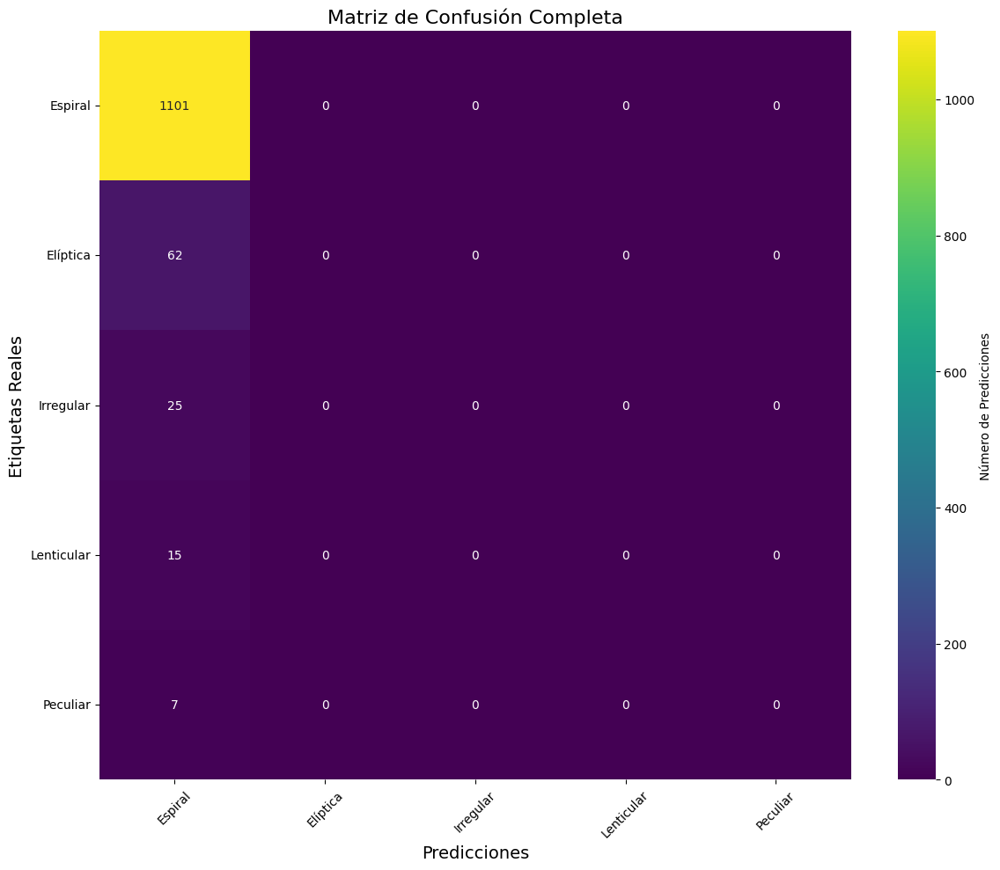

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       881
    Elíptica       0.00      0.00      0.00        50
   Irregular       0.00      0.00      0.00        20
  Lenticular       0.00      0.00      0.00        12
    Peculiar       0.00      0.00      0.00         5

    accuracy                           0.91       968
   macro avg       0.18      0.20      0.19       968
weighted avg       0.83      0.91      0.87       968



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

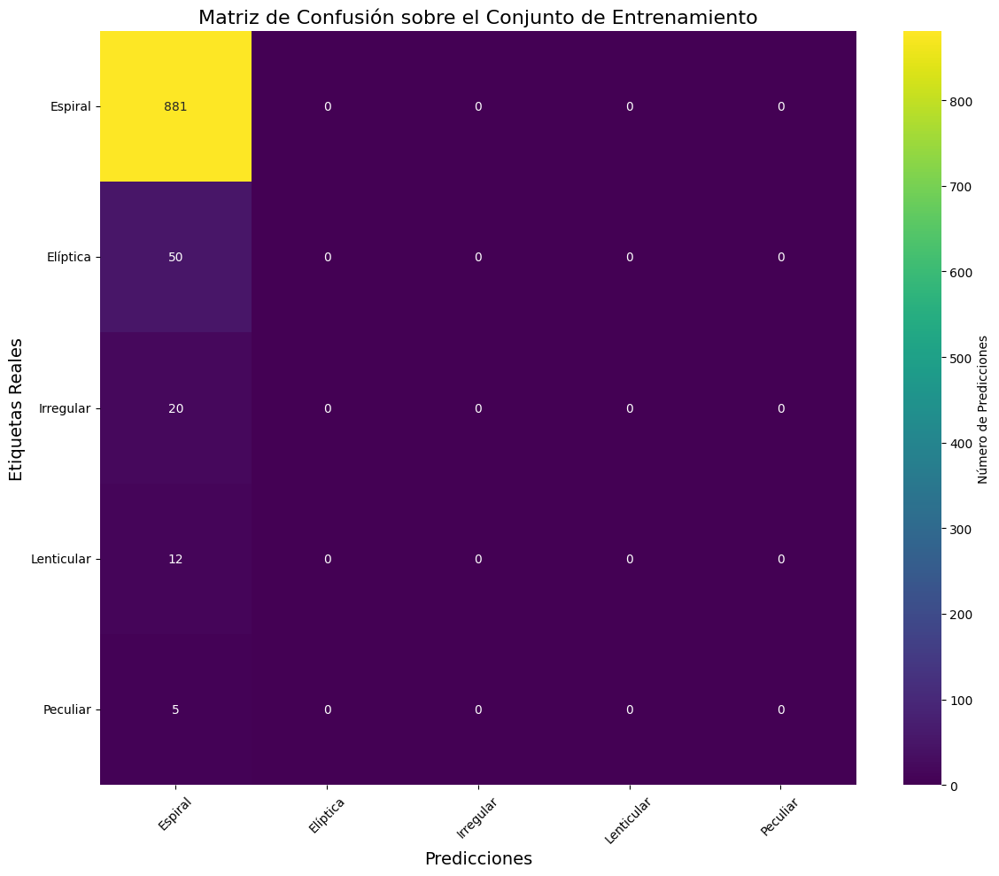

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 108ms/step

Informe de Clasificación sobre el Conjunto de Test:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       220
    Elíptica       0.00      0.00      0.00        12
   Irregular       0.00      0.00      0.00         5
  Lenticular       0.00      0.00      0.00         3
    Peculiar       0.00      0.00      0.00         2

    accuracy                           0.91       242
   macro avg       0.18      0.20      0.19       242
weighted avg       0.83      0.91      0.87       242



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

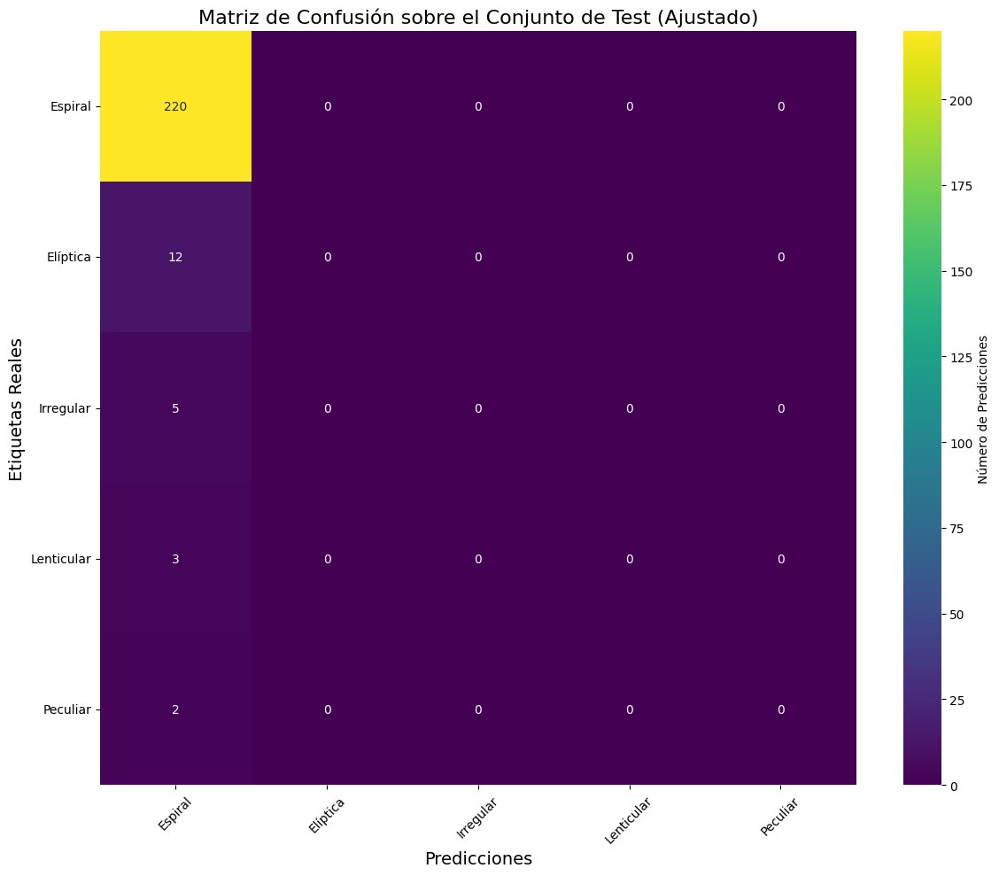

In [29]:
# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']

# Extraer imágenes y etiquetas del DataFrame
imagenes_array_completo = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_resized'].values) / 255.0
etiquetas_array_completo = df_imagen_filtrada_with_rotated['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_2_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_cnn_modelo2_filtered.keras')

### Clasificación sobre el conjunto completo ###

# Realizar predicciones sobre el conjunto completo
predicciones_completas = modelo_2_cargado.predict(imagenes_array_completo)
predicciones_clase_completas = np.argmax(predicciones_completas, axis=1)

# Comparar con las etiquetas reales
etiquetas_reales_completas = etiquetas_array_completo

# Generar un informe de clasificación para el conjunto completo
informe_clasificacion_completo = classification_report(etiquetas_reales_completas, predicciones_clase_completas, target_names=nombres_clases)
print("Informe de Clasificación Completo:\n", informe_clasificacion_completo)

# Generar una matriz de confusión para el conjunto completo
matriz_confusion_completa = confusion_matrix(etiquetas_reales_completas, predicciones_clase_completas)

# Visualizar la matriz de confusión para el conjunto completo
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_completa, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión Completa', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de entrenamiento ###

# Realizar predicciones sobre el conjunto de entrenamiento
predicciones_train = modelo_2_cargado.predict(train_images_cnn_resized)
predicciones_clase_train = np.argmax(predicciones_train, axis=1)

# Comparar con las etiquetas reales del conjunto de entrenamiento
etiquetas_reales_train = train_labels_cnn_resized

# Generar un informe de clasificación para el conjunto de entrenamiento
informe_clasificacion_train = classification_report(etiquetas_reales_train, predicciones_clase_train, target_names=nombres_clases)
print("\nInforme de Clasificación sobre el Conjunto de Entrenamiento:\n", informe_clasificacion_train)

# Generar una matriz de confusión para el conjunto de entrenamiento
matriz_confusion_train = confusion_matrix(etiquetas_reales_train, predicciones_clase_train)

# Visualizar la matriz de confusión para el conjunto de entrenamiento
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Entrenamiento', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de test ###

# Realizar predicciones sobre el conjunto de test
predicciones_test = modelo_2_cargado.predict(test_images_cnn_resized)
predicciones_clase_test = np.argmax(predicciones_test, axis=1)

# Comparar con las etiquetas reales del conjunto de test
etiquetas_reales_test = test_labels_cnn_resized

## Obtener las clases presentes en las etiquetas del conjunto de test
clases_presentes = np.unique(etiquetas_reales_test)

# Ajustar los nombres de las clases en base a las presentes
nombres_clases_test = [nombres_clases[i] for i in clases_presentes]

# Generar un informe de clasificación ajustado para las clases presentes
informe_clasificacion_test = classification_report(etiquetas_reales_test, predicciones_clase_test, target_names=nombres_clases_test, labels=clases_presentes)
print("\nInforme de Clasificación sobre el Conjunto de Test:\n", informe_clasificacion_test)

# Generar una matriz de confusión para las clases presentes
matriz_confusion_test = confusion_matrix(etiquetas_reales_test, predicciones_clase_test, labels=clases_presentes)

# Visualizar la matriz de confusión ajustada
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases_test, 
            yticklabels=nombres_clases_test,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Test (Ajustado)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


In [30]:
import tensorflow as tf

# Capa de convolución 1
conv_1_cnn_modelo3 = tf.keras.layers.Conv2D(filters=16, 
                                            kernel_size=(3, 3), 
                                            strides=(1, 1), 
                                            padding='valid', 
                                            activation='relu', 
                                            name='conv_1_cnn_modelo3',
                                            input_shape=(512, 512, 3))

# Capa de max pooling 1
pool_1_cnn_modelo3 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_1_cnn_modelo3')

# Capa de convolución 2
conv_2_cnn_modelo3 = tf.keras.layers.Conv2D(filters=16, 
                                            kernel_size=(3, 3), 
                                            strides=(1, 1), 
                                            padding='valid', 
                                            activation='relu', 
                                            name='conv_2_cnn_modelo3')

# Capa de max pooling 2
pool_2_cnn_modelo3 = tf.keras.layers.MaxPooling2D(pool_size=(3, 3),
                                                  strides=(3, 3),
                                                  name='pool_2_cnn_modelo3')

# Capa de flatten
flatten_layer_cnn_modelo3 = tf.keras.layers.Flatten()

# Capa densa 1
dense_1_cnn_modelo3 = tf.keras.layers.Dense(units=400, activation='relu', name='dense_1_cnn_modelo3')

# Capa densa 2
dense_2_cnn_modelo3 = tf.keras.layers.Dense(units=100, activation='relu', name='dense_2_cnn_modelo3')

num_classes=5
# Capa de salida
output_layer_cnn_modelo3 = tf.keras.layers.Dense(units=num_classes, activation='softmax', name='output_layer_cnn_modelo3')

# Construir el modelo
model_cnn_modelo3 = tf.keras.models.Sequential([
    conv_1_cnn_modelo3,
    pool_1_cnn_modelo3,
    conv_2_cnn_modelo3,
    pool_2_cnn_modelo3,
    flatten_layer_cnn_modelo3,
    dense_1_cnn_modelo3,
    dense_2_cnn_modelo3,
    output_layer_cnn_modelo3
])

loss_function = tf.keras.losses.sparse_categorical_crossentropy
optim5 = tf.keras.optimizers.Adam(learning_rate=5e-4)

# Compilar el modelo
model_cnn_modelo3.compile(optimizer=optim5,
                          loss=loss_function,
                          metrics=['accuracy'])

# Resumen del modelo
model_cnn_modelo3.summary()


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv_1_cnn_modelo3 (Conv2D)     │ (None, 510, 510, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1_cnn_modelo3              │ (None, 170, 170, 16)   │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2_cnn_modelo3 (Conv2D)     │ (None, 168, 168, 16)   │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2_cnn_modelo3              │ (None, 56, 56, 16)     │             0 │
│ (MaxPooling2D)                  │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1_cnn_modelo3 (Dense)     │ (None, 400)            │    20,070,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2_cnn_modelo3 (Dense)     │ (None, 100)            │        40,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_cnn_modelo3        │ (None, 5)              │           505 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,114,173 (76.73 MB)

 Trainable params: 20,114,173 (76.73 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Configurar ModelCheckpoint para guardar los pesos del mejor modelo en base al val_loss
checkpoint_modelo3 = ModelCheckpoint('002_MODELOS/checkpoint_cnn_modelo3_resized.keras', 
                             monitor='val_loss',  # Guardar en base a la mejor val_loss
                             save_best_only=True,  # Solo guardar el mejor modelo
                             mode='min',           # Mínima val_loss es mejor
                             verbose=1)

# Entrenamiento del modelo con EarlyStopping y batch_size=24
history_cnn_modelo3 = model_cnn_modelo3.fit(
    train_images_cnn_resized,       
    train_labels_cnn_resized,       
    epochs=50,                       
    validation_data=(test_images_cnn_resized, test_labels_cnn_resized),
    callbacks=[early_stopping, checkpoint_modelo3]  # Incluimos EarlyStopping y Checkpoint en los callbacks
)

# Imprimir los mejores resultados
best_epoch = early_stopping.stopped_epoch - early_stopping.patience
print(f"\nEl entrenamiento se detuvo en la época {early_stopping.stopped_epoch + 1}, con la mejor pérdida de validación (val_loss) en la época {best_epoch + 1}")

# Obtenemos los mejores resultados en base a val_loss
best_val_loss = min(history_cnn_modelo3.history['val_loss'])
best_val_accuracy = history_cnn_modelo3.history['val_accuracy'][history_cnn_modelo3.history['val_loss'].index(best_val_loss)]

print(f"Mejor pérdida de validación (val_loss): {best_val_loss}")
print(f"Mejor precisión en validación (val_accuracy): {best_val_accuracy}")


Epoch 1/50


2024-10-24 23:30:26.612784: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_557', 44 bytes spill stores, 44 bytes spill loads

2024-10-24 23:30:26.626091: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_557', 48 bytes spill stores, 48 bytes spill loads



31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step - accuracy: 0.7980 - loss: 0.7012
Epoch 1: val_loss improved from inf to 0.44071, saving model to 002_MODELOS/checkpoint_cnn_modelo3_resized.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 14s 279ms/step - accuracy: 0.8006 - loss: 0.6971 - val_accuracy: 0.9091 - val_loss: 0.4407
Epoch 2/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9031 - loss: 0.4161
Epoch 2: val_loss improved from 0.44071 to 0.40909, saving model to 002_MODELOS/checkpoint_cnn_modelo3_resized.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.9037 - loss: 0.4138 - val_accuracy: 0.9091 - val_loss: 0.4091
Epoch 3/50
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.9035 - loss: 0.3421
Epoch 3: val_loss improved from 0.40909 to 0.39325, saving model to 002_MODELOS/checkpoint_cnn_modelo3_resized.keras
31/31 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.9037 - loss: 0.3417 - val_accuracy: 0.9091 - val_loss: 0.3933
Epoch 4/50
29/31 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accu

38/38 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step


/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

Informe de Clasificación Completo:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95      1101
    Elíptica       0.00      0.00      0.00        62
   Irregular       1.00      0.16      0.28        25
  Lenticular       0.00      0.00      0.00        15
    Peculiar       0.00      0.00      0.00         7

    accuracy                           0.91      1210
   macro avg       0.38      0.23      0.25      1210
weighted avg       0.85      0.91      0.87      1210



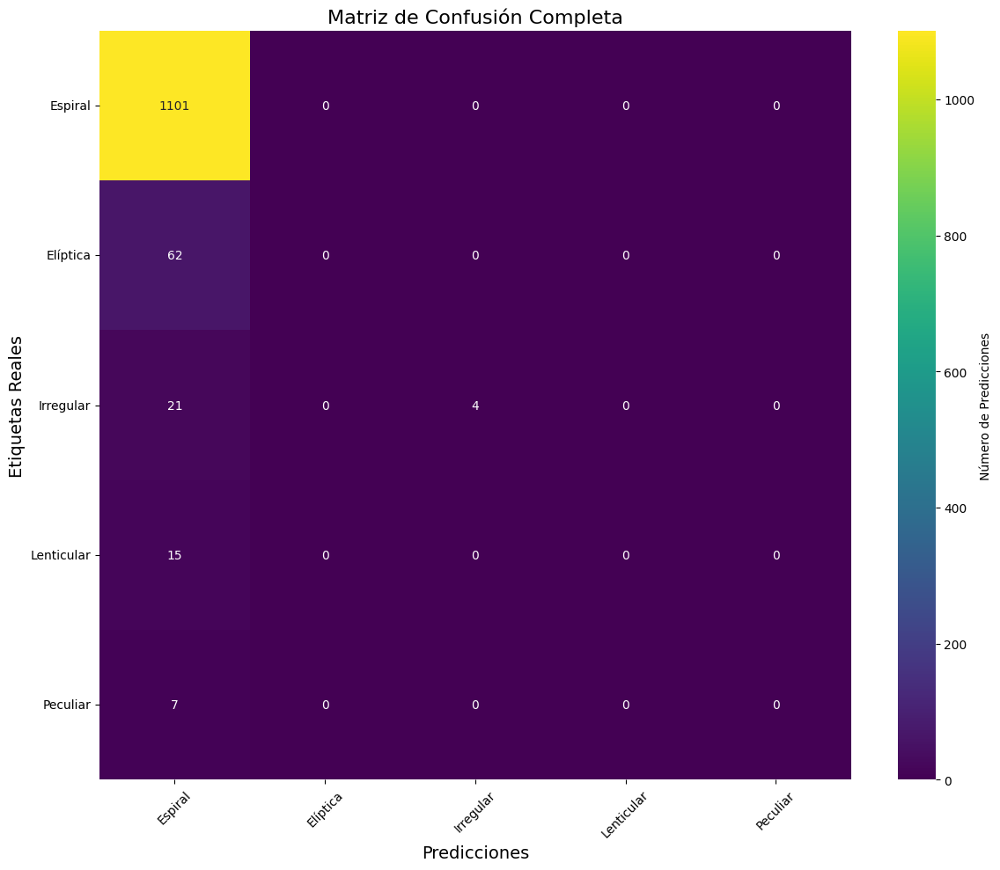

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.96       881
    Elíptica       0.00      0.00      0.00        50
   Irregular       1.00      0.20      0.33        20
  Lenticular       0.00      0.00      0.00        12
    Peculiar       0.00      0.00      0.00         5

    accuracy                           0.91       968
   macro avg       0.38      0.24      0.26       968
weighted avg       0.85      0.91      0.88       968



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

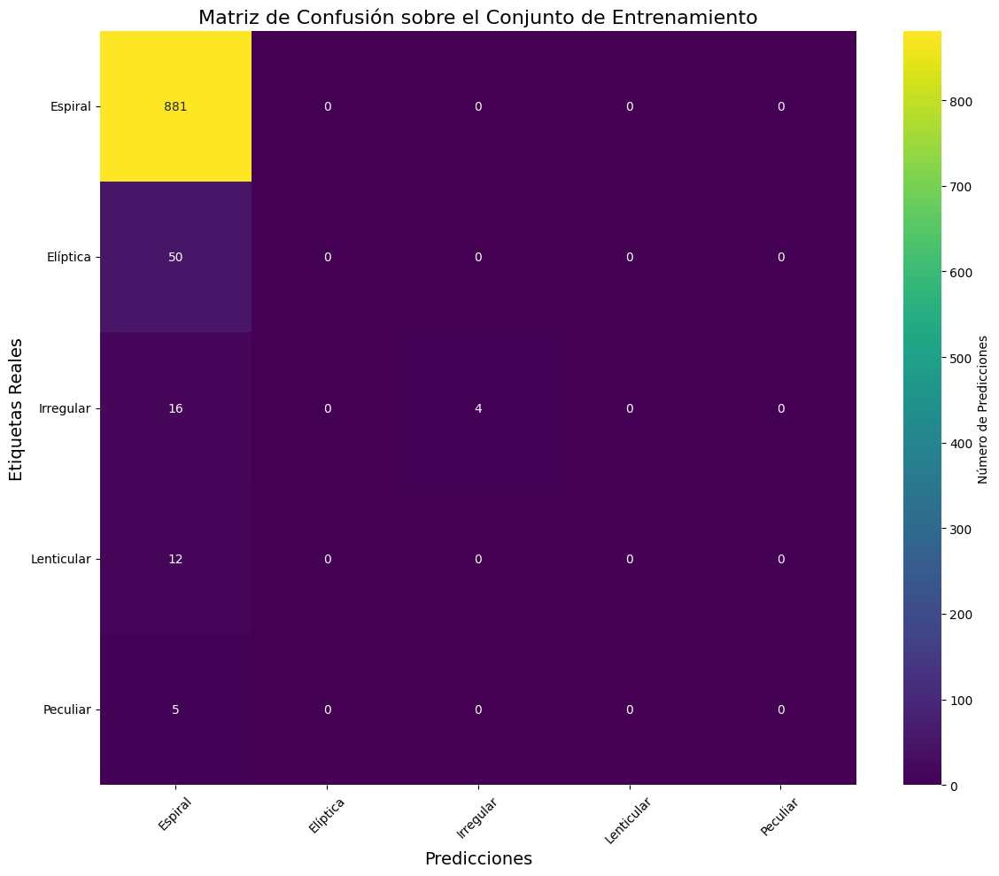

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step

Informe de Clasificación sobre el Conjunto de Test:
               precision    recall  f1-score   support

     Espiral       0.91      1.00      0.95       220
    Elíptica       0.00      0.00      0.00        12
   Irregular       0.00      0.00      0.00         5
  Lenticular       0.00      0.00      0.00         3
    Peculiar       0.00      0.00      0.00         2

    accuracy                           0.91       242
   macro avg       0.18      0.20      0.19       242
weighted avg       0.83      0.91      0.87       242



/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

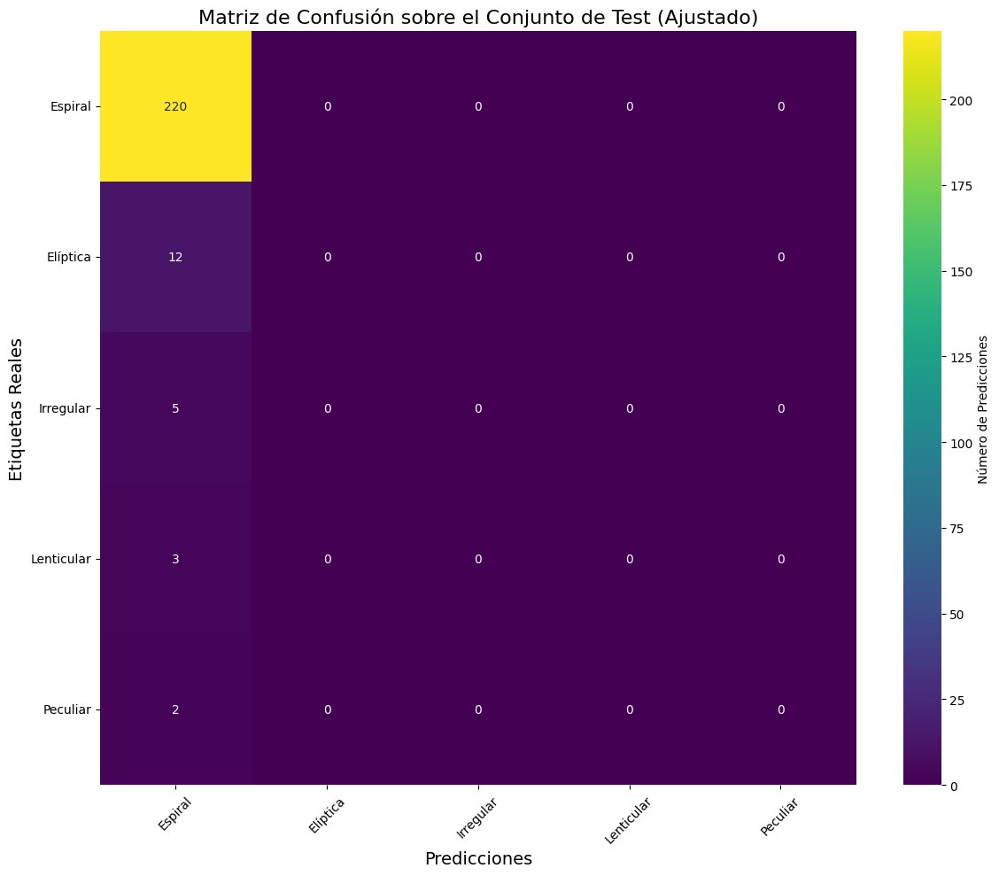

In [33]:
# Define los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral', 'Elíptica', 'Irregular', 'Lenticular', 'Peculiar']

# Extraer imágenes y etiquetas del DataFrame
imagenes_array_completo = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_resized'].values) / 255.0
etiquetas_array_completo = df_imagen_filtrada_with_rotated['clasificación1'].values

# Cargar el modelo desde el archivo guardado
modelo_2_cargado = tf.keras.models.load_model('002_MODELOS/checkpoint_cnn_modelo3_resized.keras')

### Clasificación sobre el conjunto completo ###

# Realizar predicciones sobre el conjunto completo
predicciones_completas = modelo_2_cargado.predict(imagenes_array_completo)
predicciones_clase_completas = np.argmax(predicciones_completas, axis=1)

# Comparar con las etiquetas reales
etiquetas_reales_completas = etiquetas_array_completo

# Generar un informe de clasificación para el conjunto completo
informe_clasificacion_completo = classification_report(etiquetas_reales_completas, predicciones_clase_completas, target_names=nombres_clases)
print("Informe de Clasificación Completo:\n", informe_clasificacion_completo)

# Generar una matriz de confusión para el conjunto completo
matriz_confusion_completa = confusion_matrix(etiquetas_reales_completas, predicciones_clase_completas)

# Visualizar la matriz de confusión para el conjunto completo
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_completa, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión Completa', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de entrenamiento ###

# Realizar predicciones sobre el conjunto de entrenamiento
predicciones_train = modelo_2_cargado.predict(train_images_cnn_resized)
predicciones_clase_train = np.argmax(predicciones_train, axis=1)

# Comparar con las etiquetas reales del conjunto de entrenamiento
etiquetas_reales_train = train_labels_cnn_resized

# Generar un informe de clasificación para el conjunto de entrenamiento
informe_clasificacion_train = classification_report(etiquetas_reales_train, predicciones_clase_train, target_names=nombres_clases)
print("\nInforme de Clasificación sobre el Conjunto de Entrenamiento:\n", informe_clasificacion_train)

# Generar una matriz de confusión para el conjunto de entrenamiento
matriz_confusion_train = confusion_matrix(etiquetas_reales_train, predicciones_clase_train)

# Visualizar la matriz de confusión para el conjunto de entrenamiento
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases, yticklabels=nombres_clases,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Entrenamiento', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### Clasificación sobre el conjunto de test ###

# Realizar predicciones sobre el conjunto de test
predicciones_test = modelo_2_cargado.predict(test_images_cnn_resized)
predicciones_clase_test = np.argmax(predicciones_test, axis=1)

# Comparar con las etiquetas reales del conjunto de test
etiquetas_reales_test = test_labels_cnn_resized

## Obtener las clases presentes en las etiquetas del conjunto de test
clases_presentes = np.unique(etiquetas_reales_test)

# Ajustar los nombres de las clases en base a las presentes
nombres_clases_test = [nombres_clases[i] for i in clases_presentes]

# Generar un informe de clasificación ajustado para las clases presentes
informe_clasificacion_test = classification_report(etiquetas_reales_test, predicciones_clase_test, target_names=nombres_clases_test, labels=clases_presentes)
print("\nInforme de Clasificación sobre el Conjunto de Test:\n", informe_clasificacion_test)

# Generar una matriz de confusión para las clases presentes
matriz_confusion_test = confusion_matrix(etiquetas_reales_test, predicciones_clase_test, labels=clases_presentes)

# Visualizar la matriz de confusión ajustada
plt.figure(figsize=(12, 10))
sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis',
            xticklabels=nombres_clases_test, 
            yticklabels=nombres_clases_test,
            cbar_kws={'label': 'Número de Predicciones'})
plt.xlabel('Predicciones', fontsize=14)
plt.ylabel('Etiquetas Reales', fontsize=14)
plt.title('Matriz de Confusión sobre el Conjunto de Test (Ajustado)', fontsize=16)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


## 6. MODELOS GRANDES 2DA CLASIFICACIÓN. 


In [5]:
images_array_VGG16_clasif2 = np.stack(df_imagen_filtrada_with_rotated['Imagen_filtrada_resized'].values) / 255.0
labels_array_VGG16_clasif2 = np.array(df_imagen_filtrada_with_rotated['clasificación_2'].values)


train_images_VGG16_clasif2, test_images_VGG16_clasif2,train_labels_VGG16_clasif2,test_labels_VGG16_clasif2  = train_test_split(
    images_array_VGG16_clasif2, labels_array_VGG16_clasif2, test_size=0.20, random_state=42 ,stratify=labels_array_VGG16_clasif2  # Asegurar que las clases se repartan equitativamente
)

In [15]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, VGG19, InceptionV3, DenseNet121, ResNet50
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Definir función para agregar capas densas después del modelo base
def agregar_capas_densas(modelo_base, num_clases):
    modelo = models.Sequential([
        modelo_base,
        layers.Flatten(),
        layers.Dense(2048, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(2048, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_clases, activation='softmax')
    ])
    return modelo

# Función para compilar el modelo
def compilar_modelo(modelo):
    modelo.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), 
                   loss='sparse_categorical_crossentropy', 
                   metrics=['accuracy'])
    return modelo

# Crear una función para entrenar los modelos con callbacks
def entrenar_modelo(modelo, nombre_modelo, train_images, train_labels, val_images, val_labels):
    # Callbacks
    checkpoint = ModelCheckpoint(f'002_MODELOS/mejor_modelo_{nombre_modelo}.keras', 
                                 monitor='val_loss', 
                                 save_best_only=True, 
                                 mode='min', 
                                 verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', 
                                   patience=20, 
                                   restore_best_weights=True, 
                                   verbose=1)
    
    # Entrenar
    history = modelo.fit(train_images, train_labels, 
                         validation_data=(val_images, val_labels), 
                         epochs=100, 
                         batch_size=4,
                         callbacks=[checkpoint, early_stopping])
    return history

# Parámetros
input_shape = (512, 512, 3) 
num_clases = 9  

In [6]:
# VGG16
from tensorflow.keras import backend as K
K.clear_session()

vgg16_base = VGG16(weights=None, include_top=False, input_shape=input_shape)
modelo_vgg16 = agregar_capas_densas(vgg16_base, num_clases)
modelo_vgg16 = compilar_modelo(modelo_vgg16)

history_modeloVGG16=entrenar_modelo(modelo_vgg16, VGG16, train_images_VGG16_clasif2, train_labels_VGG16_clasif2, test_images_VGG16_clasif2, test_labels_VGG16_clasif2)

2024-10-25 01:13:57.761509: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38485 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:25:00.0, compute capability: 8.0


Epoch 1/100


I0000 00:00:1729811643.574797  408216 service.cc:146] XLA service 0x7f03fc008a70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729811643.574828  408216 service.cc:154]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2024-10-25 01:14:03.700776: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-10-25 01:14:04.102396: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-10-25 01:14:12.532921: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 32.33GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-10-25 01:14:13.484607: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] All

  3/242 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step - accuracy: 0.0694 - loss: 2.1972     

I0000 00:00:1729811655.766854  408216 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


241/242 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3988 - loss: 1.7730

2024-10-25 01:14:28.434860: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_203', 144 bytes spill stores, 144 bytes spill loads

2024-10-25 01:14:29.605958: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 32.77GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-10-25 01:14:30.026247: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 32.78GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-10-25 01:14:32.471695: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to


Epoch 1: val_loss improved from inf to 1.51425, saving model to 002_MODELOS/mejor_modelo_<function VGG16 at 0x7f19ce0d78b0>.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.3992 - loss: 1.7717 - val_accuracy: 0.4628 - val_loss: 1.5142
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.4277 - loss: 1.5779
Epoch 2: val_loss improved from 1.51425 to 1.50717, saving model to 002_MODELOS/mejor_modelo_<function VGG16 at 0x7f19ce0d78b0>.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 283s 1s/step - accuracy: 0.4278 - loss: 1.5776 - val_accuracy: 0.4628 - val_loss: 1.5072
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.4178 - loss: 1.5873
Epoch 3: val_loss improved from 1.50717 to 1.50044, saving model to 002_MODELOS/mejor_modelo_<function VGG16 at 0x7f19ce0d78b0>.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 299s 1s/step - accuracy: 0.4179 - loss: 1.5870 - val_accuracy: 0.4628 - val_loss: 1.5004
Epoch 4/100
241/242 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.428

In [7]:
# VGG19

from tensorflow.keras import backend as K
K.clear_session()

vgg19_base = VGG19(weights=None, include_top=False, input_shape=input_shape)
modelo_vgg19 = agregar_capas_densas(vgg19_base, num_clases)
modelo_vgg19 = compilar_modelo(modelo_vgg19)
history_modeloVGG19=entrenar_modelo(modelo_vgg19, "modelo_vgg19", train_images_VGG16_clasif2, train_labels_VGG16_clasif2, test_images_VGG16_clasif2, test_labels_VGG16_clasif2)


Epoch 1/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.3951 - loss: 1.7550
Epoch 1: val_loss improved from inf to 1.50764, saving model to 002_MODELOS/mejor_modelo_modelo_vgg19.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 216s 872ms/step - accuracy: 0.3953 - loss: 1.7543 - val_accuracy: 0.4628 - val_loss: 1.5076
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4258 - loss: 1.5840
Epoch 2: val_loss improved from 1.50764 to 1.50226, saving model to 002_MODELOS/mejor_modelo_modelo_vgg19.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 304s 1s/step - accuracy: 0.4259 - loss: 1.5837 - val_accuracy: 0.4628 - val_loss: 1.5023
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4214 - loss: 1.5750
Epoch 3: val_loss improved from 1.50226 to 1.49982, saving model to 002_MODELOS/mejor_modelo_modelo_vgg19.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 240s 994ms/step - accuracy: 0.4215 - loss: 1.5748 - val_accuracy: 0.4628 - val_loss: 1.4998
Epoch 4/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [8]:
# InceptionV3
inception_base = InceptionV3(weights=None, include_top=False, input_shape=input_shape)
modelo_inception = agregar_capas_densas(inception_base, num_clases)
modelo_inception = compilar_modelo(modelo_inception)
history_modeloInception=entrenar_modelo(modelo_inception, "inception", train_images_VGG16_clasif2, train_labels_VGG16_clasif2, test_images_VGG16_clasif2, test_labels_VGG16_clasif2)



Epoch 1/100


2024-10-25 05:13:28.179359: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 456 bytes spill stores, 496 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 448 bytes spill stores, 472 bytes spill loads



242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.2627 - loss: 30.7384
Epoch 1: val_loss improved from inf to 1.90029, saving model to 002_MODELOS/mejor_modelo_inception.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 1619s 6s/step - accuracy: 0.2629 - loss: 30.6904 - val_accuracy: 0.4628 - val_loss: 1.9003
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3219 - loss: 4.1034
Epoch 2: val_loss improved from 1.90029 to 1.60693, saving model to 002_MODELOS/mejor_modelo_inception.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 717s 3s/step - accuracy: 0.3220 - loss: 4.0988 - val_accuracy: 0.4545 - val_loss: 1.6069
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3525 - loss: 1.8653
Epoch 3: val_loss improved from 1.60693 to 1.58266, saving model to 002_MODELOS/mejor_modelo_inception.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 717s 3s/step - accuracy: 0.3525 - loss: 1.8649 - val_accuracy: 0.4628 - val_loss: 1.5827
Epoch 4/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.

In [9]:
# DenseNet121
densenet_base = DenseNet121(weights=None, include_top=False, input_shape=input_shape)
modelo_densenet = agregar_capas_densas(densenet_base, num_clases)
modelo_densenet = compilar_modelo(modelo_densenet)
history_modelodensenet=entrenar_modelo(modelo_densenet, "densenet", train_images_VGG16_clasif2, train_labels_VGG16_clasif2, test_images_VGG16_clasif2, test_labels_VGG16_clasif2)



Epoch 1/100


2024-10-25 07:16:09.678245: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_4', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_6', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_8', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_25', 12 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_12', 24 bytes spill stores, 28 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_16', 16 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to loca

242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.2764 - loss: 18.4706
Epoch 1: val_loss improved from inf to 1.63178, saving model to 002_MODELOS/mejor_modelo_densenet.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 1053s 4s/step - accuracy: 0.2765 - loss: 18.4473 - val_accuracy: 0.4628 - val_loss: 1.6318
Epoch 2/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.3173 - loss: 4.1926
Epoch 2: val_loss improved from 1.63178 to 1.55007, saving model to 002_MODELOS/mejor_modelo_densenet.keras
242/242 ━━━━━━━━━━━━━━━━━━━━ 774s 3s/step - accuracy: 0.3175 - loss: 4.1885 - val_accuracy: 0.4628 - val_loss: 1.5501
Epoch 3/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3511 - loss: 1.8566
Epoch 3: val_loss did not improve from 1.55007
242/242 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - accuracy: 0.3512 - loss: 1.8563 - val_accuracy: 0.4545 - val_loss: 1.6706
Epoch 4/100
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.3612 - loss: 1.7677
Epoch 4: val_loss improved from 1.55007 to 

In [10]:
#ResNet50
from tensorflow.keras import backend as K
K.clear_session()

resnet_base = ResNet50(weights=None, include_top=False, input_shape=input_shape)
modelo_resnet = agregar_capas_densas(resnet_base, num_clases)
modelo_resnet = compilar_modelo(modelo_resnet)
history_modeloresnet=entrenar_modelo(modelo_resnet, "resnet", train_images_VGG16_clasif2, train_labels_VGG16_clasif2, test_images_VGG16_clasif2, test_labels_VGG16_clasif2)



2024-10-25 10:27:24.769712: W external/local_tsl/tsl/framework/bfc_allocator.cc:482] Allocator (GPU_0_bfc) ran out of memory trying to allocate 4.00GiB (rounded to 4294967296)requested by op StatelessRandomUniformV2
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2024-10-25 10:27:24.769772: I external/local_tsl/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2024-10-25 10:27:24.769789: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 113, Chunks in use: 113. 28.2KiB allocated for chunks. 28.2KiB in use in bin. 17.8KiB client-requested in use in bin.
2024-10-25 10:27:24.769803: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 80, Chunks in use: 80. 40.0KiB allocated for chunks. 40.0KiB in use in bin. 40.0KiB client-requested in use in bin.
20

ResourceExhaustedError: {{function_node __wrapped__StatelessRandomUniformV2_device_/job:localhost/replica:0/task:0/device:GPU:0}} OOM when allocating tensor with shape[524288,2048] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc [Op:StatelessRandomUniformV2] name: 

In [6]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Definir los nombres de las clases según el orden de los índices
nombres_clases = ['Espiral no barrada', 'Espiral barrada', 'Espiral barrada intermedia', 'Espiral barrada peculiar', 
                  'Espiral barra indeterminada', 'Lenticular', 'Elíptica', 'Irregular', 'Peculiar']


# Lista de modelos a evaluar (ajusta los nombres según los archivos guardados)
modelos_guardados = {
    "VGG16": "002_MODELOS/mejor_modelo_<function VGG16 at 0x7f19ce0d78b0>.keras",
    "VGG19": "002_MODELOS/mejor_modelo_densenet.keras",
    "InceptionV3": "002_MODELOS/mejor_modelo_inception.keras",
    "DenseNet121": "002_MODELOS/mejor_modelo_modelo_vgg19.keras",
    "ResNet50": "002_MODELOS/mejor_modelo_resnet.keras"
}

# Función para evaluar un modelo y generar informe y matriz de confusión
def evaluar_modelo(nombre_modelo, ruta_modelo, imagenes_train, etiquetas_train, imagenes_test, etiquetas_test):
    print(f"Evaluando el modelo {nombre_modelo}...")
    
    from tensorflow.keras import backend as K
    K.clear_session()
    
    # Cargar el modelo guardado
    modelo = tf.keras.models.load_model(ruta_modelo)

    # Evaluar en el conjunto de entrenamiento
    predicciones_train = modelo.predict(imagenes_train)
    predicciones_clase_train = np.argmax(predicciones_train, axis=1)
    informe_clasificacion_train = classification_report(etiquetas_train, predicciones_clase_train, target_names=nombres_clases)
    print(f"\nInforme de Clasificación sobre el Conjunto de Entrenamiento para {nombre_modelo}:\n", informe_clasificacion_train)
    
    matriz_confusion_train = confusion_matrix(etiquetas_train, predicciones_clase_train)
    plt.figure(figsize=(12, 10))
    sns.heatmap(matriz_confusion_train, annot=True, fmt='d', cmap='viridis', 
                xticklabels=nombres_clases, 
                yticklabels=nombres_clases,
                cbar_kws={'label': 'Número de Predicciones'})
    plt.xlabel('Predicciones', fontsize=14)
    plt.ylabel('Etiquetas Reales', fontsize=14)
    plt.title(f'Matriz de Confusión en Entrenamiento para {nombre_modelo}', fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    # Evaluar en el conjunto de prueba
    predicciones_test = modelo.predict(imagenes_test)
    predicciones_clase_test = np.argmax(predicciones_test, axis=1)
    informe_clasificacion_test = classification_report(etiquetas_test, predicciones_clase_test, target_names=nombres_clases)
    print(f"\nInforme de Clasificación sobre el Conjunto de Test para {nombre_modelo}:\n", informe_clasificacion_test)
    
    matriz_confusion_test = confusion_matrix(etiquetas_test, predicciones_clase_test)
    plt.figure(figsize=(12, 10))
    sns.heatmap(matriz_confusion_test, annot=True, fmt='d', cmap='viridis', 
                xticklabels=nombres_clases, 
                yticklabels=nombres_clases,
                cbar_kws={'label': 'Número de Predicciones'})
    plt.xlabel('Predicciones', fontsize=14)
    plt.ylabel('Etiquetas Reales', fontsize=14)
    plt.title(f'Matriz de Confusión en Test para {nombre_modelo}', fontsize=16)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()




Evaluando el modelo VGG16...


2024-10-25 10:35:56.760028: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38485 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:25:00.0, compute capability: 8.0
I0000 00:00:1729845367.436128  539082 service.cc:146] XLA service 0x7fd26400bcd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1729845367.436162  539082 service.cc:154]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
2024-10-25 10:36:07.445663: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-10-25 10:36:07.522150: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-10-25 10:36:08.296031: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled t

 3/31 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

I0000 00:00:1729845378.323723  539082 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


30/31 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

2024-10-25 10:36:21.131119: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_184', 144 bytes spill stores, 144 bytes spill loads

2024-10-25 10:36:23.488803: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 33.28GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-10-25 10:36:24.042191: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 33.03GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


31/31 ━━━━━━━━━━━━━━━━━━━━ 17s 210ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento para VGG16:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      1.00      0.63       448
            Espiral barrada       0.00      0.00      0.00       119
 Espiral barrada intermedia       0.00      0.00      0.00       262
   Espiral barrada peculiar       0.00      0.00      0.00        25
Espiral barra indeterminada       0.00      0.00      0.00        26
                 Lenticular       0.00      0.00      0.00        13
                   Elíptica       0.00      0.00      0.00        48
                  Irregular       0.00      0.00      0.00        21
                   Peculiar       0.00      0.00      0.00         6

                   accuracy                           0.46       968
                  macro avg       0.05      0.11      0.07       968
               weighted avg       0.21      0.46      

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

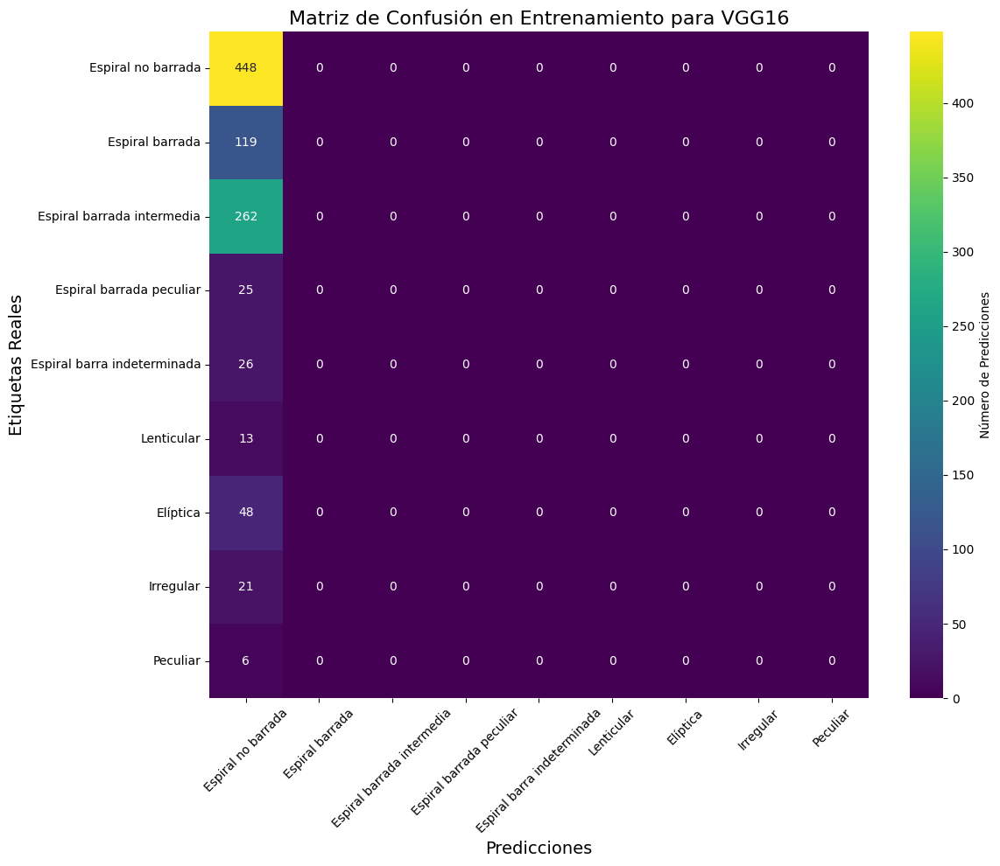

7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

2024-10-25 10:36:26.929700: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_177', 204 bytes spill stores, 204 bytes spill loads

2024-10-25 10:36:26.966915: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_184', 144 bytes spill stores, 144 bytes spill loads

2024-10-25 10:36:26.971976: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_177', 36 bytes spill stores, 36 bytes spill loads

2024-10-25 10:36:27.109375: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_184', 404 bytes spill stores, 404 bytes spill loads

2024-10-25 10:36:31.496667: W external/local_tsl/tsl/frame

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step 

Informe de Clasificación sobre el Conjunto de Test para VGG16:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      1.00      0.63       112
            Espiral barrada       0.00      0.00      0.00        30
 Espiral barrada intermedia       0.00      0.00      0.00        65
   Espiral barrada peculiar       0.00      0.00      0.00         6
Espiral barra indeterminada       0.00      0.00      0.00         7
                 Lenticular       0.00      0.00      0.00         3
                   Elíptica       0.00      0.00      0.00        12
                  Irregular       0.00      0.00      0.00         6
                   Peculiar       0.00      0.00      0.00         1

                   accuracy                           0.46       242
                  macro avg       0.05      0.11      0.07       242
               weighted avg       0.21      0.46      0.29       242

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

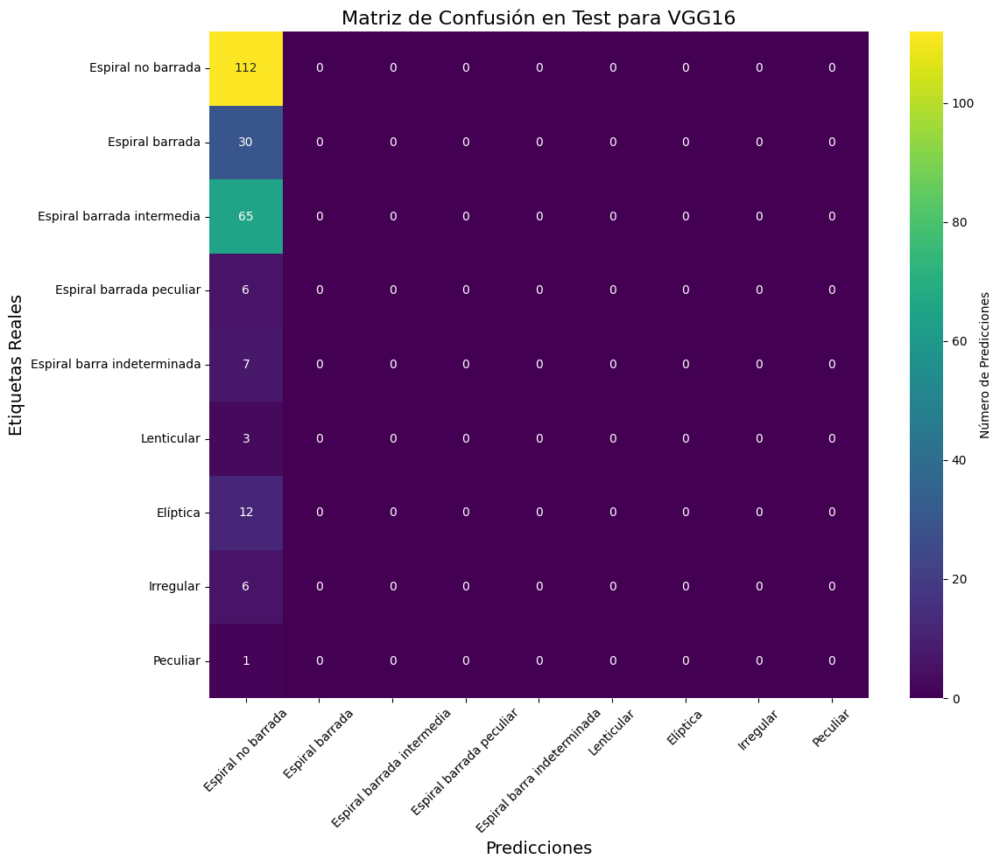

Evaluando el modelo VGG19...
31/31 ━━━━━━━━━━━━━━━━━━━━ 28s 393ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento para VGG19:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      0.98      0.62       448
            Espiral barrada       0.00      0.00      0.00       119
 Espiral barrada intermedia       0.10      0.00      0.01       262
   Espiral barrada peculiar       0.00      0.00      0.00        25
Espiral barra indeterminada       0.00      0.00      0.00        26
                 Lenticular       0.00      0.00      0.00        13
                   Elíptica       0.00      0.00      0.00        48
                  Irregular       0.00      0.00      0.00        21
                   Peculiar       0.00      0.00      0.00         6

                   accuracy                           0.45       968
                  macro avg       0.06      0.11      0.07       968
               weighted a

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

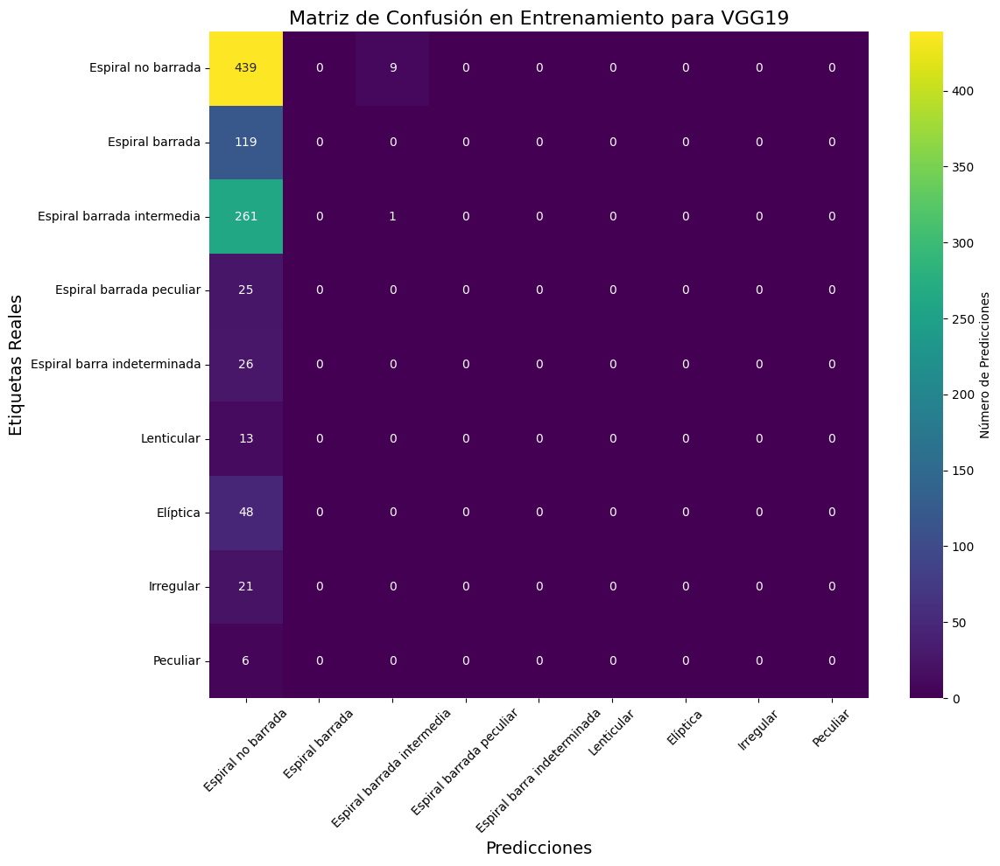

8/8 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step

Informe de Clasificación sobre el Conjunto de Test para VGG19:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      0.99      0.63       112
            Espiral barrada       0.00      0.00      0.00        30
 Espiral barrada intermedia       0.00      0.00      0.00        65
   Espiral barrada peculiar       0.00      0.00      0.00         6
Espiral barra indeterminada       0.00      0.00      0.00         7
                 Lenticular       0.00      0.00      0.00         3
                   Elíptica       0.00      0.00      0.00        12
                  Irregular       0.00      0.00      0.00         6
                   Peculiar       0.00      0.00      0.00         1

                   accuracy                           0.46       242
                  macro avg       0.05      0.11      0.07       242
               weighted avg       0.21      0.46      0.29       242

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

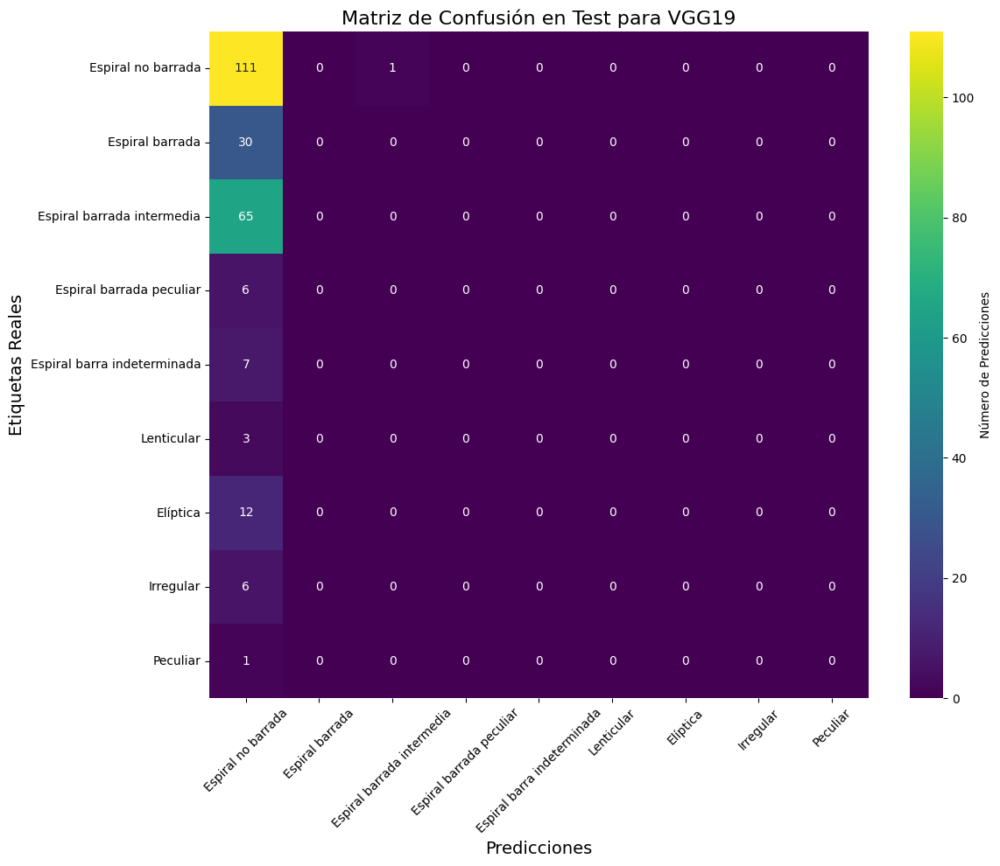

Evaluando el modelo InceptionV3...
31/31 ━━━━━━━━━━━━━━━━━━━━ 19s 257ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento para InceptionV3:
                              precision    recall  f1-score   support

         Espiral no barrada       0.47      0.99      0.64       448
            Espiral barrada       0.82      0.08      0.14       119
 Espiral barrada intermedia       0.73      0.03      0.06       262
   Espiral barrada peculiar       0.43      0.12      0.19        25
Espiral barra indeterminada       1.00      0.04      0.07        26
                 Lenticular       0.00      0.00      0.00        13
                   Elíptica       1.00      0.02      0.04        48
                  Irregular       1.00      0.05      0.09        21
                   Peculiar       0.00      0.00      0.00         6

                   accuracy                           0.48       968
                  macro avg       0.61      0.15      0.14       968
             

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

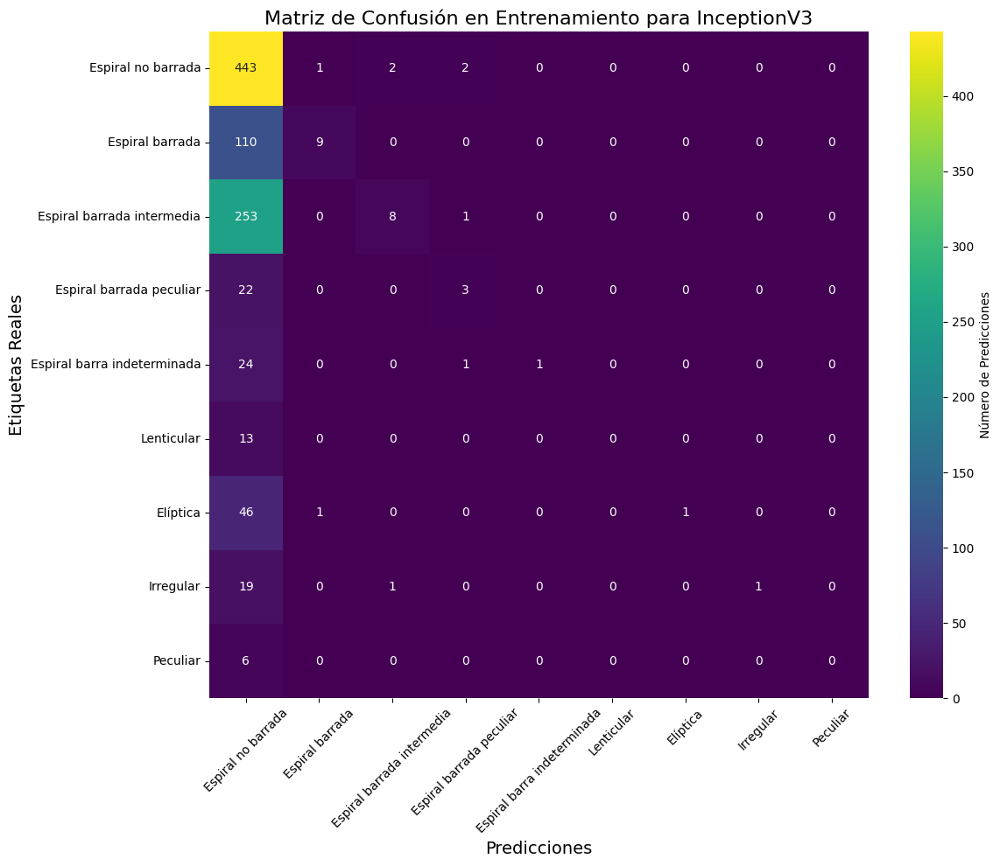

8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 991ms/step

Informe de Clasificación sobre el Conjunto de Test para InceptionV3:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      0.97      0.63       112
            Espiral barrada       0.67      0.07      0.12        30
 Espiral barrada intermedia       0.33      0.02      0.03        65
   Espiral barrada peculiar       0.00      0.00      0.00         6
Espiral barra indeterminada       0.00      0.00      0.00         7
                 Lenticular       0.00      0.00      0.00         3
                   Elíptica       0.00      0.00      0.00        12
                  Irregular       0.00      0.00      0.00         6
                   Peculiar       0.00      0.00      0.00         1

                   accuracy                           0.46       242
                  macro avg       0.16      0.12      0.09       242
               weighted avg       0.39      0.46      0.31  

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

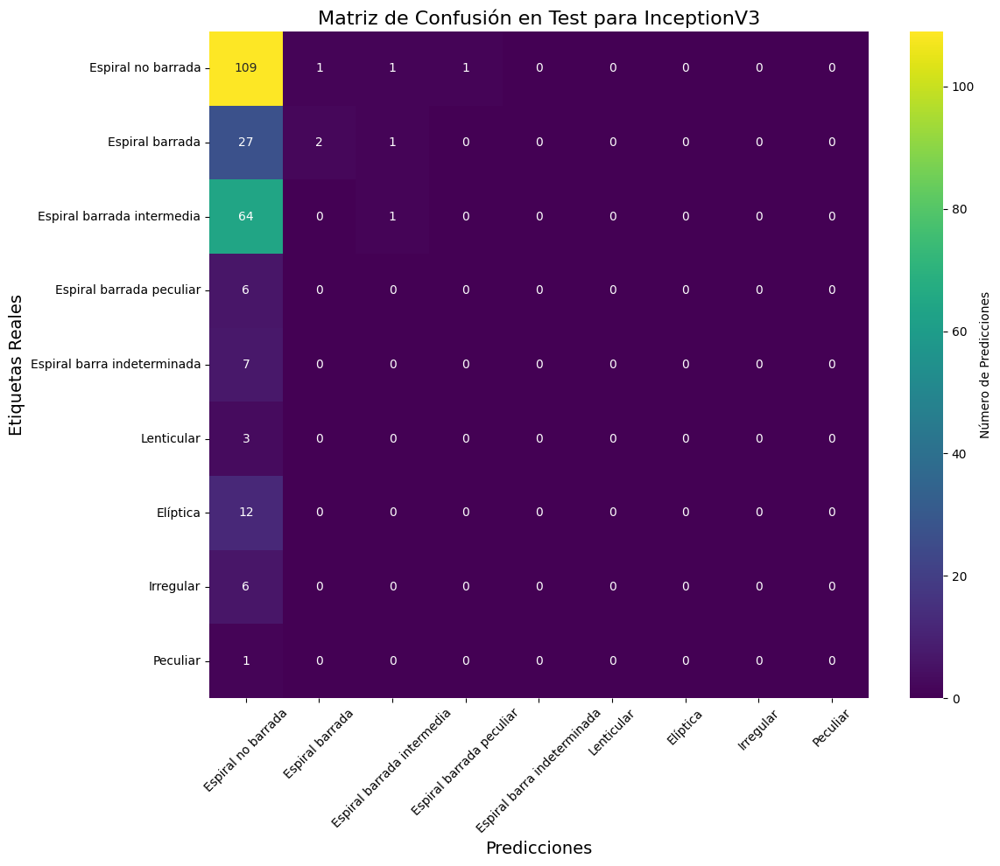

Evaluando el modelo DenseNet121...
31/31 ━━━━━━━━━━━━━━━━━━━━ 4s 100ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento para DenseNet121:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      1.00      0.63       448
            Espiral barrada       0.00      0.00      0.00       119
 Espiral barrada intermedia       0.00      0.00      0.00       262
   Espiral barrada peculiar       0.00      0.00      0.00        25
Espiral barra indeterminada       0.00      0.00      0.00        26
                 Lenticular       0.00      0.00      0.00        13
                   Elíptica       0.00      0.00      0.00        48
                  Irregular       0.00      0.00      0.00        21
                   Peculiar       0.00      0.00      0.00         6

                   accuracy                           0.46       968
                  macro avg       0.05      0.11      0.07       968
              

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

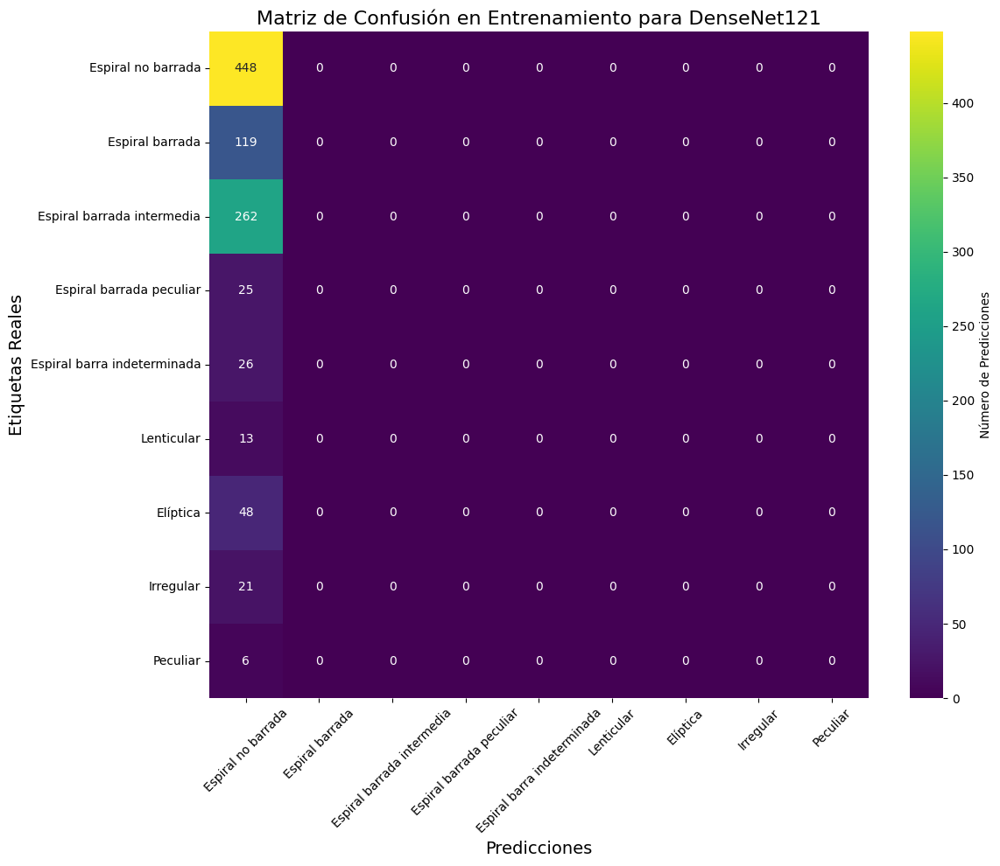

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 144ms/step

Informe de Clasificación sobre el Conjunto de Test para DenseNet121:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      1.00      0.63       112
            Espiral barrada       0.00      0.00      0.00        30
 Espiral barrada intermedia       0.00      0.00      0.00        65
   Espiral barrada peculiar       0.00      0.00      0.00         6
Espiral barra indeterminada       0.00      0.00      0.00         7
                 Lenticular       0.00      0.00      0.00         3
                   Elíptica       0.00      0.00      0.00        12
                  Irregular       0.00      0.00      0.00         6
                   Peculiar       0.00      0.00      0.00         1

                   accuracy                           0.46       242
                  macro avg       0.05      0.11      0.07       242
               weighted avg       0.21      0.46      0.29  

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

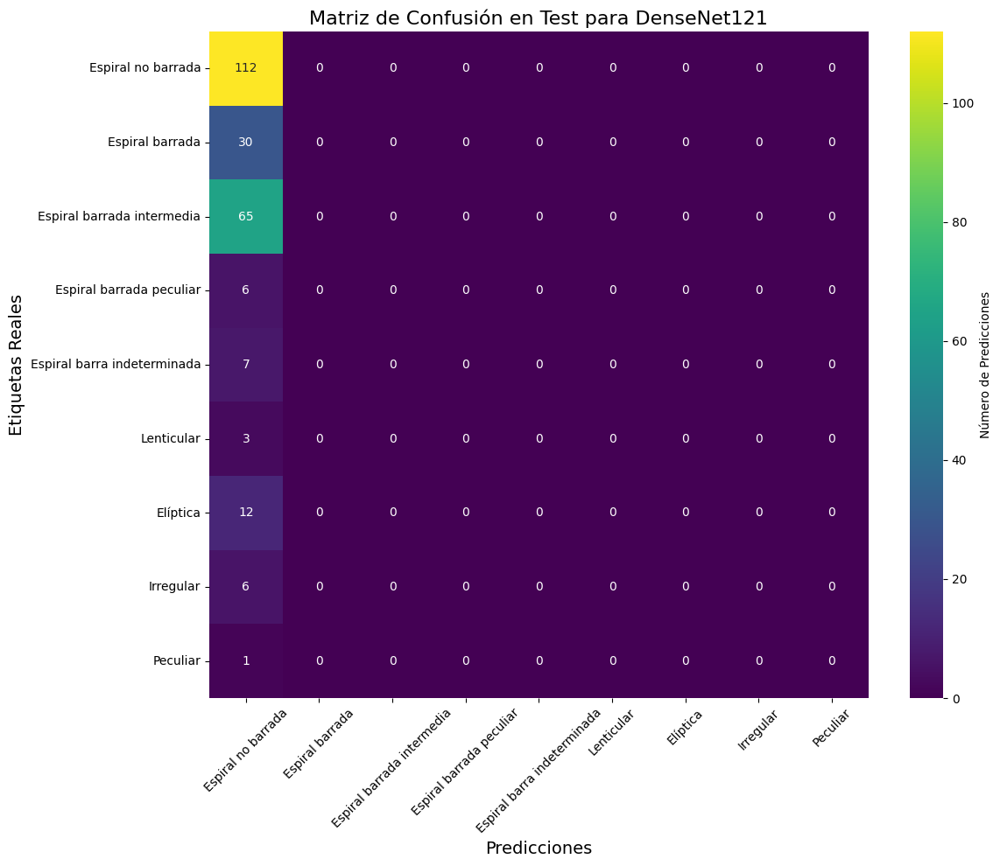

Evaluando el modelo ResNet50...
31/31 ━━━━━━━━━━━━━━━━━━━━ 10s 168ms/step

Informe de Clasificación sobre el Conjunto de Entrenamiento para ResNet50:
                              precision    recall  f1-score   support

         Espiral no barrada       0.47      0.99      0.63       448
            Espiral barrada       0.00      0.00      0.00       119
 Espiral barrada intermedia       0.71      0.04      0.07       262
   Espiral barrada peculiar       0.00      0.00      0.00        25
Espiral barra indeterminada       0.00      0.00      0.00        26
                 Lenticular       0.00      0.00      0.00        13
                   Elíptica       0.00      0.00      0.00        48
                  Irregular       0.00      0.00      0.00        21
                   Peculiar       0.00      0.00      0.00         6

                   accuracy                           0.47       968
                  macro avg       0.13      0.11      0.08       968
               weig

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

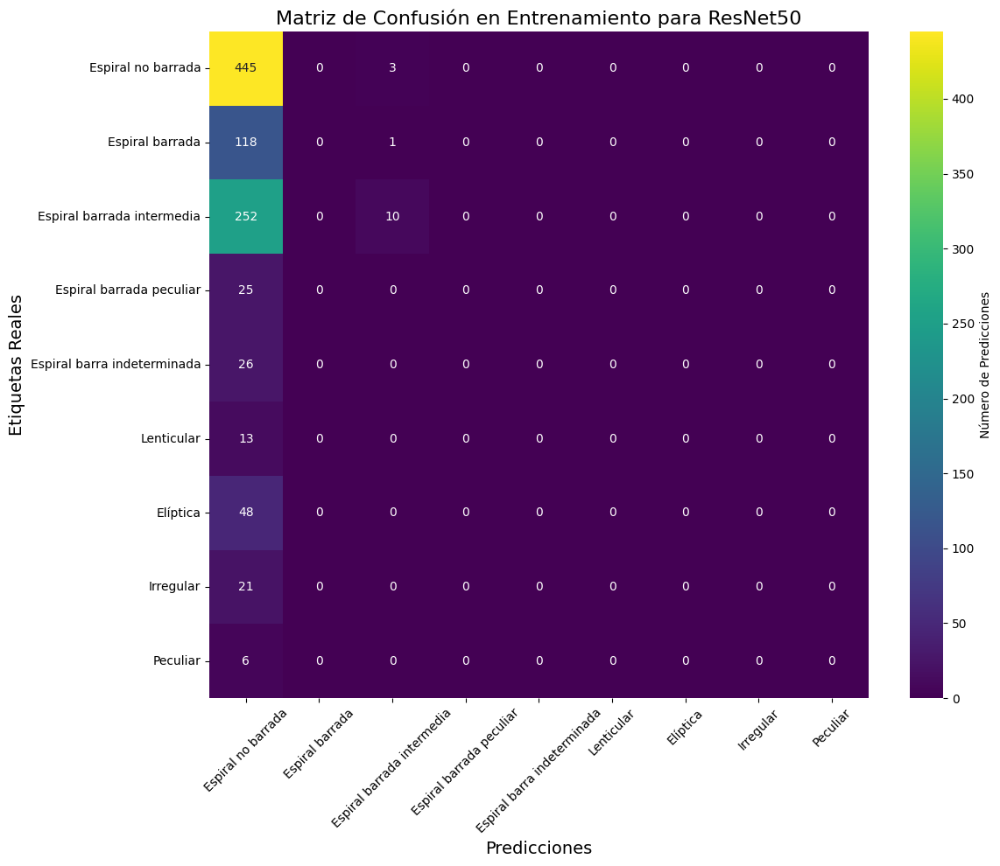

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 418ms/step

Informe de Clasificación sobre el Conjunto de Test para ResNet50:
                              precision    recall  f1-score   support

         Espiral no barrada       0.46      0.96      0.62       112
            Espiral barrada       0.00      0.00      0.00        30
 Espiral barrada intermedia       0.33      0.03      0.06        65
   Espiral barrada peculiar       0.00      0.00      0.00         6
Espiral barra indeterminada       0.00      0.00      0.00         7
                 Lenticular       0.00      0.00      0.00         3
                   Elíptica       0.00      0.00      0.00        12
                  Irregular       0.00      0.00      0.00         6
                   Peculiar       0.00      0.00      0.00         1

                   accuracy                           0.45       242
                  macro avg       0.09      0.11      0.08       242
               weighted avg       0.30      0.45      0.30     

/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/users/dae/rauldiez/tf/lib64/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(resu

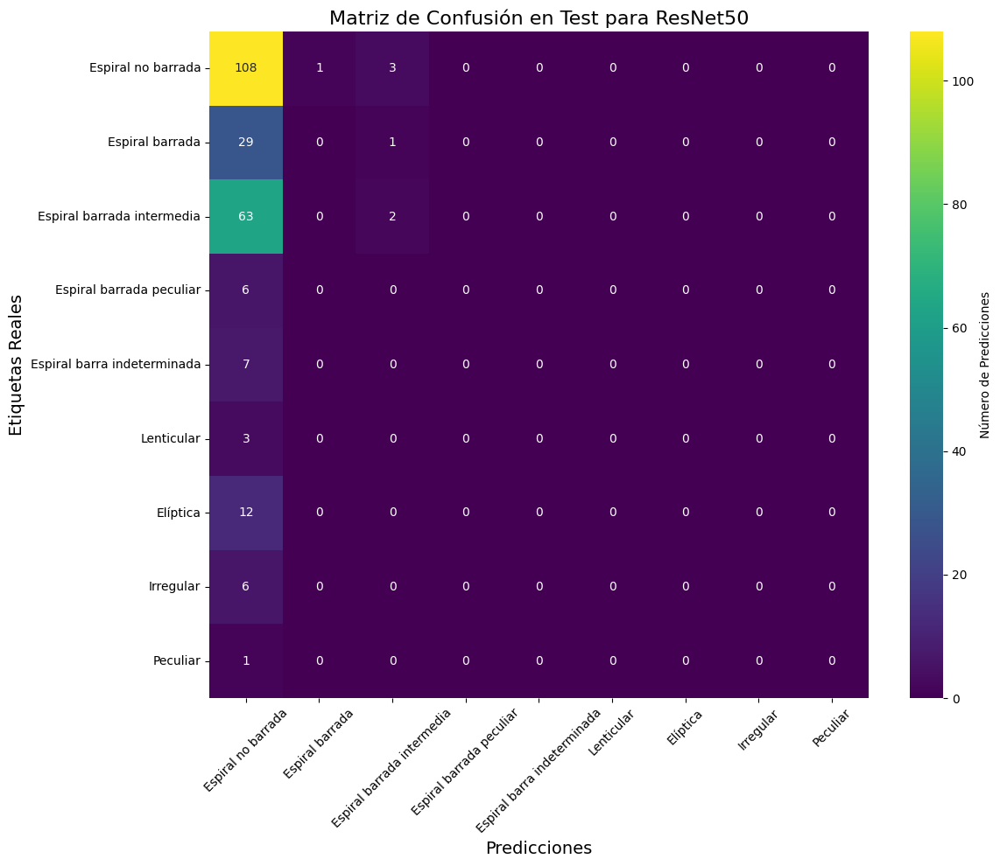

In [7]:
# Evaluar todos los modelos en ambos conjuntos (entrenamiento y test)
for nombre_modelo, ruta_modelo in modelos_guardados.items():
    evaluar_modelo(nombre_modelo, ruta_modelo, 
                   train_images_VGG16_clasif2, train_labels_VGG16_clasif2, 
                   test_images_VGG16_clasif2, test_labels_VGG16_clasif2)